In [798]:
# Debugging OKVQA
import json
import numpy as np
abs_path = "/home/diego/adv_comp_viz21/lxmert/orig_code/lxmert/"
orig_file = "data/okvqa/okvqa_ent_spans_may06_excluded.json"             ## ORIG
new_file = "data/okvqa/okvqa_ent_spans_sep04_excluded.json"
new_new_file = "data/okvqa/okvqa_ent_spans_sep04b_excluded.json"

entity_spans_dict = json.load(open(abs_path + new_new_file)) 
new_entity_spans_dict = json.load(open(abs_path + new_file)) 
orig_entity_spans_dict = json.load(open(abs_path + orig_file)) 

In [799]:
#len(entity_spans_dict)  #14055
#entity_spans_dict[0]   #[['hairstyle', 12, 21], ['blond', 29, 34]]  

#THIS LINES UP TO QUESTIONS IN OKVQA <--- 
OKVQA_DATA_ROOT = '/home/diego/adv_comp_viz21/lxmert/orig_code/lxmert/data/okvqa/' 

#split = "train"  #train, val, train_tv, val_tv,  test_tv, 
    
train_qs = json.load(open(OKVQA_DATA_ROOT + "OpenEnded_mscoco_train2014_questions.json"))
train_ans = json.load(open(OKVQA_DATA_ROOT + "mscoco_train2014_annotations.json"))

val_qs = json.load(open(OKVQA_DATA_ROOT + "OpenEnded_mscoco_val2014_questions.json"))   
val_ans = json.load(open(OKVQA_DATA_ROOT + "mscoco_val2014_annotations.json"))

# test_qs are the exact same as the val_qs
test_tv_qs = json.load(open(OKVQA_DATA_ROOT + "test_qs_okvqa.json"))
test_tv_ans = json.load(open(OKVQA_DATA_ROOT + "test_ans_okvqa.json"))

vtrain_qs = json.load(open(OKVQA_DATA_ROOT + "train_qs_okvqa.json"))
vtrain_ans = json.load(open(OKVQA_DATA_ROOT + "train_ans_okvqa.json"))

vval_qs = json.load(open(OKVQA_DATA_ROOT + "val_qs_okvqa.json"))        #use these for Error analysis
vval_ans = json.load(open(OKVQA_DATA_ROOT + "val_ans_okvqa.json"))  
                    


all_qs = train_qs['questions'] + val_qs['questions']

print(len(train_qs['questions']), len(val_qs['questions']), 
      len(vtrain_qs['questions']), len(vval_qs['questions']), 
      len(test_tv_qs['questions']), len(all_qs))  #14055
#    train 9009 9009
# train_tv 8000 8000
#   val_tv 1009 1009

#  test_tv 5046 5046
#      val 5046 5046

9009 5046 8000 1009 5046 14055


In [271]:
test_tv_qs['questions'] == val_qs['questions']   #true

True

In [272]:
#how many have ent spans?   
es_lens = [ len(v) for v in entity_spans_dict ]
print(np.mean(es_lens), np.min(es_lens), np.max(es_lens))

print(len([e for e in es_lens if e == 0]), len(es_lens))  

#orig_file
# (2.25, 0, 10)
#198 out of 14055 records are empty as it stands

# new_file
# 2.25, 0 10 )      <--- fuck maybe they are too similar!
#208 14055 

#2.251 0 10
#207 1405

2.2515119174670937 0 10
207 14055


In [273]:
#how much overlap  between new and prior results
same = 0
diffs = []
for i, nq in enumerate(entity_spans_dict):
    nset = set([e[0] for e in entity_spans_dict[i]])
    oset = set([e[0] for e in orig_entity_spans_dict[i]])
    if entity_spans_dict[i] == orig_entity_spans_dict[i] or len(nset.difference(oset)) == 0:
        same += 1
    else:
        diffs.append(i)
        
print(same, len(entity_spans_dict), same / len(entity_spans_dict), len(diffs))    
#11595 14055 0.8249 %same, 2460qs differ ( some are just different ordering of ents )
#12251 14055 0.8716 %same, 1804qs differ ( regardless of ordering )
#12107 14055 0.8614 %same, 1948qs differ ( using new b set )

12107 14055 0.8614016364283174 1948


In [90]:
!pwd

/home/diego/adv_comp_viz21/lxmert/orig_code


In [5]:
import os
os.chdir(f'./src/')

from lxrt.entry import load_wiki_embeddings
wiki_emb = load_wiki_embeddings()

/home/diego/adv_comp_viz21/lxmert/orig_code/lxmert_expl/lib/python3.7/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


Loading  /data/diego/adv_comp_viz21/ebert-master/resources/wikipedia2vec/wikipedia2vec-base-cased


In [406]:
#len(wiki_emb.dict_cache)  #0   this gets updated as you use it
#print([ d for d in dir(wiki_emb.model) if not d.startswith("_") ])
# ['dictionary', 'get_entity', 'get_entity_vector', 'get_vector', 'get_word', 'get_word_vector', 
# 'load', 'load_text', 'most_similar', 'most_similar_by_vector', 'save', 'save_text', 'syn0', 'syn1', 'train', 'train_params']

#print(len(wiki_emb.model.dictionary), [ d for d in dir(wiki_emb.model.dictionary) if not d.startswith("_") ])  
#5068233
# ['build', 'build_params', 'entities', 'entity_offset', 'entity_size', 'get_entity', 'get_entity_by_index', 'get_entity_index', 
# 'get_item_by_index', 'get_word', 'get_word_by_index', 'get_word_index', 'language', 'load', 'lowercase', 'min_paragraph_len',
# 'save', 'serialize', 'uuid', 'word_size', 'words']

# wiki_emb.model.most_similar('disney character')  
#TypeError: Argument 'item' has incorrect type (expected wikipedia2vec.dictionary.Item, got str)


ret1 = wiki_emb.model.dictionary.get_entity("Disney")  #<Entity The Walt Disney Company>
ret2 = wiki_emb.model.dictionary.get_word("Disney")    #<Word Disney>
ret3 = wiki_emb.model.dictionary.get_entity("Disney character")
ret4 = wiki_emb.model.dictionary.get_word("Disney character")
#Why do I use no prefix in code?  
# <-- this doesn't change anything except how things are stored/loaded
# and code wise it forces me to use entities through out ( as opposed to the option for words ) 

#ret1, ret2, ret3, ret4  #(<Entity The Walt Disney Company>, <Word Disney>, None, None)

#print(wiki_emb.model.get_entity('Disney'))  #same as dictionary call
print(wiki_emb.model.most_similar(wiki_emb.model.get_entity('Disney'), 5))
#[(<Entity The Walt Disney Company>, 1.0000001), 
# (<Word Disney>, 0.7013893), (<Word Walt>, 0.56133986), 
# (<Entity Michael Eisner>, 0.53799164), (<Entity Disney Parks, Experiences and Products>, 0.5247833)]

<Entity The Walt Disney Company>
[(<Entity The Walt Disney Company>, 1.0000001), (<Word Disney>, 0.7013893), (<Word Walt>, 0.56133986), (<Entity Michael Eisner>, 0.53799164), (<Entity Disney Parks, Experiences and Products>, 0.5247833)]


In [409]:
wiki_emb.model.dictionary.get_entity("Disney character") == None

True

In [6]:
#!pip install wikipedia
import wikipedia
print(wikipedia.search("battery"))


['Battery', 'Electric battery', 'List of battery sizes', 'Assault and battery', 'Lithium-ion battery', 'The Battery', 'Artillery battery', 'List of battery types', 'AAAA battery', 'Alkaline battery']


In [143]:
#'List of railway companies' in wiki_emb  #true
#'Railway_company' in wiki_emb  #true
#'Toy store' in wiki_emb
'List of battery types' in wiki_emb

True

In [7]:
os.chdir(f'/home/diego/adv_comp_viz21/lxmert/orig_code/lxmert/')
# now see how many of the new_new_ents show up in wiki_emb vs new_ents  vs orig_ents
#print('Barack Obama' in wiki_emb, 'barack obama' in wiki_emb, 'Barack obama' in wiki_emb)


nnset_hit, nnset_total, nnset_e, nnset_m = 0, 0, [], []
nset_hit, nset_total, nset_e, nset_e_i, nset_m, nset_m_i = 0, 0, [], [], [], []
oset_hit, oset_total, oset_e, oset_e_i, oset_m, oset_m_i = 0, 0, [], [], [], []
for i, nq in enumerate(entity_spans_dict):
    nnset = set([e[0] for e in entity_spans_dict[i]])
    nset = set([e[0] for e in new_entity_spans_dict[i]])
    oset = set([e[0] for e in orig_entity_spans_dict[i]])
    for e in nnset:
        nnset_total += 1
        if e in wiki_emb:
            nnset_hit +=1
            nnset_e.append(e)
        elif e.title() in wiki_emb:
            nnset_hit +=1
            nnset_e.append(e.title())
        elif e.capitalize() in wiki_emb:
            nnset_hit +=1
            nnset_e.append(e.capitalize())
        else:
            nnset_m.append(e)
    for e in nset:
        nset_total += 1
        if e in wiki_emb:
            nset_hit +=1
            nset_e.append(e)
            nset_e_i.append(i)
        elif e.title() in wiki_emb:
            nset_hit +=1
            nset_e.append(e.title())
            nset_e_i.append(i)
        elif e.capitalize() in wiki_emb:
            nset_hit +=1
            nset_e.append(e.capitalize())  
            nset_e_i.append(i)
        else:
            nset_m.append(e)
            nset_m_i.append(i)
    for e in oset:
        oset_total += 1
        if e in wiki_emb:
            oset_hit +=1 
            oset_e.append(e)
            oset_e_i.append(i)
        elif e.title() in wiki_emb:
            oset_hit +=1
            oset_e.append(e.title())
            oset_e_i.append(i)
        elif e.capitalize() in wiki_emb:
            oset_hit +=1
            oset_e.append(e.capitalize())
            oset_e_i.append(i)
        elif e.endswith("s") and e[0:-1].title() in wiki_emb:
            oset_hit +=1
            oset_e.append(e[0:-1].title())
            oset_e_i.append(i)

        else:
            oset_m.append(e)
            oset_m_i.append(i)


print("NNset hits:", nnset_hit, "out of ",nnset_total, "=", round(nnset_hit / nnset_total,4))
print("Nset hits:", nset_hit, "out of ",nset_total, "=", round(nset_hit / nset_total,4))
print("Oset hits:", oset_hit, "out of ",oset_total, "=", round(oset_hit / oset_total,4))

nn = sorted(list(set(nnset_e)))
n = sorted(list(set(nset_e)))
o = sorted(list(set(oset_e)))

print("\n\n!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\n\n")
print("\nNNset ents unique:",len(nn))#,nn)
print("\nNset ents unique:",len(n))# ,n)
print("\nOset ents unique:",len(o))# ,o)

print("\n\n!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\n\n")
nn = sorted(list(set(nnset_m)))
n = sorted(list(set(nset_m)))
o = sorted(list(set(oset_m)))
print("\nNNset missed ents unique:",len(nn))#,nn)
print("\nNset missed ents unique:",len(n))#,n)
print("\nOset missed ents unique:",len(o))#,o)



# DIRECT HITS
#NNset hits: 63 out of  31591 = 0.002   <-- IS THIS WHY IT DOESNT DO WELL!!!!  NOT NECESSARILY
#Nset hits: 61 out of  31615 = 0.0019
#Oset hits: 57 out of  31527 = 0.0018

# NNset ents unique: 48
#  Nset ents unique: 46
#  Oset ents unique: 43

# ---------------------------------------------------------------------
# WOW... way better with e or e.title()  <--- !!!!!!!
# NNset hits: 20062 out of  31591 = 0.6351   <-- least overall!
#  Nset hits: 20203 out of  31615 = 0.639
#  Oset hits: 20780 out of  31527 = 0.6591   

# NNset ents unique: 2715
#  Nset ents unique: 2707          <--- these three overcounted e and e.title() ?
#  Oset ents unique: 2670

# ---------------------------------------------------------
# NNset hits: 20062 out of  31591 = 0.6351   <--- exact same
#  Nset hits: 20203 out of  31615 = 0.639
#  Oset hits: 20780 out of  31527 = 0.6591 

# NNset ents unique: 2691
# Nset ents unique: 2683
# Oset ents unique: 2646

# NNset missed ents unique: 4176
#  Nset missed ents unique: 4027
#  Oset missed ents unique: 3202

# ---------------------------------------------------------
# NNset hits: 20872 out of  31591 = 0.6607        #adding or capitalize adds a lot to oset
# Nset hits: 20967 out of  31615 = 0.6632
# Oset hits: 21292 out of  31527 = 0.6754         <-- still the best in terms of hits, but are they good hits?

# NNset ents unique: 3168
# Nset ents unique: 3129
# Oset ents unique: 2962

# NNset missed ents unique: 3698
#  Nset missed ents unique: 3581
#  Oset missed ents unique: 2886

# ----------------- adding de-pluralize to Oset
# Oset hits: 21619 out of  31527 = 0.6857
# Oset ents unique: 3002
# Oset missed ents unique: 2783



# NEXT STEPS:  
# 1. see if you can get better hit rate ( see if there is a pattern in misses or way to find close matches)

 #  SEE IF CAN WE USE FUZZY MATCH TO SEE IF THERE ARE CLOSE MATCHES BETWEEN Oset hit and miss?

# 2. what does my code do now?  seems like it does use title() already..
#  looking at debug files in diego@macrodeep:~/adv_comp_viz21/lxmert/orig_code/lxmert_gen$ 

# this is using Nset
# cat ebert_tv0904_50newents_c.debug | egrep '^FOUND entity|^NOT FOUND Entity' > ebert_tv0904_50newents_c_ents_info
# --> 7242 FOUND vs 3939 NOT FOUND  =  (63.73% found)  sort in vim and count lines)

# this is using Oset
# cat ebert_tv0904_50_b.debug | egrep '^FOUND entity|^NOT FOUND Entity' > ebert_tv0904_50b_ents_info
# --> 7450 FOUND vs 3750 NOT FOUND  =  (66.51% found)  <-- so this is better
#   --> looking at what wasn't found
#   cat ebert_tv0904_50b_ents_info | grep '^NOT FOUND' | uniq > ebert_tv0904_50b_ents_info_notfound_uniq    #1411


""" src/lxrt/modeling.py

ent_title =  toks_to_str(ent_title_toks).title()  # looks like I am doing the title() thing though ?  
...

try:
   ent_vectors = np.array(wiki_emb[ent_title])         
   if debug:
       print("FOUND entity in wiki_emb", ent_title )    
   mapped_title_vectors = mapper.apply(ent_vectors)
except Exception as ex:
   if debug:
       print("NOT FOUND Entity in wiki_emb", ent_title)   #if we are missing alot we might need to retrain WikipediaVecs !
       
   mapped_title_vectors = []
   if " - " in ent_title or "' " in ent_title:
       ent_title = ent_title.replace(" - ","-").replace("' ","'")
       if ent_title in wiki_emb:
           if debug:
               print(" BUT THEN FOUND entity in wiki_emb", ent_title )    # FOUND entity ,  <-- TODO Debug when/why this is happening!
           ent_vectors = np.array(wiki_emb[ent_title])
           mapped_title_vectors = mapper.apply(ent_vectors)
"""
print()

NNset hits: 20872 out of  31591 = 0.6607
Nset hits: 20967 out of  31615 = 0.6632
Oset hits: 21619 out of  31527 = 0.6857


!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!



NNset ents unique: 3168

Nset ents unique: 3129

Oset ents unique: 3002


!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!



NNset missed ents unique: 3698

Nset missed ents unique: 3581

Oset missed ents unique: 2783



In [278]:
#x = 'barack obama'
#x.capitalize()  #'Barack obama'
#x.title()    #'Barack Obama'

# HOW MANY MISSES / HOW MANY OF OUR HITS SHOULD REALLY BE MISSES   <---
from fuzzywuzzy import process, fuzz
choices = list(oset_e) #["Atlanta Falcons", "New York Jets", "New York Giants", "Dallas Cowboys"]

print(len(set(oset_m)), "unique missed terms")  #2886
for i in range(0,50):    
    scorers = [fuzz.ratio]#, fuzz.partial_ratio, fuzz.token_set_ratio, fuzz.token_sort_ratio]
    for s in scorers:
        print(i,oset_m_i[i], oset_m[i], process.extract(oset_m[i], choices, limit=1, scorer=s),"\t",all_qs[oset_m_i[i]]['question'])

2783 unique missed terms
0 2 place [('Space', 80)] 	 Can you guess the place where the man is playing?
1 3 named [('Names', 80)] 	 Which rail company is named after a town in new mexico?
2 3 rail company [('Airline company', 81)] 	 Which rail company is named after a town in new mexico?
3 5 kids [('Skis', 75)] 	 Why do kids stare?
4 5 stare [('Star', 89)] 	 Why do kids stare?
5 6 piece [('Spice', 80)] 	 When was this piece of sporting equipment invented?
6 7 mode [('Movie', 67)] 	 Why is this officer using this mode of transportation?
7 8 wearing [('Learning', 80)] 	 Why is this an atypical look for someone wearing this makeup?
8 8 look [('Looks', 89)] 	 Why is this an atypical look for someone wearing this makeup?
9 9 associated [('Located', 71)] 	 Which american president is most associated with the stuffed animal seen here?
10 9 stuffed [('Situated', 67)] 	 Which american president is most associated with the stuffed animal seen here?
11 11 dreamworks animated film [('Animated', 50)

In [150]:
# HOW MANY OF OUR HITS SHOULD REALLY BE MISSES   <---
remove = ["Man","Guess","Playing","Find", ]   #entity to wiki
print(len(set(nset_e)), "unique terms found")  #2886
for i in range(0,50):    
    print(i,nset_e_i[i], nset_e[i],"\t",all_qs[nset_e_i[i]]['question'])


3129 unique terms found
0 0 Blond 	 What is the hairstyle of the blond called?
1 0 Hairstyle 	 What is the hairstyle of the blond called?
2 1 Canada 	 How old do you have to be in canada to do this?
3 2 Man 	 Can you guess the place where the man is playing?
4 2 Guess 	 Can you guess the place where the man is playing?
5 2 Playing 	 Can you guess the place where the man is playing?
6 3 Town 	 Which rail company is named after a town in new mexico?
7 3 New Mexico 	 Which rail company is named after a town in new mexico?
8 4 Water activity 	 Is the boy swimming or doing another water activity?
9 4 Swimming 	 Is the boy swimming or doing another water activity?
10 4 Boy 	 Is the boy swimming or doing another water activity?
11 6 Invented 	 When was this piece of sporting equipment invented?
12 6 Equipment 	 When was this piece of sporting equipment invented?
13 7 Transportation 	 Why is this officer using this mode of transportation?
14 7 Officer 	 Why is this officer using this mode of t

In [228]:
# Error analysis to see which of these we should get rid of for being too general
#!ls ../lxmert_gen/snap/okvqa/okvqa_ebert_tv0904_50_b/test_predict.json

label2ans = json.load(open(abs_path + "data/okvqa/train_label2ans.json")) 
ans2label = json.load(open(abs_path + "data/okvqa/train_ans2label.json")) 

print(len(label2ans), label2ans[0:4])
print(len(ans2label), type(ans2label), list(ans2label.keys())[0:4])

11508 ['', 'brey', 'suede', 'piccosso']
11508 <class 'dict'> ['', 'brey', 'suede', 'piccosso']


In [695]:
#"let go fly kite" in ans2label    #true
for a in ans2label:
    if "kite" in a:
        print(a)

kite surf
blossom kite festival
kite board
it kite on string
kite fly for better wind
kiteflying
let go fly kite
stunt kite
ski kite
try to fly kite
kite may fall and hit poeple
kite contest
kite day
fly kite
snow kite
kiteboarding
kite maker
kite
kite fly


In [284]:
#what are the types of each ans2label?   maybe thats a way to do analysis? 
import spacy
#nlp = spacy.load('en_core_web_sm')   #how does transformer do?
debug = False
anstypes = {'none':{'ans':[]}}

for a in list(ans2label.keys()):
    doc = nlp(a)
    if len(doc.ents) > 0:                        
        for idx , ent in enumerate(doc.ents):
            if debug:
                print([ ent.text, ent.start_char, ent.end_char, ent.label_])
            if ent.label_ not in anstypes:
                anstypes[ent.label_] = {'ans':[]}
            anstypes[ent.label_]['ans'].append(ent.text)
    else:
         anstypes['none']['ans'].append(a)
            
for at in anstypes:
    print(at, len(anstypes[at]['ans']))

"""  TYPE DISTRIBUTION OVER ANSWERS
none 8641
PERSON 774
QUANTITY 243
MONEY 38
ORG 670
NORP 115
CARDINAL 388
GPE 248
DATE 288
TIME 59
ORDINAL 26
LOC 36
PERCENT 5
EVENT 12
PRODUCT 5
LANGUAGE 1
WORK_OF_ART 1
FAC 2
"""

none 8641
PERSON 774
QUANTITY 243
MONEY 38
ORG 670
NORP 115
CARDINAL 388
GPE 248
DATE 288
TIME 59
ORDINAL 26
LOC 36
PERCENT 5
EVENT 12
PRODUCT 5
LANGUAGE 1
WORK_OF_ART 1
FAC 2


In [144]:
ans2type = { a:"" for a in list(ans2label.keys()) }
for at in anstypes:
    for ans in anstypes[at]['ans']:
        ans2type[ans] = at

NameError: name 'anstypes' is not defined

In [623]:
# list(ans2label.keys())

# if we knew all the possible answers, we could do initial contrastive learning to separate these answers from each other?

#orig
fin_fin_ents = json.load(open(abs_path + "data/okvqa/okvqa_ent_spans_may06_excluded.json"))    #fixed bug, and exclude common things 10 ents max

#new
#entity_spans_dict = json.load(open(abs_path + "data/okvqa/okvqa_ent_spans_sep04_excluded.json"))

#mostly used
#fin_fin_ents = json.load(open("data/okvqa/okvqa_ent_spans_sept07_fewk.json"))  #mostly used

#fin_fin_ents = json.load(open("data/okvqa/okvqa_ent_spans_sept07_fewk_b.json"))
#fin_fin_ents = json.load(open("data/okvqa/okvqa_ent_spans_sept07_fewkcc.json"))

In [610]:


bad_ents = [ (86, ['furniture', 45, 54,'Furniture']),
            (331, ['umbrella', 13, 21, 'Umbrella']),
            (366, ['eating utensils', 13, 28, 'List of eating utensils']),            
            (387, []),
            (485,[]), 
            (503,[]), 
            (506, ['transportation', 22, 36, 'Transport']),
            (513, ['scale train', 10, 21, 'Toy train']),
            (549, ['dinnerware', 13, 23, 'Tableware']),
            (785, ['picture book', 43, 55, 'Picture book']),
            (811, ['refraction', 13, 23, 'Refraction']),
            (834,[]),
            (836, ['gentleman', 5, 14, 'Gentleman']),
            (928, ['dried flowers', 4, 17, 'Floristry']),
            (980,[]),
            (1052, ['specific ingredient', 34, 53, 'Ingredient']),   #not the direct object
            (1112, ['architecture', 14, 26, 'Architecture']),
            (1195, ['furniture item', 12, 26, 'Human furniture']),   #to the left of, etc 
            (1347, ['hair style', 5, 15, 'Hairstyle']),
            (1355, []),   #generally not helpful for binary questions?  <-- TODO: is this true?
            (1613, []),   #not object of answer
            (1629, ['african herbavore', 18, 35, 'Herbivore']),
            (1632,[]),            
            (1717, ['american animal', 42, 57, 'American Animals']),
            (1788, ['consumption', 36, 47, 'Conspicuous consumption']),
            (1829,['pink food', 12, 21, 'Pink']),
            (1855, ['architecture', 14, 26, 'Architecture']),
            (1883, ['animal skin', 5, 16, 'Skin']),  #bad linkage 
            (1918, ['city view', 25, 34, 'Mountain View, California']),   #bad linkage            
            (2060,['category', 31, 39, 'Saffir–Simpson scale']),
            (2079,[]),(2153,[]), (2232,[]), (2270,[]),(2389,[]),(2523,[]),(2653,[]),
            (2673 ,[]), (2767, []),(2815,[]),
            (2843, ['rising agent', 5, 17, 'Mercury Rising']),(2902,[]),(2960,[]),
            (3016, []), (3105, []), (3160,[]),(3164,[]), (3215,[]), (3227,[]), (3383,[]), (3462,[]),
            (3490,[]), (3541,[]), (3664,[]), (3730,[]), (3783,[]), (3816,[]),
            (4005, []), (4065, []), (4081,[]), (4100,[]), (4200,[]), (4238, []), (4251,[]), (4305,[]),
            (4361,[]), (4417,[]), (4424,[]), (4434,[]), (4460,[]), (4462,['chemicals', 5, 14, 'Chemical substance']),
            (4514,[]), (4603,[]), (4625,[]), (4683,[]), (4688,[]), (4780,[]), (4988,[]), (5000,[]), (5033,[]), (5034,[])
           ]

changelink = [ (4089, 'Fast_food_restaurant'), ]  
fix = [(4855,['hand luke', 5, 14, 'Cool Hand Luke'],['Cool hand luke', 0, 14, 'Cool Hand Luke'])]

#go over okvqa_ent_spans_sept07_fewk.json and 
# find the ents that you removed from test (by id) and 
# remove them (by string ) from train as well as test

ent_names_to_remove = []
for ind, ent_span in bad_ents:
    if ent_span == []:
        ret_ents = fin_fin_ents[ind+9009]
        for r in ret_ents:
            #print("From [] Adding", ind, r[0], r[3] )
            ent_names_to_remove.append((r[0],r[3]))   #span name / wiki link
    else:
        ent_names_to_remove.append((ent_span[0], ent_span[3]))
    
fin_ents_to_remove = sorted(list(set(ent_names_to_remove)))
print("\n", len(fin_ents_to_remove))
print(fin_ents_to_remove,"\n")
fin_ents_to_remove_spans = [ a[0] for a in fin_ents_to_remove ]

removed = 0
pre_sum = sum([1 if len(a) > 0 else 0 for _, a in enumerate(fin_fin_ents)])

for ind, v in enumerate(fin_fin_ents):
    keep = []
    for eind, ent in enumerate(v):
        if ent[0] not in fin_ents_to_remove_spans:
            keep.append(ent)
        else:
            #print("Remove",ind, ent)
            removed +=1 
    fin_fin_ents[ind] = keep

post_sum = sum([1 if len(a) > 0 else 0 for _, a in enumerate(fin_fin_ents)])

print("Prior had ",pre_sum,"Entities")
print("Removed: ", removed, "Entities")
print("Post has ",post_sum,"Entities")

#with open("okvqa_ent_spans_sept08_cleaned.json", "w") as f:
#    json.dump(fin_fin_ents, f)
"""    
Prior had  4590 Entities
Removed:  636 Entities
Post has  4076 Entities
"""



 85
[('african herbavore', 'Herbivore'), ('age group', 'The Family (Australian New Age group)'), ('america', 'United States'), ('american animal', 'American Animals'), ('animal skin', 'Skin'), ('appearance', 'Appearance'), ('appliance', 'Home appliance'), ('architecture', 'Architecture'), ('attaches', 'Attached'), ('beginners', 'Beginners'), ('brand name', 'Brand'), ('brothers', 'Brother'), ('buildings', 'Building'), ('business', 'Business'), ('category', 'Saffir–Simpson scale'), ('chemicals', 'Chemical substance'), ('city view', 'Mountain View, California'), ('commercial service', 'United States Commercial Service'), ('consumption', 'Conspicuous consumption'), ('continent', 'Continent'), ('designer', 'Designer'), ('dinnerware', 'Tableware'), ('dried flowers', 'Floristry'), ('eating utensils', 'List of eating utensils'), ('emotional state', 'Emotion'), ('ethnicty', 'Creole peoples'), ('fabric product', 'Bluing (fabric)'), ('farm animal', 'Animal Farm'), ('food source', 'Food'), ('frui

'    \nPrior had  4590 Entities\nRemoved:  636 Entities\nPost has  4076 Entities\n'

In [611]:
# also while training.. look at unique ents regardless to see if there are weird things
from collections import Counter
unq_ents = []
for ind, v in enumerate(fin_fin_ents):
    if v != []:
        for eind, ent in enumerate(v):
            unq_ents.append((ent[0],ent[3]))
unq_ents_counts = Counter(unq_ents)
unq_ents_sorted = sorted(list(set(unq_ents)))
print("LEN unique ent-links", len(unq_ents_sorted), type(unq_ents_sorted))  #2908 unique out of 4076
#print(len(unq_ents_counts))
unq_ent_counts_sorted = sorted(unq_ents_counts.items(), key=lambda pair: pair[1], reverse=True)
for v, c in unq_ent_counts_sorted:
    if c > 30:
        print(v, c)
        

# 0908

#2. NEXT print unq_ents_sorted to file to find those with bad links to remove
ff = [ [v[0],v[1]] for v in unq_ents_sorted ]
#with open("fin_fin_unqs_ents_sorted.txt","w") as fp:
#    json.dump(ff, fp)

#for f in ff:
#    print(f)
#import sys
#sys.exit()


LEN unique ent-links 2908 <class 'list'>
('vehicles', 'Vehicle') 56
('computer', 'Computer') 40
('motorcycle', 'Motorcycle') 39
('ingredients', 'Ingredient') 38
('profession', 'Profession') 36


In [614]:
# look at final EDITED LIST in outnotes/fin_fin_unqs_ents_sorted.txt ( remove 1643 so left with 1265 unique ents )
# 1. Load it and 
"""
ent_updates = json.load(open("outnotes/fin_fin_unqs_ents_sorted.txt"))
#0: spanname, 1: wikiname, 2: newwikiname
# 2. only keep ents in fin_fin_ents  that appear in list | if len(2) remove otherwise use pos 3 as new wiki link 
for ent_v in ent_updates:
    if len(ent_v) == 2:
        # remove any ents from fin_fin_ents which matches span name and wikiname
        for ind, q in enumerate(fin_fin_ents):
            remove = []
            for eind, ev in enumerate(fin_fin_ents[ind]):
                if ev != []:
                    if len(ev) == 4 and len(ent_v) == 2:
                        if ent_v[0] == ev[0] and ent_v[1] == ev[3]:
                            remove.append(eind)
                    else:                        
                        print("Error Len ev != 4 or Len ent_v != 2",eind, ev, ent_v)
            if remove != []:
                tmp = fin_fin_ents[ind]
                fin_fin_ents[ind] = [ t for ti, t in enumerate(tmp) if ti not in remove ]
                #print(ind, "prior size: ",len(tmp)," and after remove now ", len(fin_fin_ents[ind]))
                
    elif len(ent_v) == 3:
        #update ent iwith new wikilink from ent_v
        for ind, q in enumerate(fin_fin_ents):
            for eind, ev in enumerate(fin_fin_ents[ind]):
                if ev != []:
                    if ent_v[0] == ev[0] and ent_v[1] == ev[3]:
                        #print(ind, eind, "prior to update", fin_fin_ents[ind][eind])
                        fin_fin_ents[ind][eind] = [ ent_v[0], fin_fin_ents[ind][eind][1], fin_fin_ents[ind][eind][2], ent_v[2] ]
                        #print("\t after updating now ", fin_fin_ents[ind][eind])
"""                
# 3. save out new and hopefully final ents list ( print out stats ) 
from collections import Counter
unq_ents = []
tot_qs_with_ents = 0
for ind, v in enumerate(fin_fin_ents):
    if v != []:
        tot_qs_with_ents +=1
        for eind, ent in enumerate(v):
            unq_ents.append((ent[0],ent[3]))

print("Total qs now with ent spans:", tot_qs_with_ents)  #2504
unq_ents_counts = Counter(unq_ents)
unq_ent_counts_sorted = sorted(unq_ents_counts.items(), key=lambda pair: pair[1], reverse=True)
print("Now Unique ent spans is: ",len(unq_ent_counts_sorted))  #1309
for v, c in unq_ent_counts_sorted:
    if c > 30:
        print(v, c)

with open("okvqa_ent_spans_sept08_cleaned_filtered.json","w") as fp:
    json.dump(fin_fin_ents, fp)
        
# 4. train on new ent system with ebert 
# 5. test 
# 6. inspect results for interesting numbers or patterns (fallback to plain, etc)


Total qs now with ent spans: 2504
Now Unique ent spans is:  1309
('vehicles', 'Vehicle') 56
('computer', 'Computer') 40
('motorcycle', 'Motorcycle') 39
('ingredients', 'Ingredient') 38
('profession', 'Profession') 36


14055
2504

 1 714 4989715 What are the vehicles in the picture used for?
Plain:  1 sail
Ebert:  0.667 fish
True: {'sail': 1, 'travel': 0.667, 'fish': 0.667}
Ents provided: [['vehicles', 13, 21, 'Vehicle']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000498971.jpg


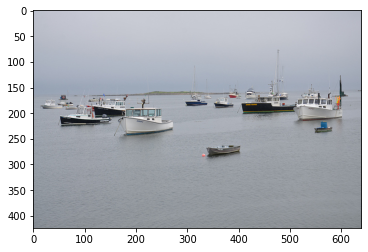


 2 795 1418215 What manufacturer sells that brand soda?
Plain:  1 pepsi
Ebert:  0 coke
True: {'pepsi': 1, 'mountain dew': 0.667, 'mtn dew': 0.667, 'mountaindew': 0.667}
Ents provided: [['brand soda', 29, 39, 'List of soft drink producers']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000141821.jpg


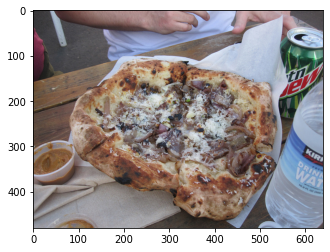


 3 825 4229985 Which of the condiment in the picture is a traditional burger fixing?
Plain:  1 mustard
Ebert:  0 ketchup
True: {'mustard': 1, 'mayo': 1}
Ents provided: [['condiment', 13, 22, 'Condiment']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000422998.jpg


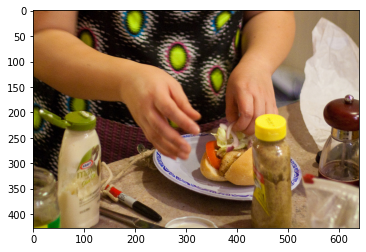


 4 839 4405395 What famous founding father was known for his association with this object?
Plain:  1 benjamin franklin
Ebert:  0 let go fly kite
True: {'benjamin franklin': 1, 'ben franklin': 0.667}
Ents provided: [['founding father', 12, 27, 'Founding Fathers of the United States']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000440539.jpg


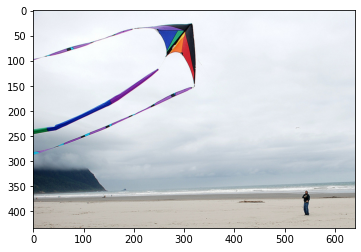


 5 1042 1635895 What nationality is represented by this crusty bread?
Plain:  1 french
Ebert:  0 american
True: {'french': 1, 'france': 0.667, 'italian': 0.667, 'italy': 0.667}
Ents provided: [['nationality', 5, 16, 'Nationality'], ['crusty bread', 40, 52, 'Bread']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000163589.jpg


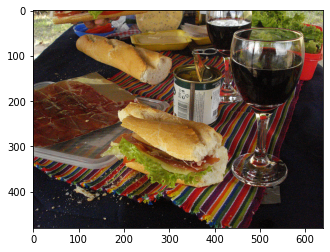


 6 1163 1786915 What type of neighborhood is this?
Plain:  1 urban
Ebert:  0 residential
True: {'urban': 1, 'downtown': 0.667, 'city': 0.667, 'chicago': 0.667}
Ents provided: [['neighborhood', 13, 25, 'Neighbourhood']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000178691.jpg


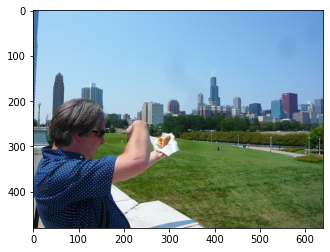


 7 1291 4560535 What sort of infrastructure is required to support this method of transportation?
Plain:  1 rail
Ebert:  0 train station
True: {'rail': 1, 'railway': 0.667, 'track': 0.667, 'train track': 0.667}
Ents provided: [['infrastructure', 13, 27, 'Infrastructure']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000456053.jpg


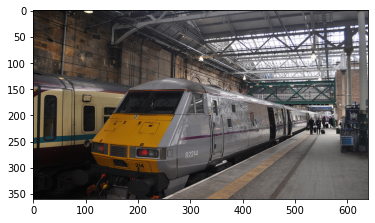


 8 1297 1386535 How many calories are typically in this type of food?
Plain:  0.667 200
Ebert:  0 500
True: {'131': 1, '1000': 0.667, '200': 0.667}
Ents provided: [['calories', 9, 17, 'Calorie']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000138653.jpg


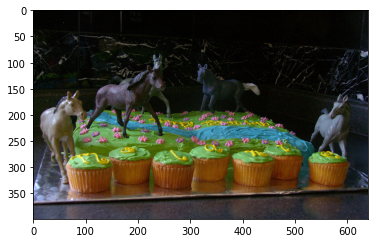


 9 1312 1938635 How many calories can you burn by playing this type of sport for an hour?
Plain:  0.667 500
Ebert:  0 100
True: {'1500': 1, '800': 0.667, '300': 0.667, '500': 0.667}
Ents provided: [['calories', 9, 17, 'Calorie']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000193863.jpg


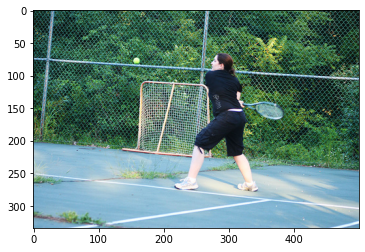


 10 1574 4228335 What brand is this computer?
Plain:  1 hp
Ebert:  0 dell
True: {'hp': 1, '': 0.667, 'apple': 0.667}
Ents provided: [['computer', 19, 27, 'Computer']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000422833.jpg


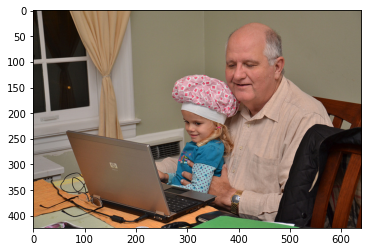


 11 1633 2938045 This was used to keep the house warm before central air?
Plain:  0.667 fire
Ebert:  0 brick
True: {'fireplace': 1, 'fire': 0.667}
Ents provided: [['central air', 44, 55, 'Air conditioning']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000293804.jpg


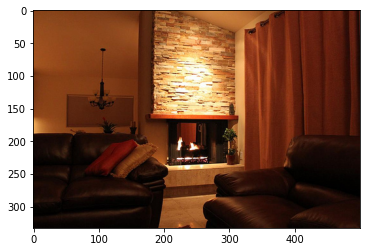


 12 1676 2675155 What brand of toothpaste is this?
Plain:  1 colgate
Ebert:  0 crest
True: {'colgate': 1}
Ents provided: [['toothpaste', 14, 24, 'Toothpaste']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000267515.jpg


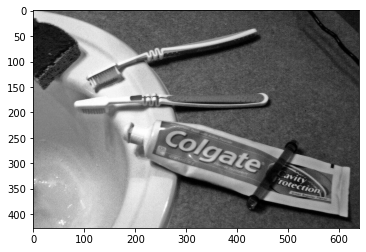


 13 1734 5120705 What model is this cell phone?
Plain:  1 motorola
Ebert:  0.667 nokia
True: {'motorola': 1, 'nokia': 0.667, 'motorola razr': 0.667, 'lg': 0.667}
Ents provided: [['cell phone', 19, 29, 'Mobile phone']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000512070.jpg


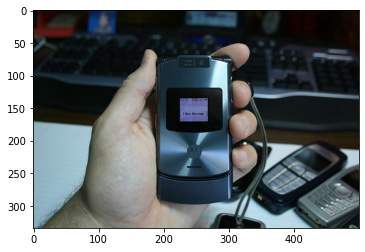


 14 1773 1486205 What brand of computer is this?
Plain:  0.667 dell
Ebert:  0 ibm
True: {'mac': 1, 'dell': 0.667, 'apple': 0.667, 'hp': 0.667}
Ents provided: [['computer', 14, 22, 'Computer']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000148620.jpg


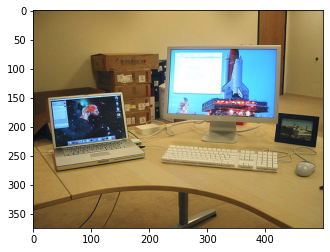


 15 1885 2970175 What are the ducks swimming in?
Plain:  1 water
Ebert:  0 lake
True: {'pond': 1, 'water': 1}
Ents provided: [['swimming', 19, 27, 'Swimming']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000297017.jpg


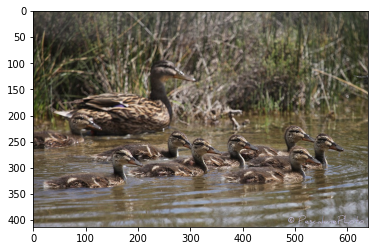


 16 1997 4686045 Is this an african or indian elephant?
Plain:  1 african
Ebert:  0.667 indian
True: {'african': 1, 'asian': 0.667, 'indian': 0.667}
Ents provided: [['elephant', 29, 37, 'Elephant']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000468604.jpg


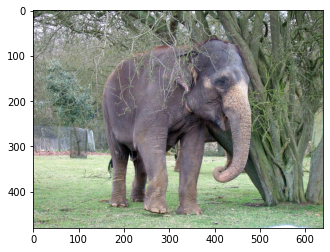


 17 2059 1000835 What cooking method was used to prepare both this sandwich and its side dish?
Plain:  1 fry
Ebert:  0 grill
True: {'fry': 1, 'grille': 0.667, 'fryer': 0.667}
Ents provided: [['cooking method', 5, 19, 'Cooking'], ['side dish', 67, 76, 'Side dish']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000100083.jpg


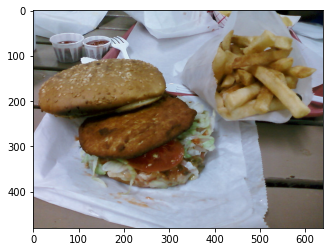


 18 2151 2382725 What type of elephant is this based on ear shape?
Plain:  1 african
Ebert:  0 elephant
True: {'african': 1, 'african elephant': 0.667, 'baby elephant': 0.667, 'indian': 0.667}
Ents provided: [['elephant', 13, 21, 'Elephant']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000238272.jpg


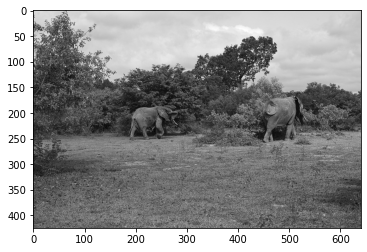


 19 2596 30015 What are these pastries made of?
Plain:  0.667 flour
Ebert:  0 paper
True: {'dough': 1, 'flour': 0.667, 'sugar dough flavor': 0.667}
Ents provided: [['pastries', 15, 23, 'Pastry']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000003001.jpg


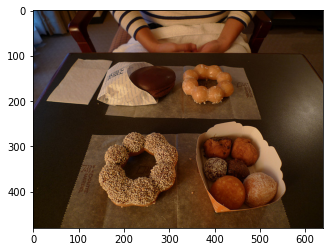


 20 2697 859055 How many calories will the person consumes if he eats all the donuts?
Plain:  0.667 200
Ebert:  0 500
True: {'1500': 1, '3000': 0.667, '1 thousand': 0.667, '200': 0.667}
Ents provided: [['calories', 9, 17, 'Calorie']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000085905.jpg


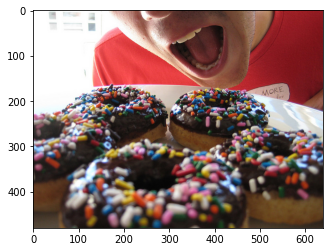


 21 2776 3027875 A beverage is represented here what brand is its opposite in the cola wars?
Plain:  1 pepsi
Ebert:  0 coke
True: {'pepsi': 1, 'coca cola': 0.667}
Ents provided: [['beverage', 2, 10, 'Drink']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000302787.jpg


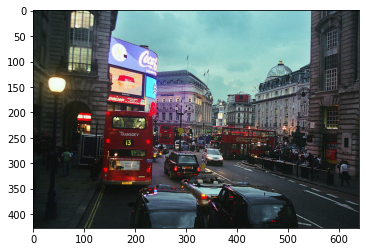


 22 2998 547185 Are these elephants from india africa or southeast asia?
Plain:  0.667 africa
Ebert:  0 indian
True: {'southeast asia': 1, 'africa': 0.667, 'india': 0.667, 'south east asia': 0.667}
Ents provided: [['elephants', 10, 19, 'Elephant'], ['southeast asia', 41, 55, 'Southeast Asia']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000054718.jpg


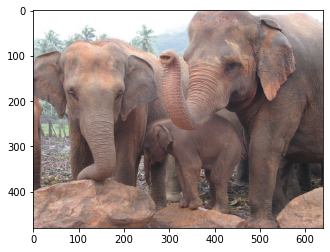


 23 3080 3500035 Is this an ambulance or firetruck?
Plain:  1 firetruck
Ebert:  0.667 fire
True: {'firetruck': 1, 'fire': 0.667, 'firetrick': 0.667, 'fire truck': 0.667}
Ents provided: [['ambulance', 11, 20, 'Ambulance'], ['firetruck', 24, 33, 'Fire engine']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000350003.jpg


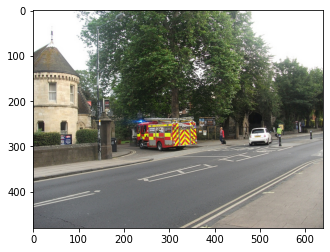


 24 3094 2791385 Imagine this photo was taken in germany which european holiday do you think they are celebrating with lots of presents?
Plain:  1 christmas
Ebert:  0 valentine's day
True: {'christmas': 1, 'saint nicolas day': 0.667, 'weihnachten': 0.667}
Ents provided: [['germany', 32, 39, 'Germany'], ['european holiday', 46, 62, 'Public holidays in the European Union']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000279138.jpg


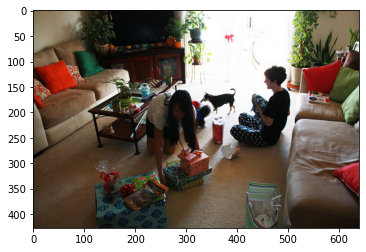


 25 3130 1740705 The stuffed animal in the photo is called what kind of bear?
Plain:  1 teddy
Ebert:  0.667 teddy bear
True: {'teddy': 1, 'teddy bear': 0.667}
Ents provided: [['stuffed animal', 4, 18, 'Stuffed toy']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000174070.jpg


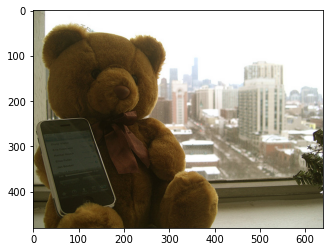


 26 3146 1454395 What fish do north american bears like to catch as they swim upstream?
Plain:  1 salmon
Ebert:  0 fish
True: {'salmon': 1}
Ents provided: [['north american bears', 13, 33, 'American black bear']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000145439.jpg


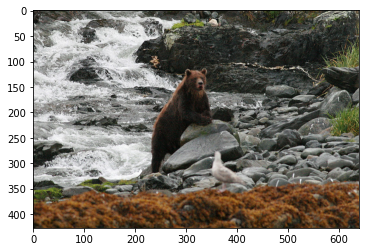


 27 3609 2142475 What is the complimentary color to the right man's shirt?
Plain:  1 red
Ebert:  0 blue
True: {'red': 1, 'green': 1, 'purple': 0.667}
Ents provided: [['complimentary color', 12, 31, 'Complementary colors']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000214247.jpg


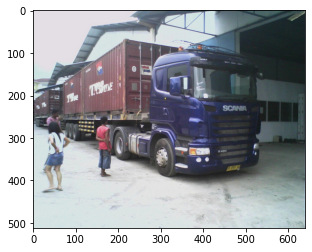


 28 3709 5441205 How many calories are in this food?
Plain:  0.667 500
Ebert:  0 400
True: {'300': 1, 'lot': 0.667, '1100': 0.667, '500': 0.667}
Ents provided: [['calories', 9, 17, 'Calorie']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000544120.jpg


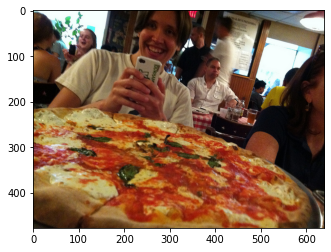


 29 3761 1233605 Ansal adams used what instrument?
Plain:  1 guitar
Ebert:  0 bike
True: {'camera': 1, 'guitar': 1}
Ents provided: [['Ansal adams', 0, 11, 'Ansel Adams']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000123360.jpg


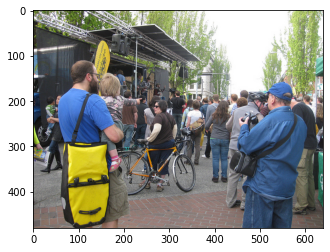


 30 3849 4192355 What institution are these children going to?
Plain:  1 school
Ebert:  0 bus
True: {'school': 1, 'fbi': 0.667}
Ents provided: [['institution', 5, 16, 'Institution']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000419235.jpg


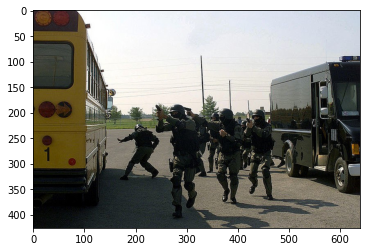


 31 3855 2524035 When was the company on this toothbrush founded?
Plain:  0.667 1940
Ebert:  0 colgate
True: {'1806': 1, '1900': 0.667, '1921': 0.667, '1940': 0.667}
Ents provided: [['toothbrush', 29, 39, 'Toothbrush']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000252403.jpg


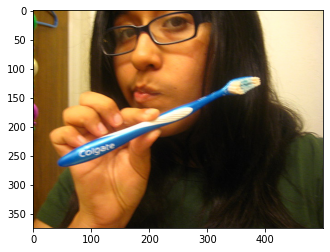


 32 3927 1839145 What is the brand name of the cell phone being used in this photo?
Plain:  1 motorola
Ebert:  0 nokia
True: {'motorola': 1}
Ents provided: [['cell phone', 30, 40, 'Mobile phone']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000183914.jpg


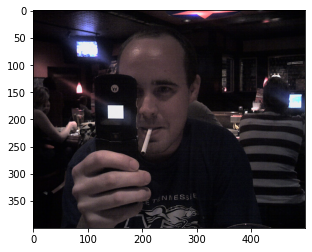


 33 3948 1631055 This plush toy was named after what us president?
Plain:  1 theodore roosevelt
Ebert:  0 teddy bear
True: {'theodore roosevelt': 1, 'theodore teddy roosevelt': 0.667, 'teddy': 0.667, 'roosevelt': 0.667}
Ents provided: [['plush toy', 5, 14, 'Stuffed toy'], ['president', 39, 48, 'President']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000163105.jpg


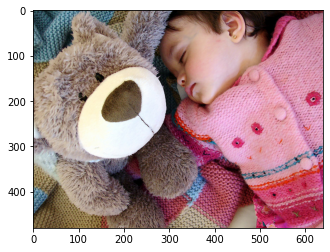


 34 4020 2163205 Can you guess the material out of which the washbasin is made?
Plain:  0.667 porcelain
Ebert:  0 towel
True: {'marble': 1, 'porcelain': 0.667, 'granite': 0.667}
Ents provided: [['washbasin', 44, 53, 'Sink']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000216320.jpg


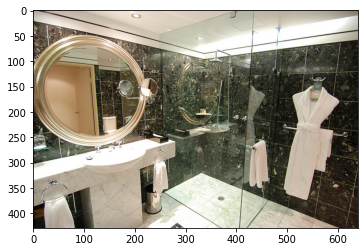


 35 4089 3894005 What fast food chain might sell entrees produced by this type of livestock?
Plain:  1 mcdonalds
Ebert:  0 steak
True: {'mcdonalds': 1, "mcdonald's": 0.667, 'wendys': 0.667}
Ents provided: [['food chain', 10, 20, 'Food chain'], ['livestock', 65, 74, 'Livestock']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000389400.jpg


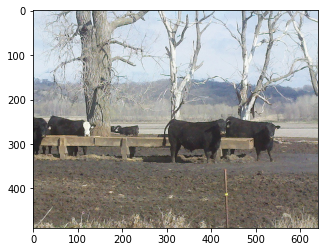


 36 4116 1061135 What is covering the wooden table under the dishes?
Plain:  1 tablecloth
Ebert:  0 cloth
True: {'tablecloth': 1, 'plastic': 0.667, 'gravel': 0.667, 'table cloth': 0.667}
Ents provided: [['wooden table', 21, 33, 'Table (furniture)']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000106113.jpg


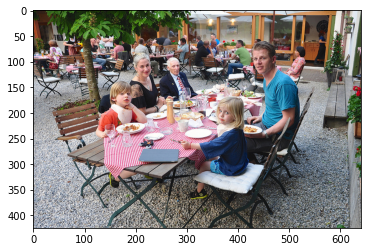


 37 4246 5498825 How many calories in this meal?
Plain:  1 500
Ebert:  0 400
True: {'1000': 1, '500': 1, '700': 0.667}
Ents provided: [['calories', 9, 17, 'Calorie']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000549882.jpg


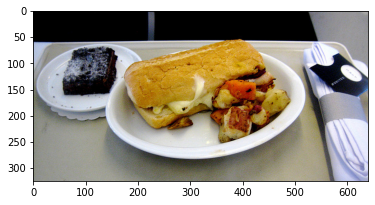


 38 4307 4617745 What is the gestation period for the animal shown here?
Plain:  1 13 months
Ebert:  0 10 months
True: {'13 months': 1, '12 months': 1, '1 year': 0.667}
Ents provided: [['gestation period', 12, 28, 'List of mammalian gestation durations']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000461774.jpg


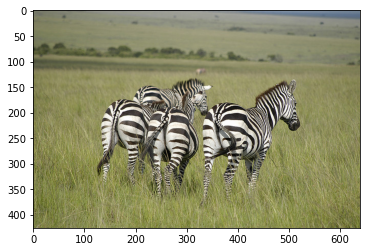


 39 4341 2233275 Why is the man wearing a heavy crown jacket?
Plain:  1 cold
Ebert:  0 cold weather
True: {'cold': 1, 'snow': 0.667, 'it cold': 0.667}
Ents provided: [['crown jacket', 31, 43, 'A-2 jacket']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000223327.jpg


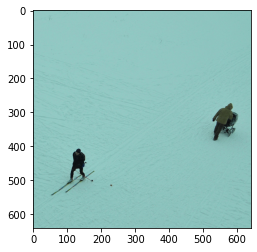


 40 4346 1079395 What type of camera lens took this photo?
Plain:  1 fisheye
Ebert:  0 wide angle
True: {'fisheye': 1, 'panaramic': 0.667, 'fish eye': 0.667}
Ents provided: [['camera lens', 13, 24, 'Camera lens']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000107939.jpg


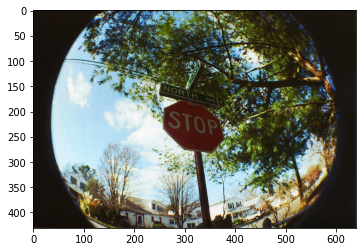


 41 4872 4522635 What type of bear species is shown in the picture?
Plain:  1 brown
Ebert:  0.667 grizzly
True: {'brown': 1, 'grizzly': 0.667}
Ents provided: [['bear species', 13, 25, 'Bear']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000452263.jpg


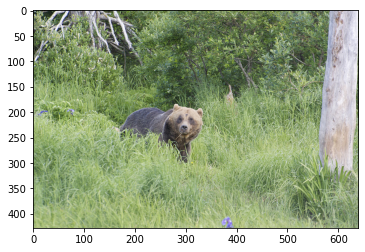


 42 4895 2295995 What antioxidants does this fruit contain?
Plain:  1 vitamin c
Ebert:  0 orange
True: {'vitamin c': 1, 'lutein': 0.667, 'antioxidant': 0.667}
Ents provided: [['antioxidants', 5, 17, 'Antioxidant']]
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000229599.jpg


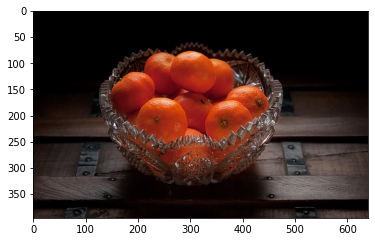

Scores
Plain:  2199.333333333341  out of  5046 = 0.4359
EBERT:  2168.333333333344  out of  5046 = 0.4297
Plain better: 218 EBERT better: 181 Same: 4647 4012 635
Diff of  30.99999999999727

Scores based on having available ents:
Plain:  325.6666666666668  out of  890 = 0.3659
EBERT:  326.00000000000006  out of  890 = 0.3663
Plain better: 42 , EBERT better: 43 
	Same Acc: 805 Same Acc/ans: 639 Same Acc/Diff Ans: 166
Diff of  -0.33333333333325754


In [693]:

#fin_fin_ents = json.load(open(abs_path + "data/okvqa/okvqa_ent_spans_may06_excluded.json"))   #orig fixed bug, and exclude common things 10 ents max
#fin_fin_ents = json.load(open(abs_path + "data/okvqa/okvqa_ent_spans_sep04_excluded.json"))  #13847, NOT USED (near same as above)
#fin_fin_ents = json.load(open("data/okvqa/okvqa_ent_spans_sept07_fewk.json"))                 #"new"  
#fin_fin_ents = json.load(open("data/okvqa/okvqa_ent_spans_sept07_fewk_b.json"))               #"new_b"
#fin_fin_ents = json.load(open(abs_path +  "data/okvqa/okvqa_ent_spans_sept07_fewk_cc.json"))  #new_c
#fin_fin_ents = json.load(open(abs_path +  "data/okvqa/okvqa_ent_spans_sept08_cleaned.json") ) # ent_set == '4k'
fin_fin_ents = json.load(open(abs_path +  "data/okvqa/okvqa_ent_spans_sept08_cleaned_filtered.json"))  #ent_set == '2p5k'
                         

#using fin_fin_ents set 
#plain_resf = "../lxmert_gen/snap/okvqa/okvqa_plain_0904_ml50_results/test_predict.json"    
plain_resf = "../lxmert_gen/snap/okvqa/okvqa_plain_0907_20eps_newents_res/test_predict.json"

#ebert_resf = "../lxmert_gen/snap/okvqa/okvqa_ebert_tv0904_50_b/test_predict.json"             #orig 40.2 
#ebert_resf = "../lxmert_gen/snap/okvqa/okvqa_ebert_0907_20eps_newents_res/test_predict.json"   
#ebert_resf = "../lxmert_gen/snap/okvqa/okvqa_ebert_0907_20eps_newentsb_res/test_predict.json"  #fewk_b
#ebert_resf = "../lxmert_gen/snap/okvqa/okvqa_ebert_0907_20eps_newentsc_res/test_predict.json"  #fewk_cc
#ebert_resf = "../lxmert_gen/snap/okvqa/okvqa_ebert_0908_20eps_4kents_on0907mod_res/test_predict.json"  #ent_set 4k 0.4304
#ebert_resf = "../lxmert_gen/snap/okvqa/okvqa_ebert_0908_20eps_4kents_on0908mod_res/test_predict.json"  #ent_set 4k 0.4324
ebert_resf = "../lxmert_gen/snap/okvqa/okvqa_ebert_0908_20eps_2p5kents_res/test_predict.json"   #ent_set 2.5k 42.97

preds2ent = {"okvqa_ebert_tv0904_50_b": "Ent Set: Orig 13857 -> 40.34",
"okvqa_ebert_0907_20eps_newents_res": "Ent Set: New 4590 -> 42.48", 
"okvqa_ebert_0907_20eps_newentsb_res": "Ent Set: NewB 4568 -> 42.62",
"okvqa_ebert_0907_20eps_newentsc_res": "Ent Set: NewC 4514 -> 42.91",
"okvqa_ebert_0908_20eps_4kents_on0908mod_res": "Ent Set: 4K 4076 -> 43.24",    
"okvqa_ebert_0908_20eps_2p5kents_res": "Ent Set: 2.5K 2504 -> 42.97"}

for k in preds2ent:
    if k in ebert_resf:
        ENT_INFO = preds2ent[k]

# RUN 10 epoch runs for the last 2 EBERT sets here

print(len(all_qs))
print(sum([1 if len(f) > 0 else 0 for f in fin_fin_ents])) 

"""
#Number of questions with ent_sets out of possible 14055 questions  ( finer quality spans as less in number )
#############################
   raw, pct,   Ent spans file endin, ent_name,   test_preds folder
 13857, 98.59, '_may06_excluded'   ,  "orig" , "okvqa_ebert_tv0904_50_b" 
  4590, 32.65, '_sept07_fewk'      ,  "new"  , "okvqa_ebert_0907_20eps_newents_res 
  4568, 32.50, '_sept07_fewk_b'    ,  "new_b", "okvqa_ebert_0907_20eps_newentsb_res"
  4514, 32.11, '_sept07_fewk_cc'   ,  "new_c", "okvqa_ebert_0907_20eps_newentsc_res"
  4076, 29.00, '_sept08_cleaned'   ,  "4k"   , "okvqa_ebert_0908_20eps_4kents_on0908mod_res",      
  2504, 17.81, '08_cleaned_filtered', "2.5K" , "okvqa_ebert_0908_20eps_2p5kents_res"                        
#############################

#Test performance over all 5046 questions
#############################
  mod, ents,  score  , pct   ,      plain better,  ebert better,       same acc, &ans, &diff ans
Plain,        2199.33, 0.4359
EBERT orig,   2035.33, 0.4034, Plain better: 488, EBERT better: 276, Same: 4282, 3266, 1016
EBERT new  ,  2143.33, 0.4248, Plain better: 318, EBERT better: 255, Same: 4473, 3623, 850
EBERT new_b,  2150.66, 0.4262, Plain better: 310, EBERT better: 255, Same: 4481, 3631, 850
EBERT new_c,  2165.00, 0.4291, Plain better: 296, EBERT better: 255, Same: 4495. 3645, 850
EBERT "4K",   2182.00, 0.4324, Plain better: 244, EBERT better: 231, Same: 4571, 3810, 761
EBERT "2.5K", 2168.33, 0.4297, Plain better: 218, EBERT better: 181, Same: 4647, 4012, 635
#############################

#Test scores based on questions having available ent_spans ( out of 5046 possible test questions):      
#############################
  ents, model,  score, totq,    pct, better than other,   same acc, &ans, &diff ans,
"orig", Plain, 2182.33, 4969, 0.4392, Plain better: 479, Same: 4219, 3215, 1004
"orig", EBERT, 2000.33, 4969, 0.4026, EBERT better: 271, "", "", ""
"new" , Plain,  637.99, 1642, 0.3886, Plain better: 128, Same: 1420, 1047, 373
"new" , EBERT,  603.66, 1642, 0.3676, EBERT better: 94,  "", "", ""
"newb", Plain,  617.99, 1620, 0.3815, Plain better: 106, Same: 1420, 1047, 373
"newb", EBERT,  603.66, 1620, 0.3726, EBERT better: 94,  "", "", "" 
"newc", Plain:  568.66, 1566, 0.3631, Plain better: 50,  Same: 1422, 1049, 373
"newc", EBERT:  605.66, 1566, 0.3868, EBERT better: 94,  "", "", "" 
"4K"  , Plain,  492.33, 1384, 0.3557, Plain better: 63,  Same: 1254,  931, 323
"4K"  , EBERT,  497.00, 1384, 0.3591, EBERT better: 67,  "", "", "" 
"2.5K", Plain:  325.66,  890, 0.3659, Plain better: 42,  Same:  805,  639, 166        
"2.5K", EBERT:  326.00,  890, 0.3663, EBERT better: 43,  "", "", ""         
#############################


#Test scores based on questions having available ent_spans ( out of 5046 possible test questions):    
#############################
  ents, model,  score, totq,    pct, better than other,   same acc, &ans, &diff ans,
"orig", Plain, 2182.33, 4969, 0.4392, Plain better: 479, Same: 4219, 3215, 1004
"new" , Plain,  637.99, 1642, 0.3886, Plain better: 128, Same: 1420, 1047, 373
"newb", Plain,  617.99, 1620, 0.3815, Plain better: 106, Same: 1420, 1047, 373
"newc", Plain:  568.66, 1566, 0.3631, Plain better: 50,  Same: 1422, 1049, 373
"4K"  , Plain,  492.33, 1384, 0.3557, Plain better: 63,  Same: 1254,  931, 323
"2.5K", Plain:  325.66,  890, 0.3659, Plain better: 42,  Same:  805,  639, 166        

ents, model,  score, totq,    pct, better than other,   same acc, &ans, &diff ans,
"orig", EBERT, 2000.33, 4969, 0.4026, EBERT better: 271, "", "", ""
"new" , EBERT,  603.66, 1642, 0.3676, EBERT better: 94,  "", "", ""
"newb", EBERT,  603.66, 1620, 0.3726, EBERT better: 94,  "", "", "" 
"newc", EBERT:  605.66, 1566, 0.3868, EBERT better: 94,  "", "", "" 
"4K"  , EBERT,  497.00, 1384, 0.3591, EBERT better: 67,  "", "", "" 
"2.5K", EBERT:  326.00,  890, 0.3663, EBERT better: 43,  "", "", ""         
#############################

# 2.5K
# <-- much few ent spans overall and pct is same
#<-- these ent spans are much cleaner, but it seems more important is highlighting 

"Q: Plain (orig):  2220.00  out of  5046 = 0.44     <--- what happened between Orig and New_b that hurt Plain performance?


"""




def prep_val_ques_dict(val_ans):
    q2eval = {}
    for ans_set in val_ans['annotations']:        
        dlabel = {}
        for ans_dict in ans_set['answers']:
            ans = ans_dict['answer']
            if ans not in dlabel:
                dlabel[ans] = 0
            dlabel[ans] += 1        
        #{'race': 6, 'name': 2, 'other':2 }
        #normalize label answer scores ( between 0 and 1 ... divide by 3 and max 1 )
        sum_labs = sum([dlabel[a] for a in dlabel])
        for a in dlabel:
            dlabel[a] = min(dlabel[a]/3,1)
        #{'race': 1, 'name:' .66, 'other': .66}  0
        
        q2eval[str(ans_set['question_id'])] = dlabel
    return q2eval

def eval_plain_v_ebert(plain, ebert, ans_set, q, debug = False):
    
    if debug:
        print("\nQuestion:", q )
        print("Checking: Plain", plain, label2ans[int(plain['answer'])])
        print("Checking: EBert", ebert, label2ans[int(ebert['answer'])])
        print("Ans Set:", ans_set)            

    assert(plain['question_id'] == ebert['question_id'])
    assert(str(q['question_id']) == ebert['question_id'])
    
    # NEED TO LOOKUP ANSWERS FROM ANSWERDICT since ebert and plain give answer ids and not answers
    escr, pscr = 0, 0
    ebert_ans = label2ans[int(ebert['answer'])]
    plain_ans = label2ans[int(plain['answer'])]
    if ebert_ans in ans_set:
        escr = ans_set[ebert_ans]
    if plain_ans in ans_set:
        pscr = ans_set[plain_ans]

    return pscr, escr, plain_ans, ebert_ans, ans_set

plain_res = json.load(open(plain_resf))
ebert_res = json.load(open(ebert_resf))
                      
#print(len(plain_res), len(ebert_res), type(plain_res))  #5046 5046 list
#print(plain_res[0]) #{'answer': '7239', 'question_id': '2971475'}
#print(val_ans['annotations'][0])  ### <--- tHIS IS WHY THE NUMBERS FOR PERTURB_OKVQA WERE OFF
#print(type(val_ans), list(val_ans.keys()))

valqid2imgid = { q['question_id']: ("0" * (12 - len(str(q['image_id'])))) + str(q['image_id']) + ".jpg" for q in val_qs['questions'] }

q2eval = prep_val_ques_dict(val_ans)
pscr, escr = 0, 0
plans, ebans, true_ans = [], [], []
pbetter, ebetter, same, same_diff = [], [], [], []
pans_types, eans_types = {}, {}
all_ans = []
pscr_with_ents, plans_with_ent_sets, escr_with_ents, ebans_with_ent_sets = 0, [], 0, []
pbetter_we, ebetter_we, same_we, same_diff_we = [], [], [], []
ex_count = 1
for ind in range(len(plain_res)):
    res = eval_plain_v_ebert(plain_res[ind],
                             ebert_res[ind], 
                             q2eval[plain_res[ind]['question_id']],
                             val_qs['questions'][ind],
                            debug = False)
    pscr += res[0]
    escr += res[1]
    plans.append(res[2])
    ebans.append(res[3])
    true_ans.append(res[4])
    all_ans.append([res[0], res[1]])
  
    #0907 
    cur_ents = fin_fin_ents[ind+9009]           #make sure to load correct fin fin ents set that was used
    cond = ind < 9000 #ind > 3000 and ind < 4000      # SET THIS TO LOOK AT SUBSETS OF DATA
    
    if len(cur_ents) > 0 and cond:   #look at 1st 1000 
        pscr_with_ents += res[0]
        escr_with_ents += res[1] 
        plans_with_ent_sets.append(res[2])
        ebans_with_ent_sets.append(res[3])
        
        if cond and res[0] > res[1]:     # res[0] greater means PLAIN better, res[1] greater means EBERT better
            print("\n",ex_count, ind, val_qs['questions'][ind]['question_id'], val_qs['questions'][ind]['question'])
            print("Plain: ",round(res[0],3), res[2])
            print("Ebert: ",round(res[1],3), res[3])
            print("True:", {k:round(res[4][k],3) for k in res[4]})
            print("Ents provided:",[ [c[0],c[1],c[2],c[3]] for c in cur_ents])
            show_image("COCO_val2014_" + valqid2imgid[val_qs['questions'][ind]['question_id']])
            

            ex_count += 1
    """
    # TO record by soft max ans types 
    pans_type = ans2type[res[2]]    
    if pans_type not in pans_types:
        pans_types[pans_type] = {'inds':[],'score':0}
    pans_types[pans_type]['inds'].append(ind)
    pans_types[pans_type]['score'] += res[0]
    
    eans_type = ans2type[res[3]]
    if eans_type not in eans_types:
        eans_types[eans_type] = {'inds':[],'score':0}
    eans_types[eans_type]['inds'].append(ind)
    eans_types[eans_type]['score'] += res[1]
    """
    
    if res[0] > res[1]:
        pbetter.append([ind, plain_res[ind]['question_id'], res[0], res[1]])
        if len(cur_ents) > 0 and cond:
            pbetter_we.append([ind, plain_res[ind]['question_id'], res[0], res[1]])
    elif res[0] < res[1]:
        ebetter.append([ind, plain_res[ind]['question_id'], res[0], res[1]])
        if len(cur_ents) > 0 and cond:
            ebetter_we.append([ind, plain_res[ind]['question_id'], res[0], res[1]])

    else:
        if res[2] == res[3]:
            # same score same answer 
            same.append([ind, plain_res[ind]['question_id'], res[0], res[1]])
            if len(cur_ents) > 0 and cond:
                same_we.append([ind, plain_res[ind]['question_id'], res[0], res[1]])
        else:
            # same score diff answer 
            same_diff.append([ind, plain_res[ind]['question_id'], res[0], res[1]])
            if len(cur_ents) > 0 and cond:
                same_diff_we.append([ind, plain_res[ind]['question_id'], res[0], res[1]])

    
print("Scores")
print("Plain: ", pscr, " out of ", len(plain_res) , "=", round(pscr /  len(plain_res) ,4)) #2220    of  5046 = 0.44
print("EBERT: ", escr, " out of ", len(ebert_res) , "=", round(escr /  len(ebert_res) ,4)) #2035.33o f  5046 = 0.4034
print("Plain better:", len(pbetter), "EBERT better:", len(ebetter), 
      "Same:", len(same) + len(same_diff), len(same), len(same_diff))
print("Diff of ", pscr - escr )

print("\nScores based on having available ents:")
print("Plain: ", pscr_with_ents, " out of ", len(plans_with_ent_sets) , "=", round(pscr_with_ents /  len(plans_with_ent_sets) ,4))
print("EBERT: ", escr_with_ents, " out of ", len(ebans_with_ent_sets) , "=", round(escr_with_ents /  len(ebans_with_ent_sets) ,4)) 
print("Plain better:", len(pbetter_we), ", EBERT better:", len(ebetter_we), 
      "\n\tSame Acc:", len(same_we) + len(same_diff_we), "Same Acc/ans:",len(same_we), "Same Acc/Diff Ans:",len(same_diff_we))
print("Diff of ", pscr_with_ents - escr_with_ents )

In [587]:
"""   okvqa_ebert_0908_20eps_4kents_on0907mod_res/  ent_set 4k  .4304  ( NOT USED )
Scores
Plain:  2199.33  out of  5046 = 0.4359
EBERT:  2172.00  out of  5046 = 0.4304
Plain better: 284 /  EBERT better: 251 
    Same Acc: 4511 = Same Acc/ans:  3661 +   Same Acc/Diff Ans: 850
Diff of  27.33

Scores based on having available ents:  
Plain:  492.33  out of  1384 = 0.3557
EBERT:  524.00  out of  1384 = 0.3786
Plain better: 44 , EBERT better: 83       
	Same Acc: 1257 = Same Acc/ans: 911  +  Same Acc/Diff Ans: 346
Diff of  -31.66
"""


"""  okvqa_ebert_0908_20eps_4kents_on0908mod_res   ##ent_set 4k 0.4324    <--- best accuracy
Scores
Plain:  2199.33  out of  5046 = 0.4359
EBERT:  2182.00  out of  5046 = 0.4324
Plain better: 244   vs  EBERT better: 231 
    Same Acc: 4571 = Same Acc/ans: 3810 +   Same Acc/Diff Ans: 761
Diff of  17.33

Scores based on having available ents:
Plain:  492.33  out of  1384 = 0.3557
EBERT:  497.00  out of  1384 = 0.3591
Plain better: 63 , EBERT better: 67                   
	Same Acc: 1254 = Same Acc/ans: 931 + Same Acc/Diff Ans: 323 
Diff of  -4.66
"""


""" okvqa_ebert_0908_20eps_2p5kents_res/test_predict.json"   #ent_set 2.5k 42.97
Scores
Plain:  2199.33  out of  5046 = 0.4359
EBERT:  2168.33  out of  5046 = 0.4297
Plain better: 218  vs EBERT better: 181 
    Same: 4647 = Same Acc/ans:  4012 + Same Acc/Diff Ans:  635
Diff of  30.99

Scores based on having available ents:
Plain:  325.66  out of  890 = 0.3659        <-- much few ent spans overall and pct is same
EBERT:  326.00  out of  890 = 0.3663          -- these ent spans are much cleaner, but it seems more important is highlighting 
Plain better: 42 , EBERT better: 43            ---
	Same Acc: 805 = Same Acc/ans: 639 + Same Acc/Diff Ans: 166
Diff of  -0.333   <-- almost identical overall 
"""

""" Using B   ebert_resf = "okvqa_ebert_0907_20eps_newents_res/test_predict.json"   #fewk_b  42.67
Scores
Plain:  2199.33  out of  5046 = 0.4359
EBERT:  2150.66  out of  5046 = 0.4262
Plain better: 310 EBERT better: 255 Same: 4481 3631 850
Diff of  48.66   ( compared with 55.99 before )

Scores based on having available ents:
Plain:  617.99 out of  1620 = 0.3815
EBERT:  603.66 out of  1620 = 0.3726
Plain better: 106 , EBERT better: 94 
	Same Acc: 1420 = Same Acc/ans: 1047 +  Same Acc/Diff Ans: 373
Diff of  14.33   ( compared with diff 34 last time .. and out of 1642)

Scores based on having available ents:  ( first 1000 K which i had edited )
Plain:  81.00  out of  259 = 0.3127
EBERT:  85.66  out of  259 = 0.3308
Plain better: 9 , EBERT better: 15 
	Same Acc: 235 Same Acc/ans: 182 Same Acc/Diff Ans: 53
"""


""" USING first fin_fin set ebert_resf = "../lxmert_gen/snap/okvqa/okvqa_ebert_0907_20eps_newents_res/test_predict.json"
#REDO LOADING CORRECT fin_fin set   <----       NOW:  do these two and then return to  0909 TODOS section


"""

"""  USING ORIGINAL  okvqa_ebert_tv0904_50_b/test_predict.json
#     and data/okvqa/okvqa_ent_spans_may06_excluded.json
#REDO LOADING CORRECT fin_fin set <---
Scores
Plain:  2199.33  out of  5046 = 0.4359
EBERT:  2035.33  out of  5046 = 0.4034
Plain better: 581 EBERT better: 390 Same: 4075 2848 1227
Diff of  163.99

Scores based on having available ents:
Plain:  2162.00  out of  4969 = 0.4351
EBERT:  2000.33  out of  4969 = 0.4026
Plain better: 571 , EBERT better: 384 
	Same Acc: 4014 Same Acc/ans: 2806 Same Acc/Diff Ans: 1208
Diff of  161.66
"""





######################################################################################################
######################################################################################################
# 0909 TODOS
# SO A FEW OPTIONS:
# 1. just take 4k ents results ( super noisy ) and mod to get what you need.
# 2. for 2.5k results look at where EBERT did better over all vs Plain ( regardless of ents or not )
#    Q: i'm not sure why i'm not getting the same result if I don't have entss
#    Q: error analysis on where it could do 
# 3. COMPARE TWO SET Results to find better 

# ADD ABILITY TO GET TOP 5 responses in PERTURB OKVQA

# OVERALL: i'm thinking adding EBERT to the phrase in question which most aligns with answer itself ( probably direct object )
#          or where visual is lacking ( if answer is visual adding ent understanding doesn't help! )is the the most important
#          so if we can determine which between plain or ebert is more confident etc maybe we can use that
#          or try to assess when answer is directly in image ( and doesn't need to be looked up ).. like seeing Pepsi in an image

# TITLE:  DIAGNOSING WHEN AND HOW ENTITY ENHANCED REPS HELP ENTITY AWARE - VQA

# Look at which ents correspond the most with incorrect EBERT test answers!
# 

######################################################################################################
print()

{'image_id': 291854, 'question': 'Can you guess the zoo name shown in this picture where this giraffee is standing?', 'question_id': 2918545}



In [ ]:
""" 2.5K PLAIN BETTER EXAMPLES (42 )
 1 714 4989715 What are the vehicles in the picture used for?                 
Plain:  1 sail
Ebert:  0.667 fish
True: {'sail': 1, 'travel': 0.667, 'fish': 0.667}
Ents provided: [['vehicles', 13, 21, 'Vehicle']]

 2 795 1418215 What manufacturer sells that brand soda?     
Plain:  1 pepsi
Ebert:  0 coke
True: {'pepsi': 1, 'mountain dew': 0.667, 'mtn dew': 0.667, 'mountaindew': 0.667}
Ents provided: [['brand soda', 29, 39, 'List of soft drink producers']]

 3 825 4229985 Which of the condiment in the picture is a traditional burger fixing?
Plain:  1 mustard
Ebert:  0 ketchup
True: {'mustard': 1, 'mayo': 1}
Ents provided: [['condiment', 13, 22, 'Condiment']]

 4 839 4405395 What famous founding father was known for his association with this object?
Plain:  1 benjamin franklin
Ebert:  0 let go fly kite
True: {'benjamin franklin': 1, 'ben franklin': 0.667}
Ents provided: [['founding father', 12, 27, 'Founding Fathers of the United States']]

 5 1042 1635895 What nationality is represented by this crusty bread?
Plain:  1 french
Ebert:  0 american
True: {'french': 1, 'france': 0.667, 'italian': 0.667, 'italy': 0.667}
Ents provided: [['nationality', 5, 16, 'Nationality'], ['crusty bread', 40, 52, 'Bread']]

 6 1163 1786915 What type of neighborhood is this?
Plain:  1 urban
Ebert:  0 residential
True: {'urban': 1, 'downtown': 0.667, 'city': 0.667, 'chicago': 0.667}
Ents provided: [['neighborhood', 13, 25, 'Neighbourhood']]

 7 1291 4560535 What sort of infrastructure is required to support this method of transportation?
Plain:  1 rail
Ebert:  0 train station
True: {'rail': 1, 'railway': 0.667, 'track': 0.667, 'train track': 0.667}
Ents provided: [['infrastructure', 13, 27, 'Infrastructure']]

 8 1297 1386535 How many calories are typically in this type of food?
Plain:  0.667 200
Ebert:  0 500
True: {'131': 1, '1000': 0.667, '200': 0.667}
Ents provided: [['calories', 9, 17, 'Calorie']]

 9 1312 1938635 How many calories can you burn by playing this type of sport for an hour?
Plain:  0.667 500
Ebert:  0 100
True: {'1500': 1, '800': 0.667, '300': 0.667, '500': 0.667}
Ents provided: [['calories', 9, 17, 'Calorie']]

 10 1574 4228335 What brand is this computer?
Plain:  1 hp
Ebert:  0 dell
True: {'hp': 1, '': 0.667, 'apple': 0.667}
Ents provided: [['computer', 19, 27, 'Computer']]

 11 1633 2938045 This was used to keep the house warm before central air?
Plain:  0.667 fire
Ebert:  0 brick
True: {'fireplace': 1, 'fire': 0.667}
Ents provided: [['central air', 44, 55, 'Air conditioning']]

 12 1676 2675155 What brand of toothpaste is this?
Plain:  1 colgate
Ebert:  0 crest
True: {'colgate': 1}
Ents provided: [['toothpaste', 14, 24, 'Toothpaste']]

 13 1734 5120705 What model is this cell phone?
Plain:  1 motorola
Ebert:  0.667 nokia
True: {'motorola': 1, 'nokia': 0.667, 'motorola razr': 0.667, 'lg': 0.667}
Ents provided: [['cell phone', 19, 29, 'Mobile phone']]

 14 1773 1486205 What brand of computer is this?
Plain:  0.667 dell
Ebert:  0 ibm
True: {'mac': 1, 'dell': 0.667, 'apple': 0.667, 'hp': 0.667}
Ents provided: [['computer', 14, 22, 'Computer']]

 15 1885 2970175 What are the ducks swimming in?
Plain:  1 water
Ebert:  0 lake
True: {'pond': 1, 'water': 1}
Ents provided: [['swimming', 19, 27, 'Swimming']]

 16 1997 4686045 Is this an african or indian elephant?
Plain:  1 african
Ebert:  0.667 indian
True: {'african': 1, 'asian': 0.667, 'indian': 0.667}
Ents provided: [['elephant', 29, 37, 'Elephant']]

 17 2059 1000835 What cooking method was used to prepare both this sandwich and its side dish?
Plain:  1 fry
Ebert:  0 grill
True: {'fry': 1, 'grille': 0.667, 'fryer': 0.667}
Ents provided: [['cooking method', 5, 19, 'Cooking'], ['side dish', 67, 76, 'Side dish']]

 18 2151 2382725 What type of elephant is this based on ear shape?
Plain:  1 african
Ebert:  0 elephant
True: {'african': 1, 'african elephant': 0.667, 'baby elephant': 0.667, 'indian': 0.667}
Ents provided: [['elephant', 13, 21, 'Elephant']]

 19 2596 30015 What are these pastries made of?
Plain:  0.667 flour
Ebert:  0 paper
True: {'dough': 1, 'flour': 0.667, 'sugar dough flavor': 0.667}
Ents provided: [['pastries', 15, 23, 'Pastry']]

 20 2697 859055 How many calories will the person consumes if he eats all the donuts?
Plain:  0.667 200
Ebert:  0 500
True: {'1500': 1, '3000': 0.667, '1 thousand': 0.667, '200': 0.667}
Ents provided: [['calories', 9, 17, 'Calorie']]

 21 2776 3027875 A beverage is represented here what brand is its opposite in the cola wars?
Plain:  1 pepsi
Ebert:  0 coke
True: {'pepsi': 1, 'coca cola': 0.667}
Ents provided: [['beverage', 2, 10, 'Drink']]

 22 2998 547185 Are these elephants from india africa or southeast asia?
Plain:  0.667 africa
Ebert:  0 indian
True: {'southeast asia': 1, 'africa': 0.667, 'india': 0.667, 'south east asia': 0.667}
Ents provided: [['elephants', 10, 19, 'Elephant'], ['southeast asia', 41, 55, 'Southeast Asia']]

 23 3080 3500035 Is this an ambulance or firetruck?
Plain:  1 firetruck
Ebert:  0.667 fire
True: {'firetruck': 1, 'fire': 0.667, 'firetrick': 0.667, 'fire truck': 0.667}
Ents provided: [['ambulance', 11, 20, 'Ambulance'], ['firetruck', 24, 33, 'Fire engine']]

 24 3094 2791385 Imagine this photo was taken in germany which european holiday do you think they are celebrating with lots of presents?
Plain:  1 christmas
Ebert:  0 valentine's day
True: {'christmas': 1, 'saint nicolas day': 0.667, 'weihnachten': 0.667}
Ents provided: [['germany', 32, 39, 'Germany'], ['european holiday', 46, 62, 'Public holidays in the European Union']]

 25 3130 1740705 The stuffed animal in the photo is called what kind of bear?
Plain:  1 teddy
Ebert:  0.667 teddy bear
True: {'teddy': 1, 'teddy bear': 0.667}
Ents provided: [['stuffed animal', 4, 18, 'Stuffed toy']]

 26 3146 1454395 What fish do north american bears like to catch as they swim upstream?
Plain:  1 salmon
Ebert:  0 fish
True: {'salmon': 1}
Ents provided: [['north american bears', 13, 33, 'American black bear']]

 27 3609 2142475 What is the complimentary color to the right man's shirt?
Plain:  1 red
Ebert:  0 blue
True: {'red': 1, 'green': 1, 'purple': 0.667}
Ents provided: [['complimentary color', 12, 31, 'Complementary colors']]

 28 3709 5441205 How many calories are in this food?
Plain:  0.667 500
Ebert:  0 400
True: {'300': 1, 'lot': 0.667, '1100': 0.667, '500': 0.667}
Ents provided: [['calories', 9, 17, 'Calorie']]

 29 3761 1233605 Ansal adams used what instrument?
Plain:  1 guitar
Ebert:  0 bike
True: {'camera': 1, 'guitar': 1}
Ents provided: [['Ansal adams', 0, 11, 'Ansel Adams']]

 30 3849 4192355 What institution are these children going to?
Plain:  1 school
Ebert:  0 bus
True: {'school': 1, 'fbi': 0.667}
Ents provided: [['institution', 5, 16, 'Institution']]

 31 3855 2524035 When was the company on this toothbrush founded?
Plain:  0.667 1940
Ebert:  0 colgate
True: {'1806': 1, '1900': 0.667, '1921': 0.667, '1940': 0.667}
Ents provided: [['toothbrush', 29, 39, 'Toothbrush']]

 32 3927 1839145 What is the brand name of the cell phone being used in this photo?
Plain:  1 motorola
Ebert:  0 nokia
True: {'motorola': 1}
Ents provided: [['cell phone', 30, 40, 'Mobile phone']]

 33 3948 1631055 This plush toy was named after what us president?
Plain:  1 theodore roosevelt
Ebert:  0 teddy bear
True: {'theodore roosevelt': 1, 'theodore teddy roosevelt': 0.667, 'teddy': 0.667, 'roosevelt': 0.667}
Ents provided: [['plush toy', 5, 14, 'Stuffed toy'], ['president', 39, 48, 'President']]

 34 4020 2163205 Can you guess the material out of which the washbasin is made?
Plain:  0.667 porcelain
Ebert:  0 towel
True: {'marble': 1, 'porcelain': 0.667, 'granite': 0.667}
Ents provided: [['washbasin', 44, 53, 'Sink']]

 35 4089 3894005 What fast food chain might sell entrees produced by this type of livestock?
Plain:  1 mcdonalds
Ebert:  0 steak
True: {'mcdonalds': 1, "mcdonald's": 0.667, 'wendys': 0.667}
Ents provided: [['food chain', 10, 20, 'Food chain'], ['livestock', 65, 74, 'Livestock']]

 36 4116 1061135 What is covering the wooden table under the dishes?
Plain:  1 tablecloth
Ebert:  0 cloth
True: {'tablecloth': 1, 'plastic': 0.667, 'gravel': 0.667, 'table cloth': 0.667}
Ents provided: [['wooden table', 21, 33, 'Table (furniture)']]

 37 4246 5498825 How many calories in this meal?
Plain:  1 500
Ebert:  0 400
True: {'1000': 1, '500': 1, '700': 0.667}
Ents provided: [['calories', 9, 17, 'Calorie']]

 38 4307 4617745 What is the gestation period for the animal shown here?
Plain:  1 13 months
Ebert:  0 10 months
True: {'13 months': 1, '12 months': 1, '1 year': 0.667}
Ents provided: [['gestation period', 12, 28, 'List of mammalian gestation durations']]

 39 4341 2233275 Why is the man wearing a heavy crown jacket?
Plain:  1 cold
Ebert:  0 cold weather
True: {'cold': 1, 'snow': 0.667, 'it cold': 0.667}
Ents provided: [['crown jacket', 31, 43, 'A-2 jacket']]

 40 4346 1079395 What type of camera lens took this photo?
Plain:  1 fisheye
Ebert:  0 wide angle
True: {'fisheye': 1, 'panaramic': 0.667, 'fish eye': 0.667}
Ents provided: [['camera lens', 13, 24, 'Camera lens']]

 41 4872 4522635 What type of bear species is shown in the picture?
Plain:  1 brown
Ebert:  0.667 grizzly
True: {'brown': 1, 'grizzly': 0.667}
Ents provided: [['bear species', 13, 25, 'Bear']]

 42 4895 2295995 What antioxidants does this fruit contain?
Plain:  1 vitamin c
Ebert:  0 orange
True: {'vitamin c': 1, 'lutein': 0.667, 'antioxidant': 0.667}
Ents provided: [['antioxidants', 5, 17, 'Antioxidant']]
Scores
Plain:  2199.333333333341  out of  5046 = 0.4359
EBERT:  2168.333333333344  out of  5046 = 0.4297
Plain better: 218 EBERT better: 181 Same: 4647 4012 635
Diff of  30.99999999999727

Scores based on having available ents:
Plain:  325.6666666666668  out of  890 = 0.3659
EBERT:  326.00000000000006  out of  890 = 0.3663
Plain better: 42 , EBERT better: 43 
	Same Acc: 805 Same Acc/ans: 639 Same Acc/Diff Ans: 166
Diff of  -0.33333333333325754
"""

In [679]:
# SEARCH FOR QS
for ind, q in enumerate(all_qs):
    if "soda" in q['question']:
        print(q['question'], "\tIn Test Set:", q['question_id'] in valqid2imgid)

What type of soda is in the refrigerator? 	In Test Set: False
Where is fizz soda manufactured? 	In Test Set: False
What other sodas taste like coca cola? 	In Test Set: False
What type of soda can is on the table? 	In Test Set: False
How long has this brand of soda been around? 	In Test Set: False
What soda brand is in the background? 	In Test Set: False
Which of those soda companies is larger? 	In Test Set: False
What brand of soda is shown? 	In Test Set: False
What is the popular brand of soda? 	In Test Set: False
What soda appears in the photo near the young girl? 	In Test Set: False
What manufacturer sells that brand soda? 	In Test Set: True
What brand of soda is on the shelf? 	In Test Set: True
What brand soda is on the desk? 	In Test Set: True
What brand of soda is on the bottle? 	In Test Set: True


In [663]:
valqid2imgid = { q['question_id']: ("0" * (12 - len(str(q['image_id'])))) + str(q['image_id']) + ".jpg" for q in val_qs['questions'] }

Ent Set: 2.5K 2504 -> 42.97

 9804 1418215 What manufacturer sells that brand soda?
	with entity spans: [['brand soda', 29, 39, 'List of soft drink producers']]
	True answer set: {'pepsi': 1, 'mountain dew': 0.667, 'mtn dew': 0.667, 'mountaindew': 0.667}
Plain pred:  pepsi ( 1 )
EBERT pred:  coke ( 0 )
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000141821.jpg


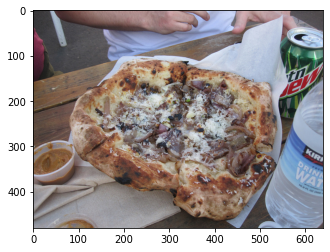


 10425 979945 What brand soda is on the desk?
	with entity spans: []
	True answer set: {'coke': 1, 'pepsi': 0.667}
Plain pred:  coke ( 1 )
EBERT pred:  coke ( 1 )
SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000097994.jpg


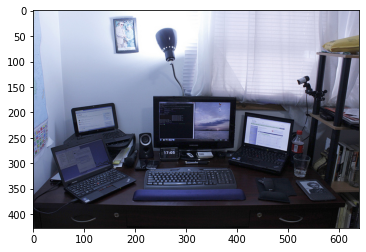

In [690]:
print(ENT_INFO)
for ind, q in enumerate(all_qs):
    if "brand soda" in q['question']:    #{'image_id': 559657, 'question': 'What happened to doris?', 'question_id': 5596575}
        if q['question_id'] in valqid2imgid:
            img = valqid2imgid[q['question_id']]            
            img = "COCO_val2014_"+img
            vind = ind - 9009
            ans_set = q2eval[plain_res[vind]['question_id']]
            res = eval_plain_v_ebert(plain_res[vind], ebert_res[vind], ans_set, val_qs['questions'][vind], debug = False)
            print("\n",ind, q['question_id'], q['question'])
            print("\twith entity spans:", fin_fin_ents[ind])
            print("\tTrue answer set:", {k:round(ans_set[k],3) for k in ans_set})
            print("Plain pred: ", res[2], "(",res[0],")")
            print("EBERT pred: ", res[3], "(",res[1],")")
            show_image(img)
            
"""
#FOR THIS Q why :
9804 1418215 What manufacturer sells that brand soda?
	with entity spans: [['brand soda', 29, 39, 'List of soft drink producers']]
	True answer set: {'pepsi': 1, 'mountain dew': 0.667, 'mtn dew': 0.667, 'mountaindew': 0.667}
Plain pred:  pepsi ( 1 )
EBERT pred:  coke ( 0 )
"""
print()

In [ ]:
!ls /data/diego/adv_comp_viz21/okvqa/img_data/*223451*
#{'image_id': 383581, 'question': 'What profession would most likely use these intruments?', 'question_id': 3835815}

SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_train2014_000000223451.jpg


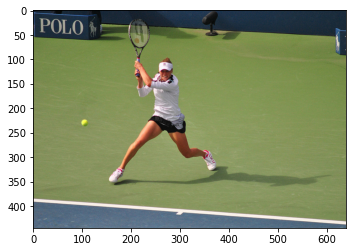

In [664]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def show_image(img, img_dir = "/data/diego/adv_comp_viz21/okvqa/img_data/"):
  t = "COCO_train2014_" if img_dir == "train2014/" else "COCO_val2014_"  
  fullpath = img_dir + img
  print("SHOWING:",fullpath)
  img = mpimg.imread(fullpath)
  imgplot = plt.imshow(img)
  plt.show()

show_image(img="COCO_train2014_000000223451.jpg")

In [223]:
#ebert_resf = "../lxmert_gen/snap/okvqa/okvqa_ebert_0907_20eps_newents_res/test_predict.json"   #fewk_b

#NUMBERS BELOW ARE FOR B

# i need to get 150 better out of 5000 max ( but mostly from 310 where Plain better than EBERT )

#where Plain better than EBERT  ( 9 in 1st 1k, 11 in 2nd k, 25 in 3rd K, 28 in 4th K, 33 above 4k <--- doesn't add up )
"""
 1 387 736345 This is a modern plane that was originally inspired by what two brothers?
Plain:  1 wright
Ebert:  0 wwii
True: {'wright': 1, 'wright brother': 0.667, 'write': 0.667}
Ents provided: [['modern plane', 10, 22, 'Airplane']]

 2 485 5723995 Should you leave the toilet seat up like this photo or down?
Plain:  1 down
Ebert:  0 flush
True: {'down': 1, 'leave it up': 0.667}
Ents provided: [['toilet seat', 21, 32, 'Toilet seat']]

 3 503 1209775 What type of architecture is shown in these buildings?
Plain:  1 gothic
Ebert:  0 victorian
True: {'gothic': 1, 'tower': 0.667, 'baroque': 0.667, 'dome': 0.667}
Ents provided: [['architecture', 13, 25, 'Architecture']]

 4 714 4989715 What are the vehicles in the picture used for?
Plain:  1 sail
Ebert:  0.667 fish
True: {'sail': 1, 'travel': 0.667, 'fish': 0.667}
Ents provided: [['vehicles', 13, 21, 'Vehicle']]

 5 741 2926395 What kind of aircraft are seen in this picture?
Plain:  1 jet
Ebert:  0.667 fighter jet
True: {'jet': 1, 'blue angel': 0.667, 'fighter jet': 0.667}
Ents provided: [['aircraft', 13, 21, 'Aircraft']]

 6 834 5588405 Name the dish which can be prepared using these vegetables?
Plain:  0.667 french fry
Ebert:  0 sandwich
True: {'hot dog': 1, 'soup': 0.667, 'french fry': 0.667, 'mashed potato': 0.667}
Ents provided: [['vegetables', 48, 58, 'Vegetable']]

 7 839 4405395 What famous founding father was known for his association with this object?
Plain:  1 benjamin franklin
Ebert:  0 kite
True: {'benjamin franklin': 1, 'ben franklin': 0.667}
Ents provided: [['founding father', 12, 27, 'Founding Fathers of the United States']]

 8 850 3571945 What activity is usually done sitting in those furniture?
Plain:  1 watch tv
Ebert:  0 read
True: {'watch tv': 1, 'television watch': 0.667, 'talk': 0.667, 'relax': 0.667}
Ents provided: [['furniture', 47, 56, 'Furniture']]

 9 980 2956935 What urban legend is mostly associated to the cat found in this picture?
Plain:  1 bad luck
Ebert:  0 domestic
True: {'bad luck': 1, 'black cat bring bad luck': 0.667, '9 lives': 0.667, 'black cat are bad luck': 0.667}
Ents provided: [['urban legend', 5, 17, 'Urban legend']]
"""


"""
***************************************************************2nd K

1 1182 4407095 What kind of retail environment would one typically find this in?
Plain:  1 grocery store
Ebert:  0 supermarket
True: {'grocery store': 1, 'mall': 0.667, 'market': 0.667}
Ents provided: [['retail environment', 13, 31, 'Retail']]

 2 1291 4560535 What sort of infrastructure is required to support this method of transportation?
Plain:  1 rail
Ebert:  0 train station
True: {'rail': 1, 'railway': 0.667, 'track': 0.667, 'train track': 0.667}
Ents provided: [['infrastructure', 13, 27, 'Infrastructure'], ['transportation', 66, 80, 'Transport']]

 3 1297 1386535 How many calories are typically in this type of food?
Plain:  0.667 200
Ebert:  0 500
True: {'131': 1, '1000': 0.667, '200': 0.667}
Ents provided: [['calories', 9, 17, 'Calorie']]

 4 1560 2946985 How long is that sandwhich?
Plain:  0.667 foot
Ebert:  0 8 inches
True: {'12 inches': 1, '1 foot': 0.667, 'foot long': 0.667, 'foot': 0.667}
Ents provided: [['sandwhich', 17, 26, 'Sandwich']]

 5 1632 2751115 In modern society what can you often see someone doing while walking down the street with their phone?
Plain:  0.667 text
Ebert:  0 distraction
True: {'talk': 1, 'text': 0.667}
Ents provided: [['modern society', 3, 17, 'Modernity']]

 6 1633 2938045 This was used to keep the house warm before central air?
Plain:  0.667 fire
Ebert:  0 chimney
True: {'fireplace': 1, 'fire': 0.667}
Ents provided: [['central air', 44, 55, 'Air conditioning']]

 7 1734 5120705 What model is this cell phone?
Plain:  1 motorola
Ebert:  0 samsung
True: {'motorola': 1, 'nokia': 0.667, 'motorola razr': 0.667, 'lg': 0.667}
Ents provided: [['cell phone', 19, 29, 'Mobile phone']]

 8 1773 1486205 What brand of computer is this?
Plain:  0.667 dell
Ebert:  0 ibm
True: {'mac': 1, 'dell': 0.667, 'apple': 0.667, 'hp': 0.667}
Ents provided: [['computer', 14, 22, 'Computer']]

 9 1829 4284525 What is the pink food in the sandwich?
Plain:  1 ham
Ebert:  0 bacon
True: {'ham': 1, 'salami': 0.667}
Ents provided: [['pink food', 12, 21, 'Pink'], ['sandwich', 29, 37, 'Sandwich']]

 10 1885 2970175 What are the ducks swimming in?
Plain:  1 water
Ebert:  0 lake
True: {'pond': 1, 'water': 1}
Ents provided: [['swimming', 19, 27, 'Swimming']]

 11 1997 4686045 Is this an african or indian elephant?
Plain:  1 african
Ebert:  0.667 indian
True: {'african': 1, 'asian': 0.667, 'indian': 0.667}

"""

"""
***************************************************************3rd K

1 2033 4795865 What is this type of furniture called the cat is sitting on?
Plain:  1 bookshelf
Ebert:  0.667 shelf
True: {'bookshelf': 1, 'shelf': 0.667, 'media stand': 0.667, 'bookcase': 0.667}
Ents provided: [['furniture', 21, 30, 'Furniture']]

 2 2045 613155 What is this pizza crust made out of?
Plain:  1 dough
Ebert:  0 flour
True: {'dough': 1}
Ents provided: [['pizza crust', 13, 24, 'Pizza']]

 3 2060 206295 What is the name given to this category of automobile?
Plain:  1 truck
Ebert:  0 haul
True: {'truck': 1, 'car': 0.667}
Ents provided: [['category', 31, 39, 'Saffir–Simpson scale'], ['automobile', 43, 53, 'Car']]

 4 2079 3248455 What type of dressing is on this sandwich?
Plain:  1 ranch
Ebert:  0 salad
True: {'ranch': 1, 'french': 0.667}
Ents provided: [['sandwich', 33, 41, 'Sandwich']]

 5 2153 3957175 Is the man working on this boat or just a passenger?
Plain:  1 passenger
Ebert:  0 fish
True: {'work': 1, 'passenger': 1}
Ents provided: [['passenger', 42, 51, 'Passenger']]

 6 2232 573455 What visual pattern is being featured in this photo?
Plain:  1 spot
Ebert:  0 checkered
True: {'spot': 1, 'giraffe spot': 0.667, 'mosaic': 0.667}
Ents provided: [['visual pattern', 5, 19, 'Pattern']]

 7 2270 4677265 Name the vegetable shown?
Plain:  0.667 tomato
Ebert:  0 pepper
True: {'beet': 1, 'radish': 0.667, 'tomato': 0.667}
Ents provided: [['vegetable', 9, 18, 'Vegetable']]

 8 2289 5771825 Which oscar winning movie prominently features a character sitting on one of these?
Plain:  1 forest gump
Ebert:  0.667 forrest gump
True: {'forest gump': 1, 'forrest gump': 0.667}
Ents provided: [['oscar winning movie', 6, 25, 'Academy Awards']]

 9 2389 5420955 What is the brand name of this place?
Plain:  0.667 hotel
Ebert:  0 serta
True: {'hilton': 1, 'hotel': 0.667, 'hyatt': 0.667, 'w hotel': 0.667}
Ents provided: [['brand name', 12, 22, 'Brand']]

 10 2404 4080495 What is the skill level of this skier?
Plain:  1 beginner
Ebert:  0 level 1
True: {'beginner': 1}
Ents provided: [['skill level', 12, 23, 'Skill']]

 11 2411 3985675 What type of computer user fits this desk's layout?
Plain:  0.667 desktop
Ebert:  0 apple
True: {'student': 1, 'programmer': 0.667, 'desktop': 0.667, 'gamer': 0.667}
Ents provided: [['computer user', 13, 26, 'User (computing)'], ["desk's layout", 37, 50, 'Desktop publishing']]

 12 2430 1517905 What is the handled item used for?
Plain:  1 cut
Ebert:  0 scissor
True: {'cut': 1, 'cut paper': 0.667, 'cut thing': 0.667}
Ents provided: [['handled item', 12, 24, 'Action item']]

 13 2523 5174545 What is most famous internet animal?
Plain:  1 cat
Ebert:  0 felis catus
True: {'cat': 1, 'ugly cat': 0.667, 'grumpy cat': 0.667}
Ents provided: [['internet animal', 20, 35, 'Internet']]

 14 2546 761385 What vitamins does this vegetable contain?
Plain:  1 vitamin c
Ebert:  0 c
True: {'vitamin c': 1, 'vitamin e': 0.667, 'vitamin': 0.667, 'd': 0.667}
Ents provided: [['vegetable', 24, 33, 'Vegetable'], ['vitamins', 5, 13, 'Vitamin']]

 15 2653 1494695 What well known farm animal produces an ingredient that goes into this food item?
Plain:  1 cow
Ebert:  0 cheese
True: {'cow': 1}
Ents provided: [['farm animal', 16, 27, 'Animal Farm'], ['ingredient', 40, 50, 'Ingredient']]

 16 2673 2381415 What do the two medium similar size buildings seem to be made of?
Plain:  1 brick
Ebert:  0 skyscraper
True: {'brick': 1, 'steel': 0.667, 'glass': 0.667, 'concrete': 0.667}
Ents provided: [['size buildings', 31, 45, 'Book size']]

 17 2675 4403775 Which kitchen appliance can this iron pot be place inside of to cook?
Plain:  1 oven
Ebert:  0 stove
True: {'oven': 1}
Ents provided: [['kitchen appliance', 6, 23, 'Home appliance'], ['iron pot', 33, 41, 'Cast-iron cookware']]

 18 2721 2288675 Where can you buy this type of furniture?
Plain:  1 furniture store
Ebert:  0.667 ikea
True: {'furniture store': 1, 'store': 1, 'ikea': 0.667}
Ents provided: [['furniture', 31, 40, 'Furniture']]

 19 2767 1477455 What attaches behind these objects?
Plain:  1 trailer
Ebert:  0 strap
True: {'trailer': 1, 'cage': 0.667}
Ents provided: [['attaches', 5, 13, 'Attached']]

 20 2776 3027875 A beverage is represented here what brand is its opposite in the cola wars?
Plain:  1 pepsi
Ebert:  0 coke
True: {'pepsi': 1, 'coca cola': 0.667}
Ents provided: [['beverage', 2, 10, 'Drink']]

 21 2815 1120935 What does this business sell?
Plain:  1 ice cream
Ebert:  0 furniture
True: {'ice cream': 1}
Ents provided: [['business', 15, 23, 'Business']]

 22 2843 4089065 What rising agent is used to make the dough in these italian dishes?
Plain:  1 yeast
Ebert:  0 dough
True: {'yeast': 1}
Ents provided: [['rising agent', 5, 17, 'Mercury Rising'], ['italian dishes', 53, 67, 'List of Italian dishes']]

 23 2896 4723755 What mode of transport does this dog enjoy?
Plain:  1 motorcycle
Ebert:  0 bike
True: {'motorcycle': 1, 'scooter': 0.667}
Ents provided: [['transport', 13, 22, 'Transport']]

 24 2902 2552485 Name a piece of fruit that is the same color as the bowl in the bottom right corner?
Plain:  1 apple
Ebert:  0 banana
True: {'grape': 1, 'apple': 1, 'kiwi': 0.667}
Ents provided: [['same color', 34, 44, 'Checker shadow illusion']]

 25 2960 3210625 Which of these fruits contains the highest concentration of water?
Plain:  1 orange
Ebert:  0 blueberry
True: {'orange': 1}
Ents provided: [['highest concentration', 35, 56, 'Millionaire']]
"""

"""
***************************************************************4th K

1 3016 490915 The signs hanging between the buildings in the photo have what language on them?
Plain:  1 chinese
Ebert:  0 sign
True: {'chinese': 1}
Ents provided: [['buildings', 30, 39, 'Building'], ['language', 63, 71, 'Language']]

 2 3063 3253315 What is the scientific name of the animal sleeping here?
Plain:  1 feline
Ebert:  0.667 cat
True: {'feline': 1, 'felis catus': 0.667, 'catos': 0.667, 'cat': 0.667}
Ents provided: [['scientific name', 12, 27, 'Binomial nomenclature']]

 3 3080 3500035 Is this an ambulance or firetruck?
Plain:  1 firetruck
Ebert:  0.667 fire
True: {'firetruck': 1, 'fire': 0.667, 'firetrick': 0.667, 'fire truck': 0.667}
Ents provided: [['ambulance', 11, 20, 'Ambulance'], ['firetruck', 24, 33, 'Fire engine']]

 4 3105 5113415 In the united states of america which publich transportation are usually the color shown on that ca?
Plain:  1 taxi
Ebert:  0 new york
True: {'police': 0.667, 'yellow': 0.667, 'taxi': 1, 'taxicab': 0.667}
Ents provided: [['united states', 7, 20, 'United States'], ['america', 24, 31, 'United States']]

 5 3130 1740705 The stuffed animal in the photo is called what kind of bear?
Plain:  1 teddy
Ebert:  0.667 teddy bear
True: {'teddy': 1, 'teddy bear': 0.667}
Ents provided: [['stuffed animal', 4, 18, 'Stuffed toy']]

 6 3142 1669795 What outdoor sport does this exemplify?
Plain:  1 boat
Ebert:  0.667 water ski
True: {'boat': 1, 'ski': 0.667, 'water ski': 0.667, 'motorboating': 0.667}
Ents provided: [['outdoor sport', 5, 18, 'Outdoor recreation']]

 7 3146 1454395 What fish do north american bears like to catch as they swim upstream?
Plain:  1 salmon
Ebert:  0 fish
True: {'salmon': 1}
Ents provided: [['north american bears', 13, 33, 'American black bear']]

 8 3160 2454265 Name the mode of transport?
Plain:  1 truck
Ebert:  0 car
True: {'truck': 1, 'delivery truck': 0.667, 'mail truck': 0.667}
Ents provided: [['transport', 17, 26, 'Transport']]

 9 3164 3346145 What prevents these animals from climbing well?
Plain:  0.667 fence
Ebert:  0 wire
True: {'hooves': 1, 'fence': 0.667, 'leg': 0.667}
Ents provided: [['prevents', 5, 13, 'Preventer']]

 10 3215 1277815 Why is this cat under the umbrella?
Plain:  0.667 shade
Ebert:  0 cat
True: {'play': 1, 'rain': 1, 'shade': 0.667}
Ents provided: [['umbrella', 26, 34, 'Umbrella']]

 11 3227 3414095 What seems to be the emotional state of the people here?    ### HA :)
Plain:  0.667 happy
Ebert:  0 california
True: {'joy': 0.667, 'happy': 0.667, 'happiness': 0.667, 'excited': 0.667, 'they are very happy': 0.667}
Ents provided: [['emotional state', 21, 36, 'Emotion']]

 12 3258 4585105 In what countries would you prepare this kind of ethnic food?
Plain:  1 mexico
Ebert:  0.667 usa
True: {'mexico': 1, 'south america': 0.667, 'india': 0.667, 'usa': 0.667}
Ents provided: [['countries', 8, 17, 'Country'], ['ethnic food', 49, 60, 'Food']]

 13 3362 785225 A shepherd is typically required to guide what animal which is depicted in this picture?
Plain:  1 sheep
Ebert:  0 wool
True: {'sheep': 1, 'lamb': 0.667}
Ents provided: [['shepherd', 2, 10, 'Shepherd']]

 14 3383 5390675 This bear is native to what continent?
Plain:  1 antarctica
Ebert:  0 north america
True: {'antarctica': 1, 'artic': 0.667, 'arctic': 0.667}
Ents provided: [['continent', 28, 37, 'Continent']]

 15 3462 1883115 What type of school project is this?
Plain:  1 computer
Ebert:  0 study
True: {'computer': 1, 'tech': 0.667, 'media': 0.667, 'audio': 0.667}
Ents provided: [['school project', 13, 27, 'Coursework']]

 16 3490 2842535 What language is the sign written in?
Plain:  1 spanish
Ebert:  0 japanese
True: {'spanish': 1}
Ents provided: [['language', 5, 13, 'Language']]

 17 3541 3725015 From what can you make the shavings of these animals?
Plain:  1 wool
Ebert:  0 sheep
True: {'wool': 1, 'sweater': 1}
Ents provided: [['shavings', 27, 35, 'Swarf']]

 18 3664 1735985 What is the name for the person who officiates this game?
Plain:  1 umpire
Ebert:  0 batter
True: {'umpire': 1}
Ents provided: [['officiates', 36, 46, 'Permission to officiate']]

 19 3730 386625 The gray boat shown in this photo is made up of which category of wood?
Plain:  1 pine
Ebert:  0 concrete
True: {'pine': 1, 'oak': 1, 'lumber': 0.667}
Ents provided: [['category', 54, 62, 'Saffir–Simpson scale']]

 20 3761 1233605 Ansal adams used what instrument?
Plain:  1 guitar
Ebert:  0 bike
True: {'camera': 1, 'guitar': 1}
Ents provided: [['Ansal adams', 0, 11, 'Ansel Adams']]

 21 3783 4369925 What type of natural structure is off to the right?
Plain:  1 mountain
Ebert:  0 dock
True: {'mountain': 1, 'island': 0.667}
Ents provided: [['natural structure', 13, 30, 'Patterns in nature']]

 22 3790 347085 How many chromosomes do these creatures have?
Plain:  1 46
Ebert:  0.667 23
True: {'46': 1, '23 pairs': 0.667, '23': 0.667}
Ents provided: [['chromosomes', 9, 20, 'Chromosome']]

 23 3816 4792485 What energy source does the appliance in the image run on?
Plain:  1 electricity
Ebert:  0 tv
True: {'electricity': 1, 'electric': 0.667}
Ents provided: [['appliance', 28, 37, 'Home appliance']]

 24 3850 1586025 What is the temperature like here?
Plain:  1 cold
Ebert:  0 freeze
True: {'cold': 1, 'frigid': 0.667, 'below 0 f': 0.667, 'arctic': 0.667}
Ents provided: [['temperature', 12, 23, 'Temperature']]

 25 3855 2524035 When was the company on this toothbrush founded?   #gets a reasonable answer for wrong question
Plain:  0.667 1940
Ebert:  0 oral b
True: {'1806': 1, '1900': 0.667, '1921': 0.667, '1940': 0.667}
Ents provided: [['toothbrush', 29, 39, 'Toothbrush']]

 26 3906 1073395 What type of furniture is the girl leaning against?
Plain:  1 couch
Ebert:  0.667 sofa
True: {'couch': 1, 'sofa': 0.667, 'leather': 0.667}
Ents provided: [['furniture', 13, 22, 'Furniture']]

 27 3927 1839145 What is the brand name of the cell phone being used in this photo?
Plain:  1 motorola
Ebert:  0 nokia
True: {'motorola': 1}
Ents provided: [['brand name', 12, 22, 'Brand'], ['cell phone', 30, 40, 'Mobile phone']]

 28 3948 1631055 This plush toy was named after what us president?
Plain:  1 theodore roosevelt
Ebert:  0 teddy bear
True: {'theodore roosevelt': 1, 'theodore teddy roosevelt': 0.667, 'teddy': 0.667, 'roosevelt': 0.667}
Ents provided: [['plush toy', 5, 14, 'Stuffed toy'], ['president', 39, 48, 'President']]
"""

  
    
""" 4K up
1 4005 3341255 Who is the designer of the orange backpack?
Plain:  1 jansport
Ebert:  0 gucci
True: {'jansport': 1, 'argo': 0.667, 'backpack': 0.667}
Ents provided: [['designer', 11, 19, 'Designer']]

 2 4065 2224585 What style of architecture is this building?
Plain:  1 modern
Ebert:  0 greek
True: {'modern': 1, 'colonial': 1}
Ents provided: [['architecture', 14, 26, 'Architecture']]

 3 4081 3185615 What is the other duties of this occupation?
Plain:  0.667 herd
Ebert:  0 sheep
True: {'shear': 1, 'herd': 0.667, 'shear sheep': 0.667, 'heard': 0.667}
Ents provided: [['other duties', 12, 24, 'Call of Duty']]

 4 4089 3894005 What fast food chain might sell entrees produced by this type of livestock?
Plain:  1 mcdonalds
Ebert:  0 hamburger
True: {'mcdonalds': 1, "mcdonald's": 0.667, 'wendys': 0.667}
Ents provided: [['food chain', 10, 20, 'Food chain'], ['livestock', 65, 74, 'Livestock']]

 5 4100 126665 Would this typically transport people or grains?
Plain:  1 people
Ebert:  0 bus
True: {'people': 1}
Ents provided: [['transport', 21, 30, 'Transport']]

 6 4200 1548305 Which road user has right of way?
Plain:  1 bike
Ebert:  0 no park
True: {'bike': 1, 'bicyclist': 0.667, 'pedestrian': 0.667, 'bicycle': 0.667}
Ents provided: [['road user', 6, 15, 'Road traffic safety']]

 7 4238 5277835 Is that real grass in the picture or fake?
Plain:  1 fake
Ebert:  0 grass
True: {'real': 1, 'fake': 1}
Ents provided: [['real grass', 8, 18, 'The Grass Roots']]

 8 4251 2058115 What ethnicty is this man?
Plain:  1 white
Ebert:  0 american
True: {'white': 1, 'caucasian': 1}
Ents provided: [['ethnicty', 5, 13, 'Creole peoples']]

 9 4293 1055525 How many passengers does this airplane carry?
Plain:  1 300
Ebert:  0 lot
True: {'300': 1, '120': 0.667, '100': 0.667, '200': 0.667}
Ents provided: [['passengers', 9, 19, 'Passenger']]

 10 4305 907075 What minerals is in this vegatable?
Plain:  1 vitamin c
Ebert:  0 lemon
True: {'vitamin c': 1, 'iron': 0.667, 'magnesium': 0.667, 'manganese': 0.667}
Ents provided: [['minerals', 5, 13, 'Mineral']]

 11 4341 2233275 Why is the man wearing a heavy crown jacket?     BAD LUCK
Plain:  1 cold
Ebert:  0 cold weather
True: {'cold': 1, 'snow': 0.667, 'it cold': 0.667}
Ents provided: [['crown jacket', 31, 43, 'A-2 jacket']]

 12 4342 2290005 What could the emotions of these people be?      BAD LUCK
Plain:  1 happy
Ebert:  0 happiness
True: {'happy': 1, 'curious': 0.667, 'shocked': 0.667, 'anxious': 0.667}
Ents provided: [['emotions', 15, 23, 'Emotion']]

 13 4346 1079395 What type of camera lens took this photo?
Plain:  1 fisheye
Ebert:  0 wide angle
True: {'fisheye': 1, 'panaramic': 0.667, 'fish eye': 0.667}
Ents provided: [['camera lens', 13, 24, 'Camera lens']]

 14 4361 4307885 Is the horse providing a practical service or a commercial service?
Plain:  1 commercial
Ebert:  0 driver
True: {'commercial': 1, 'commercial service': 0.667, 'practical': 0.667}
Ents provided: [['practical service', 25, 42, 'Conscription in Switzerland'], ['commercial service', 48, 66, 'United States Commercial Service']]

 15 4417 3616935 What is this animals main food source?
Plain:  0.667 berry
Ebert:  0 plant
True: {'fish': 1, 'berry': 0.667, 'salmon': 0.667, 'prey': 0.667}
Ents provided: [['food source', 26, 37, 'Food']]

 16 4424 3159745 Based on the appearance of the fruit estimate how ripe it is?
Plain:  0.667 unripe
Ebert:  0 potassium
True: {'very ripe': 1, 'just right': 0.667, 'very': 0.667, 'unripe': 0.667}
Ents provided: [['appearance', 13, 23, 'Appearance'], ['fruit estimate', 31, 45, 'Fruit of Islam']]

 17 4434 2482975 What is the top speed of these animals?
Plain:  0.667 gallop
Ebert:  0 30mph
True: {'30 mph': 1, 'gallop': 0.667, '100 mph': 0.667, '45': 0.667}
Ents provided: [['top speed', 12, 21, 'Production car speed record']]

 18 4460 5445905 What is the name for this creatures offspring?
Plain:  1 kitten
Ebert:  0 puppy
True: {'kitten': 1, 'cat': 0.667}
Ents provided: [['offspring', 36, 45, 'Offspring']]

 19 4462 2110545 What chemicals are coming out of the chimneys?
Plain:  1 smoke
Ebert:  0 coal
True: {'smoke': 1, 'carbon monoxide': 0.667, 'pollution': 0.667, 'smog': 0.667}
Ents provided: [['chemicals', 5, 14, 'Chemical substance'], ['chimneys', 37, 45, 'Chimney']]
"""


"""
 20 4514 3318165 What kind of fabric product is produced from these animals?
Plain:  1 wool
Ebert:  0 cloth
True: {'wool': 1, 'cotton': 0.667}
Ents provided: [['fabric product', 13, 27, 'Bluing (fabric)']]

 21 4542 1184475 Who is the current highest ranking male player of this sport?   # WHY WAS THIS SO OFF!
Plain:  1 roger federer
Ebert:  0 serena williams
True: {'roger federer': 1, 'rafael nadal': 1}
Ents provided: [['male player', 35, 46, 'List of male singles tennis players']]

 22 4603 3458495 Which age group visit this kind of place?
Plain:  0.667 children
Ebert:  0 6
True: {'3 7 years old': 0.667, 'children': 0.667, 'toddler': 1, 'kindergarten': 0.667}
Ents provided: [['age group', 6, 15, 'The Family (Australian New Age group)']]

 23 4625 4178465 What vocalization do these animals make?
Plain:  1 woof
Ebert:  0 bad luck
True: {'bark': 1, 'woof': 1}
Ents provided: [['vocalization', 5, 17, 'L-vocalization']]

 24 4683 5704655 What is this main dish called?
Plain:  1 pizza
Ebert:  0 bread
True: {'pizza': 1, 'quesadilla': 0.667}
Ents provided: [['main dish', 13, 22, 'Main course']]

 25 4688 2785765 What year will the vehicle?
Plain:  1 1940
Ebert:  0 spring
True: {'1940': 1, '1920': 0.667, "1940's": 0.667, '1930': 0.667}
Ents provided: [['year will the vehicle', 5, 26, 'Motor vehicle fatality rate in U.S. by year']]

 26 4780 5556875 Who can use this transportation type?
Plain:  0.667 human
Ebert:  0 kid
True: {'people': 1, 'student': 0.667, 'human': 0.667}
Ents provided: [['transportation type', 17, 36, 'Swift Transportation']]

 27 4802 2819765 What vegetable is this food made from?
Plain:  1 cucumber
Ebert:  0 pickle
True: {'cucumber': 1}
Ents provided: [['vegetable', 5, 14, 'Vegetable']]

 28 4855 381865 Cool hand luke went to prison for defacing these?
Plain:  1 park meter
Ebert:  0 ticket
True: {'park meter': 1, 'meter': 0.667, 'build': 0.667}
Ents provided: [['hand luke', 5, 14, 'Cool Hand Luke']]

 29 4895 2295995 What antioxidants does this fruit contain?
Plain:  1 vitamin c
Ebert:  0 orange
True: {'vitamin c': 1, 'lutein': 0.667, 'antioxidant': 0.667}
Ents provided: [['antioxidants', 5, 17, 'Antioxidant']]

 30 4988 996475 In this photo what nutritions is this dish rich in?
Plain:  0.667 vegetable
Ebert:  0 broccoli
True: {'protein': 1, 'iron': 0.667, 'fiber': 0.667, 'vegetable': 0.667}
Ents provided: [['nutritions', 19, 29, 'Nutrition']]

 31 5000 4129165 What professional team has won the most championships in the sport being played here?
Plain:  1 yankees
Ebert:  0 red sox
True: {'yankees': 1, 'baseball': 0.667, 'new york yankees': 0.667}
Ents provided: [['professional team', 5, 22, 'Professional sports'], ['most championships', 35, 53, 'List of NBA players with most championships']]

 32 5033 510285 The two colorful keyboard shaped objects are used for what?
Plain:  1 type
Ebert:  0 keyboard
True: {'type': 1, 'learn': 0.667, 'spell word': 0.667, 'card': 0.667}
Ents provided: [['keyboard shaped objects', 17, 40, 'Space-cadet keyboard']]

 33 5034 2257515 What are these products a good source of?
Plain:  0.667 vitamin
Ebert:  0 vegetable
True: {'nutrient': 1, 'vitamin c': 0.667, 'vitamin': 0.667, 'vtamin': 0.667}
Ents provided: [['products', 15, 23, 'By-product'], ['good source', 26, 37, 'Open-source software']]
"""
print()

In [225]:
#now look at ebetter_we vs pbetter_we and then vs same ( i edited inds 0 - 1000 and 9009 - 10100
# ORIGINAL RESULTS

"""
Scores based on all questions
Plain:  2199.33  out of  5046 = 0.4359
EBERT:  2143.33  out of  5046 = 0.4248
Plain better: 318, EBERT better: 255 
    Same Acc: 4473 = Same Acc/ans: 3623  +  Same Acc/Diff Ans: 850
Diff of  55.99

Scores based on having available ents:
Plain:  637.9999999999995  out of  1642 = 0.3886
EBERT:  603.6666666666671  out of  1642 = 0.3676
Plain better: 128 , EBERT better: 94 
    Same Acc: 1420 = Same Acc/ans: 1047  + Same Acc/Diff Ans: 373
Diff of  34.33333333333246

Scores based on having available ents ( 1st 1000 only ):
Plain:  90.00000000000001  out of  269 = 0.3346
EBERT:  85.66666666666669  out of  269 = 0.3185
Plain better: 19 , EBERT better: 15 
    Same Acc: 235  = Same Acc/ans: 182  + Same Acc/Diff Ans: 53
Diff of  4.33

Scores based on having available ents: ( 1000 - 2000 only ):
Plain:  114.00000000000004  out of  317 = 0.3596
EBERT:  111.00000000000006  out of  317 = 0.3502
Plain better: 23 , EBERT better: 21 
	Same Acc: 273 Same Acc/ans: 190 Same Acc/Diff Ans: 83
Diff of  2.999999999999986

Scores based on having available ents ( 2000 and up)
Plain:  548.0000000000007  out of  1373 = 0.3991
EBERT:  518.000000000001  out of  1373 = 0.3773
Plain better: 109 , EBERT better: 79 
    Same Acc: 1185  = Same Acc/ans: 865  + Same Acc/Diff Ans: 320
Diff of  29.99999999999966
"""


# 15 CASES WHERE EBERT BETTER IN FIRST 
"""
 1 72 4535205 Are these animals mammals or insects?
Plain:  0 prey
Ebert:  1 mammal
True: {'mammal': 1, 'animal': 0.667}
Ents provided: [['animals mammals', 10, 25, 'Mammal']]

 2 87 2597615 What fills the balloons?
Plain:  0 balloon
Ebert:  1 helium
True: {'helium': 1}
Ents provided: [['balloons', 15, 23, 'Balloon']]

 3 193 4509935 The people in this photo are wearing what outfits which can be considered business formal?
Plain:  0 wet suit
Ebert:  1 suit
True: {'suit': 1, 'trousersuits': 0.667}
Ents provided: [['business', 74, 82, 'Business']]

 4 207 3896845 What do the triangles on the back of this bus mean?
Plain:  0 pedestrian cross
Ebert:  1 caution
True: {'caution': 1, 'yield': 0.667, 'stop': 0.667, 'slow down and watch out for passenger': 0.667}
Ents provided: [['triangles', 12, 21, 'Triangle']]

 5 226 2678375 Who invented the sports equipment being used here?
Plain:  0 shaun white
Ebert:  1 tom sim
True: {'tom sim': 1, 'skateboarder': 0.667, 'bob yasika': 0.667}
Ents provided: [['sports equipment', 17, 33, 'Sports equipment']]

 6 305 1903135 Why would we suspect that this is not a summer time scene?
Plain:  0 too small
Ebert:  0.667 cloth
True: {'coat': 1, 'shes wear coat': 0.667, 'cloth': 0.667, 'woman is wear sweater': 0.667}
Ents provided: [['summer time scene', 40, 57, 'Summer']]

 7 360 4951465 What organization operates this train?
Plain:  0 engineer
Ebert:  1 amtrak
True: {'amtrak': 1, 'southwest': 1, 'norfolk southern': 0.667}
Ents provided: [['organization', 5, 17, 'Organization']]

 8 451 381185 What is the name of the hand held equipment being used?
Plain:  0.667 pole
Ebert:  1 ski pole
True: {'ski pole': 1, 'cane': 0.667, 'rod': 0.667, 'pole': 0.667}
Ents provided: [['hand held equipment', 24, 43, 'Hand-held camera']]

 9 481 5304665 Who was the artist that painted this train car?
Plain:  0 queen elizabeth
Ebert:  0.667 graffiti
True: {'banksy': 1, 'van gogh': 0.667, 'graffiti': 0.667, 'street artist': 0.667}
Ents provided: [['train car', 37, 46, 'Railroad car']]

 10 505 508295 What type of cheese is on this sandwich?
Plain:  0 mozzarella
Ebert:  1 american
True: {'swiss': 1, 'american': 1, 'monterey jack': 0.667}
Ents provided: [['sandwich', 31, 39, 'Sandwich']]

 11 681 3453295 What part of the atmosphere is the object in?
Plain:  0 air
Ebert:  0.667 cloud
True: {'troposphere': 1, 'cloud': 0.667, 'stratosphere': 0.667, 'sky': 0.667}
Ents provided: [['atmosphere', 17, 27, 'Atmosphere']]

 12 702 3324615 What outdoor activity are they prepared for?
Plain:  0 hike
Ebert:  0.667 ski
True: {'camp': 1, 'ski': 0.667}
Ents provided: [['outdoor activity', 5, 21, 'Outdoor recreation']]

 13 706 487865 What highways is this?
Plain:  0 highway
Ebert:  0.667 interstate
True: {'route 66': 1, 'i40': 0.667, 'interstate': 0.667}
Ents provided: [['highways', 5, 13, 'Highway']]

 14 774 5071435 How many people ride this mode of transportation in europe?
Plain:  0 100
Ebert:  0.667 2
True: {'million': 1, '2': 0.667, 'thousand': 0.667, '100 million': 0.667}
Ents provided: [['transportation', 34, 48, 'Transport'], ['europe', 52, 58, 'Europe']]

 15 890 2787425 Which gaming system is being used in this photo?
Plain:  0 laptop
Ebert:  0.667 wii
True: {'pc': 1, 'nintendo': 1, 'wii': 0.667}
Ents provided: [['gaming system', 6, 19, 'Video game console']]
Scores
Plain:  2199.333333333341  out of  5046 = 0.4359
EBERT:  2143.3333333333444  out of  5046 = 0.4248
Plain better: 318 EBERT better: 255 Same: 4473 3623 850
Diff of  55.99999999999682

Scores based on having available ents:
Plain:  90.00000000000001  out of  269 = 0.3346
EBERT:  85.66666666666669  out of  269 = 0.3185
Plain better: 19 , EBERT better: 15 
	Same Acc: 235 Same Acc/ans: 182 Same Acc/Diff Ans: 53
Diff of  4.333333333333329
"""

#19 WHERE PLAIN BETTER THAN EBERT  

"""
 1 86 1603935 What item might be used to warm this item of furniture?
Plain:  0.667 blanket
Ebert:  0 curtain
True: {'electric blanket': 1, 'blanker': 0.667, 'cloth dryer': 0.667, 'blanket': 0.667}
Ents provided: [['furniture', 45, 54, 'Furniture']]

 2 331 3530015 What kind of umbrella are those in the background?
Plain:  0.667 pink
Ebert:  0 shade
True: {'parasol': 1, 'pink': 0.667}
Ents provided: [['umbrella', 13, 21, 'Umbrella']]

 3 366 3017995 What are the eating utensils on the left called?
Plain:  1 chopstick
Ebert:  0 table
True: {'chopstick': 1, 'chop stick': 0.667}
Ents provided: [['eating utensils', 13, 28, 'List of eating utensils']]

 4 387 736345 This is a modern plane that was originally inspired by what two brothers?
Plain:  1 wright
Ebert:  0 wwii
True: {'wright': 1, 'wright brother': 0.667, 'write': 0.667}
Ents provided: [['modern plane', 10, 22, 'Airplane'], ['brothers', 64, 72, 'Brother']]

 5 485 5723995 Should you leave the toilet seat up like this photo or down?
Plain:  1 down
Ebert:  0 flush
True: {'down': 1, 'leave it up': 0.667}
Ents provided: [['toilet seat', 21, 32, 'Toilet seat']]

 6 503 1209775 What type of architecture is shown in these buildings?
Plain:  1 gothic
Ebert:  0 victorian
True: {'gothic': 1, 'tower': 0.667, 'baroque': 0.667, 'dome': 0.667}
Ents provided: [['architecture', 13, 25, 'Architecture'], ['buildings', 44, 53, 'Building']]

 7 506 13745 When was this type of transportation invented?
Plain:  1 1804
Ebert:  0 1900
True: {'1804': 1, '1800s': 0.667}
Ents provided: [['transportation', 22, 36, 'Transport']]

 8 513 1326835 What full scale train does this small one represent?
Plain:  1 locomotive
Ebert:  0 car
True: {'locomotive': 1, 'caboose': 0.667, 'thomas': 0.667, 'polar express': 0.667}
Ents provided: [['scale train', 10, 21, 'Toy train']]

 9 549 5474935 What type of dinnerware is the food on?
Plain:  1 plate
Ebert:  0 desert
True: {'plate': 1}
Ents provided: [['dinnerware', 13, 23, 'Tableware']]

 10 714 4989715 What are the vehicles in the picture used for?
Plain:  1 sail
Ebert:  0.667 fish
True: {'sail': 1, 'travel': 0.667, 'fish': 0.667}
Ents provided: [['vehicles', 13, 21, 'Vehicle']]

 11 741 2926395 What kind of aircraft are seen in this picture?
Plain:  1 jet
Ebert:  0.667 fighter jet
True: {'jet': 1, 'blue angel': 0.667, 'fighter jet': 0.667}
Ents provided: [['aircraft', 13, 21, 'Aircraft']]

 12 785 535505 Would this child be more likely to enjoy a picture book or one with only words?
Plain:  1 picture
Ebert:  0 train
True: {'picture': 1, 'picture book': 0.667, 'good book': 0.667}
Ents provided: [['picture book', 43, 55, 'Picture book']]

 13 811 5650415 Based on the refraction in the image explain if this man is far sighted or near sighted?
Plain:  0.667 far
Ebert:  0 30 feet
True: {'near sighted': 1, 'far sighted': 1, 'far': 0.667}
Ents provided: [['refraction', 13, 23, 'Refraction']]

 14 834 5588405 Name the dish which can be prepared using these vegetables?
Plain:  0.667 french fry
Ebert:  0 sandwich
True: {'hot dog': 1, 'soup': 0.667, 'french fry': 0.667, 'mashed potato': 0.667}
Ents provided: [['vegetables', 48, 58, 'Vegetable']]

 15 836 410115 This gentleman is dressed for what sport?
Plain:  1 polo
Ebert:  0 tuxedo
True: {'polo': 1, 'horse race': 0.667, 'ride': 0.667}
Ents provided: [['gentleman', 5, 14, 'Gentleman']]

 16 839 4405395 What famous founding father was known for his association with this object?
Plain:  1 benjamin franklin
Ebert:  0 kite
True: {'benjamin franklin': 1, 'ben franklin': 0.667}
Ents provided: [['founding father', 12, 27, 'Founding Fathers of the United States']]

 17 850 3571945 What activity is usually done sitting in those furniture?
Plain:  1 watch tv
Ebert:  0 read
True: {'watch tv': 1, 'television watch': 0.667, 'talk': 0.667, 'relax': 0.667}
Ents provided: [['furniture', 47, 56, 'Furniture']]

 18 928 4813275 The dried flowers in this photo are stuck down inside what type of item?
Plain:  1 vase
Ebert:  0 lily
True: {'vase': 1}
Ents provided: [['dried flowers', 4, 17, 'Floristry']]

 19 980 2956935 What urban legend is mostly associated to the cat found in this picture?
Plain:  1 bad luck
Ebert:  0 domestic
True: {'bad luck': 1, 'black cat bring bad luck': 0.667, '9 lives': 0.667, 'black cat are bad luck': 0.667}
Ents provided: [['urban legend', 5, 17, 'Urban legend']]
Scores
Plain:  2199.333333333341  out of  5046 = 0.4359
EBERT:  2143.3333333333444  out of  5046 = 0.4248
Plain better: 318 EBERT better: 255 Same: 4473 3623 850
Diff of  55.99999999999682

Scores based on having available ents:
Plain:  90.00000000000001  out of  269 = 0.3346
EBERT:  85.66666666666669  out of  269 = 0.3185
Plain better: 19 , EBERT better: 15 
	Same Acc: 235 Same Acc/ans: 182 Same Acc/Diff Ans: 53
Diff of  4.333333333333329
"""

# make new entsfile and remove these ents from the following records ( +9009 )  , [] <-- means remove all

for tr in toremove:
    ind,val = tr[0], tr[1]
    print("\nBEFORE", ind, val, fin_fin_ents[ind+9009]) #BEFORE 86 ['furniture', 45, 54, 'Furniture']
    if val == [] or type(fin_fin_ents[ind+9009][0]) != list:
        # if val is empty, remove everything or if there is only one ent span remove it
        print("Cond 1")
        fin_fin_ents[ind+9009] = []
    else:
        # if there are multiple spans discard the correct one
        print("Found multiple")        
        tokeep = []            
        for i, v in enumerate(fin_fin_ents[ind+9009]):
            print(i,v)
            if v != val:
                print(v, val, v==val)
                tokeep.append(v)
            else:
                print("Delete", v)
        fin_fin_ents[ind+9009] = tokeep
    print("AFTER",fin_fin_ents[ind+9009])

with open("okvqa_ent_spans_sept07_fewk_cc.json", "w") as f:
    json.dump(fin_fin_ents, f)
    
#now try test with this
    
"""
*********************STARTING AT 1000

 1 1052 1440035 The red items on the pastry are a specific ingredient for what type of cake?
Plain:  1 strawberry
Ebert:  0 frost
True: {'strawberry': 1, 'shortcake': 0.667}
Ents provided: [['specific ingredient', 34, 53, 'Ingredient']]

 2 1112 4591035 What style of architecture is pictured?
Plain:  0.667 gothic
Ebert:  0 victorian
True: {'spanish': 1, 'art deco': 0.667, 'church': 0.667, 'gothic': 0.667}
Ents provided: [['architecture', 14, 26, 'Architecture']]

 3 1182 4407095 What kind of retail environment would one typically find this in?    REASONABLE ANSWER 
Plain:  1 grocery store
Ebert:  0 supermarket
True: {'grocery store': 1, 'mall': 0.667, 'market': 0.667}
Ents provided: [['retail environment', 13, 31, 'Retail']]

 4 1195 952955 What is the furniture item directly to the left of the people?
Plain:  1 couch
Ebert:  0 chair
True: {'couch': 1, 'sofa': 0.667}
Ents provided: [['furniture item', 12, 26, 'Human furniture']]

 5 1291 4560535 What sort of infrastructure is required to support this method of transportation?   REASONABLE ANSWER
Plain:  1 rail
Ebert:  0 train station
True: {'rail': 1, 'railway': 0.667, 'track': 0.667, 'train track': 0.667}
Ents provided: [['infrastructure', 13, 27, 'Infrastructure'], ['transportation', 66, 80, 'Transport']]
  
 6 1297 1386535 How many calories are typically in this type of food?     REASONABLE ANSWER?? 
Plain:  0.667 200
Ebert:  0 500
True: {'131': 1, '1000': 0.667, '200': 0.667}
Ents provided: [['calories', 9, 17, 'Calorie']]

 7 1347 3680415 What hair style does the child have?
Plain:  1 short
Ebert:  0 long
True: {'short': 1, 'bob': 0.667, 'bob cut': 0.667}
Ents provided: [['hair style', 5, 15, 'Hairstyle']]

 8 1355 2332665 Should beginners surf on hide tides or low tides?
Plain:  1 low
Ebert:  0 wave
True: {'low': 1, 'low tide': 1}
Ents provided: [['beginners', 7, 16, 'Beginners'], ['surf', 17, 21, 'Surfing'], ['low tides', 39, 48, 'Tide']]

 9 1560 2946985 How long is that sandwhich?           REASONABLE
Plain:  0.667 foot
Ebert:  0 8 inches
True: {'12 inches': 1, '1 foot': 0.667, 'foot long': 0.667, 'foot': 0.667}
Ents provided: [['sandwhich', 17, 26, 'Sandwich']]

 10 1613 2840285 What past time activity could be supported by the items stacked on the side table?
Plain:  1 read
Ebert:  0 dresser
True: {'read': 1, 'erading': 0.667}
Ents provided: [['time activity', 10, 23, 'Leisure'], ['side table', 71, 81, 'Nightstand']]

 11 1629 4860465 Which is the tall african herbavore?
Plain:  1 giraffe
Ebert:  0 herbivore
True: {'giraffe': 1}
Ents provided: [['african herbavore', 18, 35, 'Herbivore']]

 12 1632 2751115 In modern society what can you often see someone doing while walking down the street with their phone?
Plain:  0.667 text
Ebert:  0 distraction
True: {'talk': 1, 'text': 0.667}
Ents provided: [['modern society', 3, 17, 'Modernity']]

 13 1633 2938045 This was used to keep the house warm before central air?   #REASONABLE
Plain:  0.667 fire
Ebert:  0 chimney
True: {'fireplace': 1, 'fire': 0.667}
Ents provided: [['central air', 44, 55, 'Air conditioning']]

 14 1717 768665 These animals are closely related to what american animal?
Plain:  0.667 zebra
Ebert:  0 lion
True: {'horse': 1, 'zebra': 0.667}
Ents provided: [['american animal', 42, 57, 'American Animals']]

 15 1734 5120705 What model is this cell phone?      #REASONABLE 
Plain:  1 motorola
Ebert:  0 samsung
True: {'motorola': 1, 'nokia': 0.667, 'motorola razr': 0.667, 'lg': 0.667}
Ents provided: [['cell phone', 19, 29, 'Mobile phone']]

 16 1773 1486205 What brand of computer is this?     #REASONABLE
Plain:  0.667 dell
Ebert:  0 ibm
True: {'mac': 1, 'dell': 0.667, 'apple': 0.667, 'hp': 0.667}
Ents provided: [['computer', 14, 22, 'Computer']]

 17 1788 3915885 What type of diet would approve the consumption of this food?
Plain:  1 vegetarian
Ebert:  0 italian
True: {'vegetarian': 1, 'weight watcher': 0.667, 'low calorie': 0.667}
Ents provided: [['consumption', 36, 47, 'Conspicuous consumption']]

 18 1829 4284525 What is the pink food in the sandwich?   #REASONABLE
Plain:  1 ham
Ebert:  0 bacon
True: {'ham': 1, 'salami': 0.667}
Ents provided: [['pink food', 12, 21, 'Pink'], ['sandwich', 29, 37, 'Sandwich']]

 19 1855 1521765 What style of architecture is the bridge made in?
Plain:  0.667 gothic
Ebert:  0 stone
True: {'arch': 1, 'roman': 1, 'gothic': 0.667}
Ents provided: [['architecture', 14, 26, 'Architecture']]

 20 1883 91755 What animal skin does this resemble?
Plain:  1 tiger
Ebert:  0 kite
True: {'tiger': 1}
Ents provided: [['animal skin', 5, 16, 'Skin']]

 21 1885 2970175 What are the ducks swimming in?    #REASONABLE
Plain:  1 water
Ebert:  0 lake
True: {'pond': 1, 'water': 1}
Ents provided: [['swimming', 19, 27, 'Swimming']]

 22 1918 3630725 How do we know this is a city view?
Plain:  1 build
Ebert:  0 train
True: {'build': 1, 'there is large build in background': 0.667, 'block': 0.667, 'high rise': 0.667}
Ents provided: [['city view', 25, 34, 'Mountain View, California']]

 23 1997 4686045 Is this an african or indian elephant?
Plain:  1 african
Ebert:  0.667 indian
True: {'african': 1, 'asian': 0.667, 'indian': 0.667}
Ents provided: [['elephant', 29, 37, 'Elephant']]
Scores
Plain:  2199.333333333341  out of  5046 = 0.4359
EBERT:  2143.3333333333444  out of  5046 = 0.4248
Plain better: 318 EBERT better: 255 Same: 4473 3623 850
Diff of  55.99999999999682



"""

"\n*********************STARTING AT 1000\n\n 1 1052 1440035 The red items on the pastry are a specific ingredient for what type of cake?\nPlain:  1 strawberry\nEbert:  0 frost\nTrue: {'strawberry': 1, 'shortcake': 0.667}\nEnts provided: [['specific ingredient', 34, 53, 'Ingredient']]\n\n 2 1112 4591035 What style of architecture is pictured?\nPlain:  0.667 gothic\nEbert:  0 victorian\nTrue: {'spanish': 1, 'art deco': 0.667, 'church': 0.667, 'gothic': 0.667}\nEnts provided: [['architecture', 14, 26, 'Architecture']]\n\n 3 1182 4407095 What kind of retail environment would one typically find this in?    REASONABLE ANSWER \nPlain:  1 grocery store\nEbert:  0 supermarket\nTrue: {'grocery store': 1, 'mall': 0.667, 'market': 0.667}\nEnts provided: [['retail environment', 13, 31, 'Retail']]\n\n 4 1195 952955 What is the furniture item directly to the left of the people?\nPlain:  1 couch\nEbert:  0 chair\nTrue: {'couch': 1, 'sofa': 0.667}\nEnts provided: [['furniture item', 12, 26, 'Human furn

In [292]:
print("Plain answer types with acc")  #todo split by train/val
for pt in pans_types:
    print(pt, round_half_down(pans_types[pt]['score'],4), len(pans_types[pt]['inds']), 
          round_half_down(pans_types[pt]['score']/len(pans_types[pt]['inds']),4))

print("\nEBERT answer types with acc")  #todo split by train/val
for et in eans_types:
    print(et, round_half_down(eans_types[et]['score'],4), len(eans_types[et]['inds']), 
          round_half_down(eans_types[et]['score']/len(eans_types[et]['inds']),4))
    
"""  NO REALLY USEFUL PATTERNS
Plain answer types with acc   
  none 1679.6667 3747 0.4483
   ORG  227.3333  465 0.4889
PERSON  106.6667  217 0.4916
  DATE   37.3333  152 0.2456
   GPE   51.6667  146 0.3539
CARDINAL 29.6667  110 0.2697
  NORP   26.6667   66 0.404
QUANTITY 10.0      41 0.2439
  TIME   21.3333   40 0.5333
         12.3333   23 0.5362
   LOC    9.0      18 0.5
ORDINAL   4.6667   10 0.4667
LANGUAGE  2.6667    9 0.2963
EVENT     1.0       2 0.5

EBERT answer types with acc
none 1541.6667 3759 0.4101
 ORG  209.6667  484 0.4332
PERSON 86.3333  202 0.4274
DATE   37.3333  142 0.2629  <-- does slightly better on dates as a %
 GPE   52.3333  143 0.366   <-- slightly better
CARDIL 22.0     115 0.1913
NORP   25.3333   59 0.4294  <--- does better
QUANTIY 8.3333   45 0.1852
TIME   20.6667   37 0.5586
       11.6667   20 0.5833
 LOC   10.0      16 0.625
ORDINAL 4.6667   10 0.4667
LANGUGE 4.3333   13 0.3333
EVENT   1.0       1 1.0
"""
print()

Plain answer types with acc
none 1679.6667 3747 0.4483
PERSON 106.6667 217 0.4916
DATE 37.3333 152 0.2456
CARDINAL 29.6667 110 0.2697
ORG 227.3333 465 0.4889
GPE 51.6667 146 0.3539
NORP 26.6667 66 0.404
QUANTITY 10.0 41 0.2439
TIME 21.3333 40 0.5333
 12.3333 23 0.5362
LOC 9.0 18 0.5
ORDINAL 4.6667 10 0.4667
LANGUAGE 2.6667 9 0.2963
EVENT 1.0 2 0.5

EBERT answer types with acc
none 1541.6667 3759 0.4101
PERSON 86.3333 202 0.4274
DATE 37.3333 142 0.2629
ORG 209.6667 484 0.4332
GPE 52.3333 143 0.366
CARDINAL 22.0 115 0.1913
QUANTITY 8.3333 45 0.1852
TIME 20.6667 37 0.5586
LOC 10.0 16 0.625
 11.6667 20 0.5833
ORDINAL 4.6667 10 0.4667
NORP 25.3333 59 0.4294
LANGUAGE 4.3333 13 0.3333
EVENT 1.0 1 1.0


In [264]:
# NOW COMPARE RESULTS.. why is Plain so high!!   

#is this the case where test labels are in train?? NOT THAT BIG OF AN ISSUE
#what if we make a subset of OKVQA that needs world knowledge ( does that already exist? ) 
# <-- look at question types breakdown

def show_res(breakdown):
    for k in breakdown:
        print(k,
              "\t", round_half_down(breakdown[k]['score'],3), 
              "\t", round_half_down(breakdown[k]['tot'],3),
              "\t", round_half_down(breakdown[k]['score']/breakdown[k]['tot'],2),"% score",
             "\t",  round_half_down(breakdown[k]['tot']/5046,2),"% qtype overall")

print("QUESTION TYPES:", val_ans['question_types'])
plain_breakdown = {k:{'score':0, 'tot':0, 'ids':[]} for k in val_ans['question_types']}
ebert_breakdown = {k:{'score':0, 'tot':0, 'ids':[]} for k in val_ans['question_types']}

for ind in range(len(plain_res)):
    q = val_qs['questions'][ind]
    qs = val_ans['annotations'][ind]['question_type']
    plain_breakdown[qs]['score'] += all_ans[ind][0]
    plain_breakdown[qs]['tot'] += 1
    plain_breakdown[qs]['ids'].append(ind)
    
    ebert_breakdown[qs]['score'] += all_ans[ind][1]
    ebert_breakdown[qs]['tot'] += 1
    ebert_breakdown[qs]['ids'].append(ind)
    
print("\nPlain By Type:")
show_res(plain_breakdown)

print("\nEBERT By Type:")
show_res(ebert_breakdown)

"""   ( PLAIN DOES BETTER OVERALL TYPES .. jeesh )
Plain By Type:
eight 	 379.667 	 860.0 	 0.44 % score 	 0.17 % qtype overall
nine 	  29.333 	  84.0 	 0.35 % score 	 0.02 % qtype overall
four 	 287.333 	 567.0 	 0.51 % score 	 0.11 % qtype overall
six 	  60.0   	 141.0 	 0.43 % score 	 0.03 % qtype overall
two 	  65.333 	 172.0 	 0.38 % score 	 0.03 % qtype overall
other 	 270.0  	 619.0 	 0.44 % score 	 0.12 % qtype overall
one 	 326.333 	 813.0 	 0.40 % score 	 0.16 % qtype overall
five 	 366.333 	 805.0 	 0.46 % score 	 0.16 % qtype overall
ten 	  74.333 	 129.0 	 0.58 % score 	 0.03 % qtype overall
seven 	 173.0  	 428.0 	 0.40 % score 	 0.08 % qtype overall
three 	 188.333 	 428.0 	 0.44 % score 	 0.08 % qtype overall

EBERT By Type:
eight 	 337.333 	 860.0 	 0.39 % score 	 0.17 % qtype overall
nine 	  27.333 	  84.0 	 0.33 % score 	 0.02 % qtype overall
four 	 261.333 	 567.0 	 0.46 % score 	 0.11 % qtype overall
six 	  56.0  	 141.0 	 0.40 % score 	 0.03 % qtype overall
two 	  57.333 	 172.0 	 0.33 % score 	 0.03 % qtype overall
other 	 243.667 	 619.0 	 0.39 % score 	 0.12 % qtype overall
one 	 310.0  	 813.0 	 0.38 % score 	 0.16 % qtype overall
five 	 336.667 	 805.0 	 0.42 % score 	 0.16 % qtype overall
ten 	  74.667 	 129.0 	 0.58 % score 	 0.03 % qtype overall
seven 	 153.667 	 428.0 	 0.36 % score 	 0.08 % qtype overall
three 	 177.333 	 428.0 	 0.41 % score 	 0.08 % qtype overall
"""
print()

QUESTION TYPES: {'eight': 'Plants and Animals', 'nine': 'Science and Technology', 'four': 'Sports and Recreation', 'six': 'Geography, History, Language and Culture', 'two': 'Brands, Companies and Products', 'other': 'Other', 'one': 'Vehicles and Transportation', 'five': 'Cooking and Food', 'ten': 'Weather and Climate', 'seven': 'People and Everyday life', 'three': 'Objects, Material and Clothing'}

Plain By Type:
eight 	 379.667 	 860.0 	 0.44 % score 	 0.17 % qtype overall
nine 	 29.333 	 84.0 	 0.35 % score 	 0.02 % qtype overall
four 	 287.333 	 567.0 	 0.51 % score 	 0.11 % qtype overall
six 	 60.0 	 141.0 	 0.43 % score 	 0.03 % qtype overall
two 	 65.333 	 172.0 	 0.38 % score 	 0.03 % qtype overall
other 	 270.0 	 619.0 	 0.44 % score 	 0.12 % qtype overall
one 	 326.333 	 813.0 	 0.4 % score 	 0.16 % qtype overall
five 	 366.333 	 805.0 	 0.46 % score 	 0.16 % qtype overall
ten 	 74.333 	 129.0 	 0.58 % score 	 0.03 % qtype overall
seven 	 173.0 	 428.0 	 0.4 % score 	 0.08 % q

In [244]:
import math
def round_half_down(n, decimals=0):
    multiplier = 10 ** decimals
    return math.ceil(n*multiplier - 0.5) / multiplier

# LOOK AT CASES WHERE Plain is better 
same_ents, empty_ents, diff_score = 0, 0, 0
toshow = 0
for i, pb in enumerate(pbetter):
    ind, qid, psc, esc = pb
    diff_score += psc - esc
    if i < toshow:            
        print("\n", i, ind, qid, val_qs['questions'][ind]['question'])
        print("\tPlain sc:", round_half_down(psc,3), plans[ind], orig_entity_spans_dict[ind+9009])
        print("\tEbert sc:", round_half_down(esc,3), ebans[ind], new_entity_spans_dict[ind+9009])
        print("\tTrue: ", {k:round_half_down(true_ans[ind][k],3) for k in true_ans[ind]})
        assert( str(val_qs['questions'][ind]['question_id']) == str(qid) )

    if len(new_entity_spans_dict[ind+9009]) == 0:
        empty_ents +=1 
    if orig_entity_spans_dict[ind+9009] == new_entity_spans_dict[ind+9009]:
        same_ents += 1
    else:
        if i < toshow:
            print("-----Diff!!")

print("\nNum cases where Plain > Ebert:", len(pbetter)) 
print("Diff scores:",round_half_down(diff_score,2))
print("Cases where Ent Lists are same:",same_ents, round_half_down(same_ents/len(pbetter),4))
print("Cases where Ent Lists are empty:", empty_ents, round_half_down(empty_ents/len(pbetter),4)) 


Num cases where Plain > Ebert: 488
Diff scores: 414.0
Cases where Ent Lists are same: 406 0.832
Cases where Ent Lists are empty: 8 0.0164


In [243]:
# CASES WHERE EBERT IS BETTER
same_ents, empty_ents, diff_score = 0, 0, 0
toshow = 0
for i, pb in enumerate(ebetter):
    ind, qid, psc, esc = pb
    diff_score += esc - psc
    if i < toshow:            
        print("\n", i, ind, qid, val_qs['questions'][ind]['question'])
        print("\tPlain sc:", round_half_down(psc,3), plans[ind], orig_entity_spans_dict[ind+9009])
        print("\tEbert sc:", round_half_down(esc,3), ebans[ind], new_entity_spans_dict[ind+9009])
        print("\tTrue: ", {k:round_half_down(true_ans[ind][k],3) for k in true_ans[ind]})
        assert( str(val_qs['questions'][ind]['question_id']) == str(qid) )
        
    if len(new_entity_spans_dict[ind+9009]) == 0:
        empty_ents +=1 
    if orig_entity_spans_dict[ind+9009] == new_entity_spans_dict[ind+9009]:
        same_ents += 1
    else:
        if i < toshow:
            print("-----Diff!!")
        
print("\nNum cases where Plain < Ebert:", len(ebetter))
print("Diff scores:",round_half_down(diff_score,2))
print("Cases where Ent Lists are same:",same_ents, round_half_down(same_ents/len(ebetter),4))
print("Cases where Ent Lists are empty:", empty_ents, round_half_down(empty_ents/len(ebetter),4))  

"""
Num cases where Plain > Ebert: 488
Diff scores: 414.0
Cases where Ent Lists are same: 406 0.832
Cases where Ent Lists are empty: 8 0.0164

Num cases where Plain < Ebert: 276
Diff scores: 229.33
Cases where Ent Lists are same: 228 0.8261
Cases where Ent Lists are empty: 5 0.0181
"""
print()


Num cases where Plain < Ebert: 276
Diff scores: 229.33
Cases where Ent Lists are same: 228 0.8261
Cases where Ent Lists are empty: 5 0.0181


In [387]:
x = 'disney character' 
print(x in wiki_emb, x.capitalize() in wiki_emb, x.title() in wiki_emb)

real_wiki_emb = {}
for w in wiki_emb.dict_cache:
    if wiki_emb.dict_cache[w] is not None:
        real_wiki_emb[w] = wiki_emb.dict_cache[w]
        
print(len(real_wiki_emb), len(wiki_emb.dict_cache))   #4056 18503

False False False
4056 18503


In [11]:
import spacy
nlp = spacy.load('en_core_web_sm') 
txt = "water skiing"
doc = nlp(txt)
[(e.text, e.label_) for e in doc.ents], len(txt)

([], 12)

In [13]:
#1. go through new new ents dict and look for ent labels using spacy ( over ents per question and question text )
#   and reconcile to only include high confidence ones ( maybe use title / capitalize over ents )
import time
st = time.time()
min_ents = []
for i, nq in enumerate(all_qs):
    cur_ents = [e for e in entity_spans_dict[i]]
    #print("\n",i, all_qs[i], cur_ents)
    #doc = nlp(all_qs[i]['question'])
    #print("\t",[(e.text, e.label_) for e in doc.ents])
    #doc2 = nlp(", ".join([ c.title() for c in cur_ents]))
    #print("\t", [(e.text, e.label_) for e in doc2.ents], ", ".join([ c.title() for c in cur_ents]))
    loc = []
    for cur in cur_ents:
        c = cur[0]        
        doc = nlp(c.title())
        ents = [(e.text, e.label_) for e in doc.ents]
        #print("\t",c.title(), (pos[0], pos[0] in wiki_emb) if len(pos) > 0 else [], [(e.text, e.label_) for e in doc.ents] )
        if ents != [] or len(c) > 7:
            pos = wikipedia.search(c.title())
            in_wiki_emb = False
            if len(pos) > 0:
                keep = []
                for p in pos:
                    if wiki_emb.model.dictionary.get_entity(p) != None:
                        in_wiki_emb = True
                        keep.append(p)
                                        
            #in_wikiemb = pos[0] in wiki_emb if len(pos) > 0 else False
            if in_wiki_emb:
                #cur = cur.append([ents,cur]) # ents[0][1])
                loc.append([ents,cur, keep])  #instead of pos[0]
        
            
    min_ents.append(loc)

print("Elapsed:",time.time() - st) 

#using if ents != []    #Elapsed: 194.45
#Pre Removeing 1055
#Post  End Set  464

#if ents != [] or len(c) > 7:   #1249.52 ( 20 minutes )


### keep 'GPE', 'NORP', 'ORG' <-- noisy
        
#save out json and 
        
#2. train/test models with small ent dict 

#3. run kvqa experiments ( right now I have split 3 only, so need 0,1,2,4 )  ## SEE InspectResults.ipynb for this info
#(newlxmo) diego@macrodeep:~/adv_comp_viz21/lxmert/orig_code/lxmert_gen/Transformer-MM-Explainability-main$ 

print()

Elapsed: 1529.601901292801



In [41]:
#wiki_emb.model.dictionary.get_entity("Disney") == None
#e2w['rail company'] = "Railway_company"  #'List of railway companies'
#e2w['dreamworks animated film'] = "List of DreamWorks Animation productions"  #'DreamWorks Animation'
#e2w['lightswitches'] = 'Light switch'
#e2w['battery'] = 'List of battery types'
#e2w['american'] = 'Americans'

#wiki_emb.model.dictionary.get_entity('Gold medal') == None

x= 'Black Angel'
x.startswith(colors)

TypeError: startswith first arg must be str or a tuple of str, not list

In [74]:
id2ents = {}
typedict = {}
fin_ents = []
colors = ['Black','Blue','Brown','Green','Orange','Red','Purple','Violet', 'White','Yellow', 'Man', 'Woman', 'Item',
          'black','blue','brown','green','orange','red','purple','violet', 'white','yellow', 'man', 'woman', 'item']
save = ['Black Bear', 'Brown Bear']
st = time.time()
for i, m in enumerate(min_ents):
    if m != []:
        id2ents[i] = m
        #print(i,[[v[0],v[1][0:3]] for v in m ])
        loc = []
        for v in m:
            skip = False
            try:
                e = v[0][0][0]       #Capt ent
                t = v[0][0][1]       #type 
                o = v[1][0:3]        #span, start, end
                w = v[2]             #wiki returned result
                if True in [ e.startswith(c) and ' ' in e and e not in save for c in colors]:
                    #print("skip ",e)
                    skip = True
  
            except Exception as x:
                # [[], ['hairstyle', 12, 21], ['Hairstyle', ... ] ]
                              
                e = v[1][0].capitalize()
                t = ""
                o = v[1]
                w = v[2]
                #skip verbs  
                doc = nlp(v[1][0])
                tks = [ [t.pos_, str(t)] for t in doc]
                if len(tks) == 1 and (tks[0][0] == 'VERB' or tks[0][0] == 'ADJ'):
                    skip = True
                elif len(tks) > 1 and tks[0][1] in colors:
                    skip = True
                #elif True in [ tks[1][1].startswith(c) and ' ' in tks[1][1] and e not in save for c in colors]:
                    
            
            if not skip:
                if t not in typedict:
                    typedict[t] = {'inds':[],'vals':[]}
                typedict[t]['inds'].append(i)  #there can be multiple per end
                typedict[t]['vals'].append([e,o])
                if t not in ['ORDINAL', 'CARDINAL', 'DATE', 'TIME']:
                    loc.append([v[1][0],v[1][1],v[1][2], e, w])
                
        fin_ents.append(loc)
    else:
        fin_ents.append([])

# REMOVE ORDINAL, CARDINAL, DATE, TIME ents
# SOME PERSONs are incorrect, remove those
# SHOW TYPE DICT 
"""
for t in typedict:
    all_wiks = sorted([v[0] for v in typedict[t]['vals']])
    all_wiks_uniq = sorted(list(set(all_wiks)))
    print("\n",t, len(typedict[t]['inds']), len(all_wiks_uniq))
    print("\t",all_wiks_uniq)
"""      
# save out in same format before, but add Wiki link to use
# [['hairstyle', 12, 21, WikiTitle ], ['blond', 29, 34, WikiTitle]]  

print("Elapsed:",time.time() - st )

tot = 0
for i, m in enumerate(fin_ents):
    if m != []:
        #print(i,m)
        tot += 1
print(tot)  #939  ( just removing types from list )



#7099
#End Set 6423

#after skip single verbs
#6282
#End Set 5666

#after skip single verbs and adjectives
#6230
#End Set 5483

#skil single verbs, adjectives and compound words that start with a color 'Green Item', etc
# 5958

# removing words that start with Man, Woman or Item
# 5914

Elapsed: 39.35806155204773
5914


In [55]:
doc = nlp('drinking')
[ t.pos_ for t in doc]
for t in doc:
    print(t, t.pos_, t.dep_, t.tag_, t.lemma_)
    
#referenced -> ADJ ,   american --> PROPN     'floating' --> VERB  ... 
# drifting --> NOUN ??  ,  middle selling -> ADJ NOUN   "What is the man in the middle selling?'
# manicured -> PROPN ??,  

drinking NOUN ROOT NN drinking


In [175]:
to_keep = ["National Title", 'Sandwhiches', 'Tennis Stroke', 'Pool Party','Wakeboard' ]

to_remove = ['Button', 'Capital City', 'Cosmopolitan City', 'Insignia', 'Kid', 'Orange Veggie', 'Salt Water Beach', 
             '90S', 'Adult Achievement', 'Adult Lamb', 'Adult Male', 'Adult Male Animal', 'Airplane Flight', 'Airplane Landing', 'Airplane Tail',
             "Anima'S", 'Baby Animal', 'Bad Luck','Badass Women', 'Bagel', 'Bald Man', "Batter'S Jersey", 'Beach Male', 'Beach Photo',
            'Bike Mirror', 'Bill', 'Black Box', 'Black Cat', 'Blue Tag', 'Bouqet', 'Box', 'Box Store', 'Boy Skate Boarding', "Boy'S", 
             "Boy'S Shirt", "Boy'S Shoes", 'Brown Chair', 'Brown Piece', 'Brown Sand', 'Canoe', 'Cap', 'Cat Gut',  'Cat Male', "Cat'S Neck", 
            'Cats Relationship Status', 'Ceiling Fan Blades', 'Ceiling Item', 'Clay Courts', 'Clock Jump', 'Clock Model', 'Clock Move', 'Clock Tower', 'Clock Town', 'Co Founder', 'Colder Climates',
            'Cool Drinks', 'Cool Season', 'Cup Glass', 'Distinct Characteristic','Flower Pot', 'Flowering Bushes', 'Fry Food', 'Furry Animal', 'Gallon', 'Gallons', 
             "Giraffe'S Legs", "Girl'S Neck", "Girl'S Sweater", 'Glass', 'Glass Cup', 'Glass Cups', 'Glass Parts', 'Glass Spot', 'Glass Window', 'Good Luck', 'Goofy', 'Grainy Substance', 'Grams', 
            'Gray Boat', 'Green Bottles', 'Green Cap', 'Green Cluster', 'Green Hat', 'Green Item', 'Green Playing', 'Green Sign', 'Green Slices', 'Green Symbol', 'Green Thing', 
            'Green Vest', 'Grey Box', 'Grey Guy', 'Grey Vehicle','Guy Grey', 'Healthy Meal', 
             'Hearty Cut', 'Herbivore Carnivore', 'Homemade Cake', 'Horizontal Slats', 'Horse Jump', 'Hot Dog', 'Hotdog Chips', 
             'Hydrant Cap', 'Inches', 'Jam', 'Jellly', 'Jewler', 'Kayak', 'Kind Pizza', 'Kitchen Counter', 'Kitchen Cupboard', 
             "Kite'S Back", 'Knee Length', 'Knee Pads', 'Lamb', 'Laptop Keyboard', 'Laptop Screen', 'Large Cat', 'Latitude Longatude', 
             'Leather Glove', 'Left Box', 'Light Bulbs', 'Lighting Model', 'Likley', 'Lip Balms', 'Little Boy', 'Main Character', 
             'Mans Mouth', 'Mans Neck', 'Mans Red Shirt', 'Mans Shirt', 'Mans Wrist', 'Manufactured Giraffe', 'Max', 'Mens Occupation', 
             'Messy Desk', 'Metal Box', 'Metal Fastener', 'Meter', 'Middle Boy', 'Mile Monies', 'Mobile Model', 'Model Car', 
             'Model Computer', 'Model Home', 'Model Name', 'Model Plane', 'Model Racket', 'Model Train', 'Model Type', 
             'Moon', 'Mosquito Nets', 'Motorcycle Pack', 'Motorcycle Tires', 'Mouse', 'Neck Vertebrae', 'Normal Kid', 'Orange Balls', 
             'Orange Cap', 'Orange Cone', 'Orange Disc', 'Orange Motorcycle', 'Paint Color', 'Park Bench', 'Playground', 'Pound Cake', 
             'Pour Container', 'Quick Source', 'Ralph', 'Ranch Animal', 'Raw Ingredient', 'Red Striped Bar', 'Red Tie', 
             'Roof Nests', 'Round Cake', 'Round Structure', 'Round Windows', 'Rubber Wheel', 'Sailboat', 'Salt Water',  
             'Shaped Edibles', 'Shark', 'Shark Attack', 'Shown Dish', 'Skate Boarding', 'Skateboard Move', 'Skateboard Performing', 
             'Slang Name', 'Slang Term', 'Slang Word', 'Sleeve Type', 'Snowboard Stunt', 'Soccer Balls', 'Specify Direction', 
             'Square Screen', 'Stone Item', 'Stray Cat', 'Stunt Kite', 'Surf Board', 'Surf Trick', "Surfer'S Stance", 'Sweet Treat', 
             'Tall Body', 'Tall Houses', 'Tall Man', 'Tall Structure', 'Tall Tower', 'Tan Building', 'Tan Item', "Tank Top'S", 
             'Teal Green Dress', 'Tennis Ball', 'Tennis Beginner', 'Tennis Game', 'Tennis Match', 'Tennis Player', "Tennis Player'S Clothing", 
             'Tennis Rackets', 'Tennis Swing', 'Thr Plate', 'Thrill Seeker', 'Tie Knot', 'Toilet Lid', 'Toy Character', 
             'Toy Collector', 'Toy Dog', 'Toy Duck', 'Vitamin Mineral', 'White Circular Object', 'White Motorcycle', 'Wht Activity', 
             'Wide Tires', 'Wild Animal', 'Windy', 'Wingspan', 'Wizard', "Woman'S Arm", "Woman'S Bikini Top", "Woman'S Mouth", 
             "Woman'S Tie", 'Yellow Bike', 'Yellow Glean', 'Yellow Holding', 'Yellow Item', 'Yellow Jacket', 'Yellow Jersey', 
             'Yellow Sign', 'Yellow Signal', 'Yellow Stuff', 'Yellow Substance', 'Yellow Top', 'Yellow Train', 'Yellow Truck', 
             'Yellow Vehicles', 'Yellow Vest', 'Young Boy', 'Zebras', 'Zoos',
             'Animal Toy', "Animal'S Memory", 'Animals Movement', 'Animals Natural Predator', 
             'Barrels', 'Beige', 'Black Container', 'Blue Container', 'Blue Tarp', 'Blue Wool', 'Burger Toppings', 
             'Business Partners', 'Chair', 'Chase', 'Cross Country', 'Cycle Meeting Safety Requirements', 
             'Energy Source', 'Ethic Group', 'First Board', 'First Company', 'First Pair', 'First System', 'Fluid', 
             'Food Options', 'Grain Food Group', "Guy'S Jackets", 'Hexagon', 'Historical Group', 'Hooligan', 
             'Horseback Chariot', 'House', 'Iamge', 'Jugs', 'Kinda Bread', 'Larger Television', 'Light House', 
             'Marketplace', 'Minor League', 'Motel Hotel','National Organization', 'Natural Energy', 
             'Orange Flowers', 'Orange Food', 'Orange Fruit', 'Orange Plate', 'Orange Shape', 'Popular Myths', 
             'Proper Equipment', 'Red Chair', 'Red Container', 'Second Letter', 'Shown Board', 'Shown Fruit', 'Sign Board', 
             'Skate Board', 'Skating Board', 'Sofa', 'Storefront', 'Sun', 'Tennis Court', 'Time Era', 'Train Yard Attraction', 
             'Weather Protection Devices', 'White Pole', 'White Structure', 'White Woman', "Woman'S Jewelry", 
             'Womon', 'Word Republic', 'Working Towrds', 'Wreath', 'Yellow Pillars','Yellow Shirt',
            'Apple','Background Animal','Garb','Pool Party', 'Bush', 'Tour Group', 'Pounds','Bath', 'Baby Giraffe','Harness',
            'Yellow Bird','Windy Day','Green Vegatable','Mirrored Sign', 'Riding Instrument', 'Cabinet','Lemons Popular Igredient','Chili',
            'Rod','Atypical look', 'Invented', 'Associated', 'Many years', 'Red bottle', 'Red items',
            "Man's body", 'Common name', 'Orange items', 'Green signs', 'Individuals', 'Celebrating', 'Fireplace', 'Background',
            'Best way', 'Released', 'Featured', 'Activities', 'Airplane', 'Nickname', 'Same letter', 'Young man', 'Position', 'Demonstrating',
            'Technique', 'Character', 'Maximum weight', 'Designed', 'Red suitcase', 'Last time', 'Apparatus', 'Campaigned','Singer dances',
            'Following', 'Purple flours', 'Young school girl', 'Portable item', 'Celebrated', 'Direction', 'Persons hand',
            'Main attraction', 'Material', 'School hours', 'reflection', 'Female variant', 'Metal creatures',
            "Male's profession", 'Formal name', 'drifting', 'Red veggies', 'Traveling device', 
             'Transportation vehicle', 'Drifting', 'Red suits', 'Middle selling', 'Boat hook',  'Percentage',
             'Utensils', 'Situation', 'Food item', "Boys' shirts", "Childrens", 'Main ingredient', "Men's or women's bathroom",
             'Activity', "Green area", "Entertainment", 'Work activity', 'Vegatable topping', 'Intersection', 'Pictured good', 
             'Clothing', 'Department', 'Current cellphones', "White stakes", "White surface", "Manicured", "Minimum speed", 
             "Dangerous condition", "Resemble", "Mornings", "Full bath", "Brown objects", "Regulates", "Baseball player",
             "Difference", "Yellow parts", "Functions", "Decorations", "Red article", "Substance", "Modern vehicle", 
             "Frisbee's back tattoo", "Same name", "Cat's claws", "Passtime", "Transportation vessels", "Main item", 
             "Artistry", "Different animals", "Good example", 'Land creature', 'Destination', 'Conditions', 'Creature', 
             'Boat dockage',"White car", "Age bracket", "Formation" , "Equipment" , "Most benches", "Establishments", 
             "Possible events", "Component","Signature color", "Toppings", "Boy room", "Proper term", "Dwellings", 
             "Creatures","Blue item", "Environment", "Long appendage", "Green fruit", "Food's orgin", "Other roads", 
             "Pink item", 'White flowers', 'Arrangement', 'Purple object', 'Honking penalty', 'Likely relationship', 
             'Best friends', 'Occupation', 'Drinking', 'Piney plant', 'Features', 'Name brand','Elephant squirting', 
             'Materials', 'Influence', 'Largest object', 'Metal object', 'Record height', 'Pumpkins', 'Reserved', 'Full name', 
             'Building structure', "Horse's face", "Man's face", "Wood partitions", "Colouration", "Other animals", 
             "Famous symbol", "Primary function", "Animal's favorite game", "Healthy oil", "Relationship", "Girl's room",
             "Brand shoe","Kid's chair", 'Craft supply', "Man's tie", "Resembles", "Appreciation", "Image withstand", 
             "Purchase", "Long neck", "Same haircut", "Silver passage", "Best type", "Women's jacket", "Portrayed", 
             "Frontmost car", "Spare bedroom", "Road build", "Body parts", "Light source", "Crossing","Purposes", 
             "Specialist", "Practice", "Visitor", "Location", "Famous person", "Distinguish",
             
             "Single hit", "Teenage pranksters", "Open kitchen", "Same shade", "Food items", "Platform", 
             "Professional player", "Decorative fabric", "Weather phenomenon", "Small cloth",
             'Toe related phrase', 'Retractable appendage', 'Other item', "New company", "Calorie way", "Hot water", 
             "Depictions", "Rack", "Child's shirt", "Movements", "Controls","Bus mean", "Popular city", "Woman's hand", 
             "Benefit", "Instrument", "Ocean calm", "Aircraft model", "Bike model","Workspace", "Dark color", "Mechanism", 
             "Seperates", "Operates", "Person's hand", "Encounter", "Best country", "Occassion", "Larger variants", 
             "Condition", "Growing item", "Bike Model", "Next thing", "Proper name", "Stair climbers", "Maneuver",
             "Long strap", "Animal's neck", "Rounded wheels", "Fishboat", "Brand racket", "Popular term",
             "Human rider", "Floating objects", 'Famous experiment', 'Table hold', "Fashion conscious sisters", "Front end", 
              "Occupants", "Overhand", "Common appliance", "Pictured game", "Common material", "Inthe background", 
             "Square thing", "Bed system", "Place name", "Sportsmen", "Trailing part", "Flying object", "Primary purpose", 
             "Property", "Object's surface", "Ornament", "Trunk", "Valuables", "Colorful object", "Toy figure", "Forefront", 
             "Groups", "Obeserver", "Round objects", "Manufacturer", "Healthy properties", "Word title", "Describes", 
             "Color tint", "Beginner", "Association", "Glass doors", "Famous example", "Reference", "Average weight", 
             "Strappable types","Structure","Average model", "Maximum speed", "Selling Brand", "Establishment", "Top player",
             "Famous city", "Technology", "Metal grate", "Baby version", "Soft food", "Small case", "Recreational facility", 
             "Recreational purposes", "Paper crafter"

            ]

#to_add = ['superhero', {'90S':'90s tv show'}, ]
#['school diploma', 75, 89]  --> ['high school diploma', 70, 89, 'High_school_diploma']

fin_fin_ents = []
non_empt = 0
for i, m in enumerate(fin_ents):
    if m != []:
        loc = []
        for sps in m:
            if sps[3] in to_remove:
                do_nothing = 0
                #print("\nRemove",i,sps)
                #print("\t",all_qs[i]['question'])
                #print("\t",entity_spans_dict[i])
            else:
                loc.append([sps[0],sps[1],sps[2],sps[4]])
        fin_fin_ents.append(loc)
        if loc != []:
            non_empt += 1
    else:
        fin_fin_ents.append([])

        

# NOW 0906, 
# 1. choose with WikiEmb to use for each possible ent span
# 2. and add missing ones 

phrases_to_keep = [('gold medal', 'Gold medal'), 'rodney mullen', 'Cool hand luke', 'carmen sandiego', 'easy rider', 
                   ('gene kelley','Gene Kelly') ]

#anything with a 'S should have it removed
#lots of small spelling errors in this... 'kinda', 'purple flours', etc
#  is there a spelling corrector library to leverage?

# list(ans2label.keys())
# if we knew all the possible answers, we could do initial contrastive learning to separate these answers from each other?

print("End Set", non_empt) #388  <-- too small?
print(len(fin_fin_ents))
for i, m in enumerate(fin_fin_ents):
    if m != [] and i > 9309 and i < 9400:
        for sps in m:
            print("KEEP",i,sps[0],sps[1], sps[2], sps[3][0:3])
            print("\t",all_qs[i]['question'], "\t",entity_spans_dict[i])
            print()#"\t",entity_spans_dict[i])
       

#keep 0th wiki unless in this list ( and only replace first occurrance... see 150 !!)
to_delete = []
use_other = {3: 'List of railway companies', 7: 'Mode of transport', 32: 'Vehicle', 
             104: 'Americans', 126: 'Musical instrument', 142: 'List of mountain ranges', 150: 'Asian Americans',  
             157: 'Gene Kelly', 195: 'Stowaway', 228: 'Apple Inc.', 266: 'Cradle of civilization', 272: 'Electric power',
             283: 'List of Disney animated universe characters', 457: 'List of fictional bears', 482: 'Walt Disney World',
             491: 'Emergency service', 525: 'Race and ethnicity in the United States census', 
             584: 'Jeans', 624: 'List of cocktails', 652: 'List of fictional cats in animation', 656: 'Tourism', 658: 'Train',
             682: 'Communications_system', 703: 'Skiing', 705: "Kelly Slater's Pro Surfer", 754: 'Side dish',
             821: 'List of gestures', 835: 'Evolution', 882: 'Major League Baseball', 956:'Bull', 974: 'Airplane',
             1289: 'Fur clothing', 1414: 'British people', 1605: 'List of doughnut shops', 1714: 'Tiny-house movement',
             2192: 'Britishness',
             9045: 'List of restaurant chains in the United States', 9075: 'Cola', 9142: 'List of motorcycle manufacturers',
             9154: 'Shower', 9219: 'Cartoon', 9236: 'Video game console', 9239: 'Novel', 9314: "Summer",
             9396: 'Airplane', 9411: 'Dog', 9412: 'Airline', 9492: 'List of national parks of the United States',
             9547: 'List of parasites of humans', 9610: 'List of mountain ranges', 9635:'Garden furniture',
             9804: 'List of soft drink producers', 9891: 'List of seas', 9899: 'Video game console',
             9917: 'Teddy bear', 9919: 'Architecture', 9935: 'Outline of physics', 9970: 'Party',
             10068: 'Road surface marking' 
            }


#POST PROCESSING
"""
#after add these that we removed
#[3, 'rail company', 6, 18, 'Rail company'],
#[9, 'stuffed animal', 53, 67, 'Stuffed toy'],
#[923, 'skateboard legend rodney mullen', 34, 65, 'Rodney Mullen'],
#[2199, 'water skiing', 40, 52, 'Water skiing'], 
a = [        
    [28, 'lightswitches', 8, 21, 'Light switch'], 
    [421, 'top gun', 57, 64, 'Top Gun'],
    [471, 'land creature', 44, 57, 'Terrestrial animal'],
    [547, 'relationship', 37, 49, 'Intimate relationship'] ,
    [1868, 'paper crafter', 61, 74, 'Papermaking'],
    [9569, 'snoopy', 75, 81, 'Snoopy'],
    [9593, 'famous experiment', 48, 65, 'List of experiments'],
]

for k in use_other:
    # check use_other[k] in wiki_emb !
    if use_other[k] not in wiki_emb:  #[use_other[k]] == None:  # not in wiki_emb.model.dictionary:
        print("Didn't find",k,use_other[k])
    else:
        print(k, use_other[k], fin_fin_ents[k][0][3])
    fin_fin_ents[k][0][3] = [use_other[k]]
    

for v in a:
    k = v[0]
    print("\nPrior",k, fin_fin_ents[k])
    fin_fin_ents[k].append([v[1],v[2],v[3],[v[4]]])
    print("\nPost",fin_fin_ents[k])

for i, q in enumerate(fin_fin_ents):
    for ind, k in enumerate(fin_fin_ents[i]):
        fin_fin_ents[i][ind][3] = fin_fin_ents[i][ind][3][0]
    
    
with open("okvqa_ent_spans_sept07_fewk.json", "w") as f:
    json.dump(fin_fin_ents, f)
"""

#Looked at first 1K of train / test
#then save as json
#then make it so that code can read 4th field "Wiki" and use that as entity title!


# START FROM 9700 - 10200, but maybe even more?  save/fix code/train/test as per above
#If better perf, get more labels ... maybe another contribution is spans for the task?


# End Set: 4588 entspans out of 14055 questions


End Set 4588
14055
KEEP 9310 transportation 14 28 ['Transport', 'Museum of Transportation', 'CSX Transportation']
	 What forms of transportation are there? 	 [['forms', 5, 10], ['transportation', 14, 28]]

KEEP 9314 summer time scene 40 57 ['The Party Scene', 'Selena Gomez & the Scene', 'Warez scene']
	 Why would we suspect that this is not a summer time scene? 	 [['summer time scene', 40, 57], ['suspect', 13, 20]]

KEEP 9318 food product 13 25 ['Food', 'Dairy product', 'Potted meat food product']
	 What popular food product is associated with this mode of transport? 	 [['food product', 13, 25], ['mode', 50, 54], ['transport', 58, 67], ['associated', 29, 39]]

KEEP 9318 transport 58 67 ['Transport', 'Rail transport', 'Public transport']
	 What popular food product is associated with this mode of transport? 	 [['food product', 13, 25], ['mode', 50, 54], ['transport', 58, 67], ['associated', 29, 39]]

KEEP 9327 amusement ride 5 19 ['List of amusement rides', 'Amusement park', 'Dark ride'

'\nfor v in a:\n    k = v[0]\n    print("\nPrior",k, fin_fin_ents[k])\n    fin_fin_ents[k].append([v[1],v[2],v[3],[v[4]]])\n    print("\nPost",fin_fin_ents[k])\n\nfor i, q in enumerate(fin_fin_ents):\n    for ind, k in enumerate(fin_fin_ents[i]):\n        fin_fin_ents[i][ind][3] = fin_fin_ents[i][ind][3][0]\n    \n    \nwith open("okvqa_ent_spans_sept07_fewk.json", "w") as f:\n    json.dump(fin_fin_ents, f)\n'

In [142]:
### 09/07  NOW WE ARE CHECKING ON HOW RESPONSES DIFFERED between EBERT and Plain using New ents set from above 
# from fin_fin_ents  --->  okvqa_ent_spans_sept07_fewk.json
res_path = "../lxmert_gen/snap/okvqa/"
ebert_20nf = "okvqa_ebert_0907_20eps_newents_res/test_predict.json" 
plain_20nf = "okvqa_plain_0907_20eps_newents_res/test_predict.json"

ebert20n = json.load(open(res_path + ebert_20nf))
plain20n = json.load(open(res_path + plain_20nf))

# USE CODE FROM UP ABOVE THAT DOES THIS !!

In [7]:
# LOOK AT TOKEN LENS
import numpy as np
from src.lxrt.tokenization import BertTokenizer
tokenizer = BertTokenizer.from_pretrained( "bert-base-uncased", do_lower_case=True)  
#tokenizer = BertTokenizer.from_pretrained( "bert-base-uncased", do_lower_case=False)   #makes no difference here
token_lens, token_lens_with_ent_unks = [],[]
for i,q in enumerate(all_qs):
    tokens_a = tokenizer.tokenize(q['question'].strip())
    ents = entity_spans_dict[i]
    token_lens.append(len(tokens_a))
    token_lens_with_ent_unks.append(len(tokens_a) + (2 * len(ents)) + 2 )   #2 UNKS per ent + CLS and SEP

token_lens = token_lens_with_ent_unks
np.mean(token_lens), np.median(token_lens), np.std(token_lens), np.min(token_lens), np.max(token_lens)

# ( 9.36,  9.0, 3.10, 3, 34)    <--- this is without ents
# (15.86, 15.0, 4.98, 6, 54)    <--- this is with ent UNKS

# So I need to be using max_len 50 (  REDO and look at errors that way ! )

# ebert_tv0904_ml150_ent_sentence_errs.txt   <--- USING MAX_LEN 50  we only fuck up one test case ( my guess is we probably only fuck up 5 in training so thats ok )

(15.862255425115617, 15.0, 4.98471035803187, 6, 54)

In [138]:
wiklist = [['complete franchise', 35, 53, 'Franchising'],
           ['non canon', 80, 89, 'Canon (fiction)'],
           ['x men franchise', 120, 135, 'X-Men (film series)'],
           ['non canon', 80, 89, 'Canon (fiction)'],
           ['top gun', 57, 64, 'Top Gun']]

#dedupe and order by 1
wiklist_dedup = list(set(tuple(sub) for sub in wiklist))
wiklist_dedup.sort(key = lambda x: x[1])
print(wiklist_dedup[0][3])


Franchising


In [7]:
#!pip list

In [11]:
#!pip install spacy==3.0.0   #spacy-3.1.2   #neither works

!python -m spacy download en_core_web_sm

# transformer spacy not worth time
#!python -m spacy download en_core_web_trf  <--- doesn't work alone  .. instead do beloow
#!pip install spacy[transformers]
#!python -m spacy download en_core_web_trf

     |████████████████████████████████| 10.4 MB 5.7 MB/s eta 0:00:01
  Using cached plac-1.1.3-py2.py3-none-any.whl (20 kB)
     |████████████████████████████████| 1.0 MB 38.9 MB/s eta 0:00:01
  Using cached srsly-1.0.5-cp37-cp37m-manylinux2014_x86_64.whl (184 kB)
  Using cached catalogue-1.0.0-py2.py3-none-any.whl (7.7 kB)
  Attempting uninstall: srsly
    Found existing installation: srsly 2.4.1
    Uninstalling srsly-2.4.1:
      Successfully uninstalled srsly-2.4.1
  Attempting uninstall: catalogue
    Found existing installation: catalogue 2.0.6
    Uninstalling catalogue-2.0.6:
      Successfully uninstalled catalogue-2.0.6
  Attempting uninstall: thinc
    Found existing installation: thinc 8.0.9
    Uninstalling thinc-8.0.9:
      Successfully uninstalled thinc-8.0.9
  Attempting uninstall: spacy
    Found existing installation: spacy 3.0.0
    Uninstalling spacy-3.0.0:
      Successfully uninstalled spacy-3.0.0
ERROR: pip's dependency resolver does not currently take into acco

In [14]:
#nlp.tokenizer

#web_sm_ents = new_ents
#spacy.info()
"""
{'spacy_version': '3.1.2',
 'location': '/home/diego/adv_comp_viz21/lxmert/orig_code/lxmert_expl/lib/python3.7/site-packages/spacy',
 'platform': 'Linux-4.4.0-133-generic-x86_64-with-Ubuntu-16.04-xenial',
 'python_version': '3.7.10',
 'pipelines': {}}
 """

"\n{'spacy_version': '3.1.2',\n 'location': '/home/diego/adv_comp_viz21/lxmert/orig_code/lxmert_expl/lib/python3.7/site-packages/spacy',\n 'platform': 'Linux-4.4.0-133-generic-x86_64-with-Ubuntu-16.04-xenial',\n 'python_version': '3.7.10',\n 'pipelines': {}}\n "

In [25]:
import spacy
import time
nlp = spacy.load('en_core_web_sm')   #how does transformer do?
#nlp = spacy.load("en_core_web_trf", )
qs_with_ents = 0
new_ents = []
for i,q in enumerate(all_qs):    
    #print("\n",i,q['question'])
    doc = nlp(q['question'])
    #print("\tBefore:", [token.text for token in doc])
    #print("\tEnts:", doc.ents, entity_spans_dict[i])  
    
    # so the entity spans aren't bad but they could be better 
    # ie, 'american', 'president',  --> 'american president'          <---1. np phrase starting with adjective
    #     'stuffed', 'animal'       --> 'stuffed animal'
    #     'mode', 'transportation'  --> 'mode of transportation'      <---2.  prep phrases?
    #                                                                 <---3.  get rid of standalone verbs    
    #
    
    #if i > 100:
    #    import sys
    #    sys.exit()
    
    if len(doc.ents) > 0:        
        #print(i, q['question'], len(doc.ents))
        qs_with_ents += 1
        loc = []
        for idx , ent in enumerate(doc.ents):
            #print("\t", ent.text, ent.start_char, ent.end_char, ent.label_)
            loc.append([ent.text, ent.start_char, ent.end_char, ent.label_])
        new_ents.append(loc)
    else:
        new_ents.append(["",-1,-1])
    
qs_with_ents, len(all_qs), qs_with_ents/len(all_qs)

#only (630, 14055, 0.0448)      ... so only 4.5% of questions have entities with web_sm 
#only (636, 14055, 0.0452)      ... basically same question wise, slightly different labels(below) & wayyy slower with web_trf 


(630, 14055, 0.044823906083244394)

In [16]:
etype = {}
for i, es in enumerate(new_ents):
    #print(i,es)
    if es[0] != "":
        for q in es:        
            #print("\t",q)
            if q[0] != "":
                #print(i, q)
                if q[3] not in etype:
                    etype[q[3]] = {'count':0, 'inds':[], 'vals':{}}
                etype[q[3]]['count'] += 1
                etype[q[3]]['inds'].append(i)
                if q[0] not in etype[q[3]]['vals']:
                    etype[q[3]]['vals'][q[0]] = 0
                etype[q[3]]['vals'][q[0]] += 1

                
# TIME, ORDINAL, CARDINAL, QUANTITY, MONEY   <-- are all useless !                
for e in etype:
    print("\n",e, etype[e]['count'], len(etype[e]['vals']))
    print("\t", etype[e]['vals'])


 GPE 83 39
	 {'canada': 1, 'new mexico': 1, 'chicago': 3, 'the united states': 14, 'texas': 1, 'tokyo': 1, 'us': 19, 'alabama': 1, 'france': 2, 'ireland': 1, 'cleveland ohio': 1, 'england': 5, 'venus': 1, 'jordan': 1, 'Seattle': 1, 'finland': 1, 'vietnam': 1, 'georgia': 1, 'united state': 1, 'seattle': 1, 'china': 2, 'thailand': 1, 'florida': 2, 'london': 1, 'usa': 1, 'new york': 2, 'australia': 1, 'japan': 1, 'america': 4, 'toshiba': 1, 'kentucky': 1, 'uk': 1, 'alaska': 1, 'casper': 1, 'germany': 1, 'the united states of america': 1, 'colorado': 1, 'mexico': 1, 'hawaii': 1}

 NORP 94 33
	 {'american': 22, 'asian american': 2, 'catholic': 1, 'british': 5, 'african american': 8, 'south american': 2, 'disney': 3, 'european': 4, 'asian': 6, 'african': 7, 'german': 3, 'french': 1, 'north american': 2, 'usa': 1, 'non latin': 1, 'latin': 1, 'english': 2, 'indian': 3, 'japanese': 3, 'muslim': 1, 'chinese': 2, 'pescatarian': 1, 'northeast american': 1, 'northern european': 1, 'Egyptians': 1, 

In [ ]:
# WITH WEB_TRF
"""
GPE 83 39
	 {'canada': 1, 'new mexico': 1, 'chicago': 3, 'the united states': 14, 'texas': 1, 'tokyo': 1, 'us': 19, 'alabama': 1, 'france': 2, 'ireland': 1, 'cleveland ohio': 1, 'england': 5, 'venus': 1, 'jordan': 1, 'Seattle': 1, 'finland': 1, 'vietnam': 1, 'georgia': 1, 'united state': 1, 'seattle': 1, 'china': 2, 'thailand': 1, 'florida': 2, 'london': 1, 'usa': 1, 'new york': 2, 'australia': 1, 'japan': 1, 'america': 4, 'toshiba': 1, 'kentucky': 1, 'uk': 1, 'alaska': 1, 'casper': 1, 'germany': 1, 'the united states of america': 1, 'colorado': 1, 'mexico': 1, 'hawaii': 1}

 NORP 94 33
	 {'american': 22, 'asian american': 2, 'catholic': 1, 'british': 5, 'african american': 8, 'south american': 2, 'disney': 3, 'european': 4, 'asian': 6, 'african': 7, 'german': 3, 'french': 1, 'north american': 2, 'usa': 1, 'non latin': 1, 'latin': 1, 'english': 2, 'indian': 3, 'japanese': 3, 'muslim': 1, 'chinese': 2, 'pescatarian': 1, 'northeast american': 1, 'northern european': 1, 'Egyptians': 1, 'Giraffes': 1, 'korean': 2, 'zebras': 2, 'south african': 1, 'navajo': 1, 'italian': 1, 'Indian': 1, 'buddhist': 1}

 PERSON 49 47
	 {'chris rock': 1, 'gene kelley': 1, "kelly slater's": 1, 'kyle': 1, 'dory': 1, 'nemo': 1, 'rodney mullen': 1, 'toyota': 1, 'john denver': 1, 'carmen sandiego': 1, 'michael jackson': 1, 'elvis': 1, 'disney': 1, 'venus williams': 1, 'michael phelps': 1, 'ken kesey': 1, 'mary poppins': 2, 'jack nicholson': 1, 'wmata': 1, 'julie andrews': 1, 'kanye west': 1, 'tom hanks': 1, 'fleetwood mac': 1, 'Mcdonald': 1, 'annette funicello': 1, 'thomas': 1, 'pixar': 1, 'Namw': 1, 'tony jaa': 1, 'Khol': 1, 'Ralph lauren': 2, 'charecter': 1, "bryan lee o'malley": 1, 'veronica': 1, 'Michael landin': 1, 'dick van dyke': 1, 'chuckie': 1, 'Clint walker': 1, 'theodore roosevelt': 1, 'Thomas edison': 1, 'Batman': 1, 'sandra bullock': 1, 'elvis presley': 1, 'billy the kid': 1, 'Ansal adams': 1, 'tom cruise': 1, 'stephen merchant': 1}

 DATE 90 65
	 {'many years': 1, 'winter': 7, 'yearly': 1, 'last year': 3, 'the past decade': 1, '90s': 1, 'the eighties': 1, 'the 21st century': 1, 'annually': 4, 'perannuals': 1, 'each day': 2, 'this windy day': 1, '1970': 1, 'a day': 4, 'years': 1, 'this day': 1, '1999': 1, 'august': 1, 'february': 1, '1958': 1, 'daily': 6, "the 1980's": 1, 'this year': 1, 'a hot day': 1, 'every four years': 1, "the 1960's": 1, 'three year old': 1, 'the day': 2, 'the traffic day': 1, 'every year': 2, 'early 2018': 1, '2011': 1, "the 1940's": 1, "50's": 1, 'spring': 1, "the 50's": 1, '90': 1, 'easter': 1, 'december 1941': 1, 'sixties': 1, 'Hundreds of years ago': 1, 'the autumn season': 1, 'june': 1, 'december': 1, '1950': 1, 'fifties': 1, '2018': 2, 'today': 3, 'a five year old': 1, 'the last decade': 1, '2012': 1, 'christmas': 1, "1990's": 1, 'mondays': 1, 'the breeding month': 1, 'the 1920s': 1, 'an average weekend': 1, '2017': 1, 'more then or less than ten years': 1, "40's": 1, '70': 1, 'the 90s': 1, 'the 1800s': 1, 'day': 1, '1978': 1}

 CARDINAL 228 19
	 {'two': 101, 'three': 18, 'one': 83, '3': 1, 'seven': 2, 'five': 3, '22': 1, 'eight': 1, 'One': 2, 'the hundreds and thousands': 1, 'four': 6, '20': 1, '# 30': 1, 'at least one': 1, 'more or less than 100': 1, 'number one': 1, '30': 1, 'half': 2, '51': 1}

 TIME 18 14
	 {'day': 2, 'rush hour': 1, 'tonight': 1, "nine o'clock": 1, 'the night': 1, 'high noon': 1, 'the morning': 1, 'night': 4, 'overnight': 1, 'two hours': 1, 'an hour': 1, 'dusk': 1, 'every hour': 1, 'the early morning': 1}

 ORDINAL 76 7
	 {'first': 62, 'second': 7, '2nd': 1, 'First': 1, '1st': 2, '3rd': 2, 'third': 1}

 ORG 16 16
	 {'apple': 1, 'yankees': 1, 'Levi': 1, 'dodgers': 1, 'manchester united': 1, 'fda': 1, 'mlb': 1, 'nokia': 1, 'major league': 1, 'nintendo': 1, 'usa': 1, "mcdonald's": 1, 'frisbee': 1, 'jvc': 1, 'boeing': 1, 'the coast guard': 1}

 LOC 26 18
	 {'the hudson river': 1, 'earth': 2, 'north america': 3, 'usa': 3, 'europe': 3, 'us': 1, 'the carribean': 1, 'burgundy': 1, 'africa': 2, 'west': 1, 'the west coast': 1, 'cayt': 1, 'california': 1, 'jupiter': 1, 'india africa': 1, 'southeast asia': 1, 'the middle east': 1, 'south america': 1}

 PRODUCT 4 4
	 {'bmw': 1, '4x4': 1, 'Ufo': 1, 'c02': 1}

 QUANTITY 3 3
	 {'12 inches': 1, '50 degrees': 1, '100 miles': 1}

 EVENT 9 8
	 {'olympic': 1, 'wimbledon': 1, 'lent': 1, 'olympics': 2, 'the second world war': 1, 'world series': 1, '9 11': 1, 'the great american what': 1}

 WORK_OF_ART 8 7
	 {'the jungle book': 1, 'bible': 2, 'Buffalo bill': 1, 'billy madison': 1, 'madagascar': 1, 'the dark crystal': 1, 'yung lean': 1}

 LANGUAGE 4 2
	 {'english': 2, 'spanish': 2}
"""


# WITH WEB_SM
"""
 GPE 77 44
	 {'canada': 2, 'mexico': 2, 'chicago': 3, 'utensil': 7, 'the united states': 14, 'texas': 1, 'tokyo': 1, 'alabama': 1, 'france': 2, 'ireland': 1, 'ohio': 1, 'Whichi': 1, 'Seattle': 1, 'octagon': 1, 'finland': 1, 'us': 3, 'vietnam': 1, 'georgia': 1, 'Buffalo': 1, 'seattle': 1, 'china': 2, 'badminton': 1, 'egypt': 1, 'florida': 2, 'london': 1, 'new york': 2, 'australia': 1, 'us city': 2, 'japan': 1, 'america': 4, 'kentucky': 1, 'italy': 1, 'california': 1, 'uk': 1, 'turkey': 1, 'english city': 1, 'india africa': 1, 'typicaly': 1, 'germany': 1, 'the united states of america': 1, 'colorado': 1, 'hawaii': 1, 'kenya': 1, 'holland': 1}

 NORP 104 25
	 {'american': 22, 'asian': 7, 'mans': 20, 'geese': 2, 'british': 5, 'african': 12, 'south american': 2, 'european': 5, 'german': 3, 'french': 2, 'north american': 2, 'scottish': 1, 'latin': 2, 'indian': 3, 'african american': 2, 'japanese': 3, 'muslim': 1, 'chinese': 2, 'Egyptians': 1, 'korean': 2, 'south african': 1, 'italian': 1, 'Indian': 1, 'americans': 1, 'buddhist': 1}

 PERSON 36 32
	 {'chris rock': 1, 'bush': 3, 'kinda bread': 1, 'kelly': 1, 'Levi': 1, 'john denver': 1, 'michael jackson': 1, 'browser': 2, 'companys van': 1, 'Bench': 1, 'chuck': 1, 'teddy bear': 1, 'williams': 1, 'michael phelps': 1, 'jack nicholson': 1, 'julie andrews': 1, 'tom': 1, 'billy madison': 1, 'tony jaa film': 1, 'Khol': 1, 'bart simpson': 1, 'lou': 1, 'Ralph': 2, "bryan lee o'malley": 1, 'Michael landin': 1, 'dick van dyke': 1, 'mini van': 1, 'Thomas edison': 1, 'Batman': 1, 'elvis presley': 1, 'jvc make': 1, 'Ansal': 1}

 DATE 104 68
	 {'today': 4, 'many years': 1, 'yearly': 1, 'last year': 3, 'the past decade': 1, 'what year': 9, 'the eighties': 1, 'the 21st century': 1, 'annually': 5, 'each day': 1, 'winter': 4, '1970': 1, 'a day': 2, 'what decade': 7, 'this day': 1, '1999': 1, 'What decade': 4, 'august': 1, 'february holiday': 1, '1958': 1, '1980': 1, 'this year': 1, 'the autumn season': 2, 'every four years': 1, '1960': 1, 'three year old': 1, 'the day': 1, 'which decade': 2, 'the traffic day': 1, 'the late summer': 1, 'which century': 1, 'what years': 1, 'early 2018': 1, '2011': 1, '1940': 1, 'every year': 1, 'daily': 4, 'spring': 1, 'summer': 1, 'december 1941': 1, 'this a': 1, 'Hundreds of years ago': 1, 'june': 1, 'annual': 1, '1950': 1, 'fifties': 1, 'the middle of the day': 1, '2018': 2, 'the first year': 1, 'days': 1, 'five year old': 1, 'the last decade': 1, '2012': 1, 'christmas': 1, '1990': 1, 'the day or night': 1, 'the breeding month': 1, 'the 1920s': 1, 'an average weekend': 1, '2017': 1, 'less than ten years old': 1, 'the 90s': 1, 'day': 1, 'years': 1, 'season': 1, 'the 1800s': 1, 'their day': 1, '1978': 1}

 CARDINAL 210 19
	 {'one': 63, 'two': 100, 'three': 18, '3': 1, 'seven': 2, 'five': 3, '22': 1, 'eight': 1, 'One': 2, 'hundreds and thousands': 1, 'four': 7, '20': 1, 'around two': 1, 'at least one': 2, 'less than 100': 1, '30': 1, 'half': 3, '51': 1, '9 11': 1}

 ORDINAL 86 7
	 {'first': 72, 'second': 7, '2nd': 1, 'First': 1, '1st': 2, '3rd': 2, 'third': 1}

 TIME 14 13
	 {'before school hours': 1, 'hourly': 1, 'daytime': 2, 'tonight': 1, "nine o'clock": 1, 'noon': 1, 'wimbledon': 1, 'two hours': 1, 'hours': 1, 'an hour': 1, 'night': 1, 'dusk': 1, 'every hour': 1}

 ORG 26 19
	 {'mac': 7, 'sci fi': 1, 'toyota': 2, 'manchester united player': 1, 'apple': 1, 'fda': 1, 'major league baseball': 1, 'fireman': 1, 'Upscale': 1, 'sony': 1, 'Mcdonald': 1, 'pepsi': 1, 'toshiba': 1, "mcdonald's": 1, 'Giraffes': 1, 'sci': 1, 'lincoln': 1, 'Maxwell': 1, 'boeing': 1}

 LOC 11 8
	 {'the middle eastern country': 1, 'europe': 3, 'africa': 2, 'the west coast': 1, 'the east coast': 1, 'jupiter': 1, 'the middle east': 1, 'south america': 1}

 PRODUCT 2 2
	 {'freon': 1, 'fleetwood mac song': 1}

 QUANTITY 3 3
	 {'12 inches': 1, '50 degrees': 1, 'less than 100 miles': 1}

 MONEY 1 1
	 {'30': 1}

 LANGUAGE 2 1
	 {'english': 2}

 WORK_OF_ART 1 1
	 {'teddy bear': 1}

 EVENT 1 1
	 {'world cup': 1}
"""

In [59]:
# XXX THE BELOW IS RESOLVED BY USING MAX_LEN 50
"""
# test cases where UNKS messed up 284 out of 5046 ( 5 pct ) ( assuming this is the case for train as well )
with open("/home/diego/adv_comp_viz21/lxmert/orig_code/lxmert_gen/ebert_tv0903_b_ent_sentence_errs.txt","r") as fp:
    ent_errs = fp.readlines()
    
ent_errs = ent_errs[2:]
ents_prc, ents_str = [], []
for i in range(len(ent_errs)):
    ents_prc.append(eval(ent_errs[i].replace("\n","")))
    ents_str.append(" ".join([v for v in ents_prc[i] if v not in ['[CLS]', '[UNK]', '[SEP]']]))
    
    print("\n",i, ents_prc[i], "\n\t", ents_str[i])   ##WHAT HAPPENED TO THE question marks?  why is question trunctated!
    #, "\n\t", entity_spans_dict[i+9009])  
    for ind,q in enumerate(all_qs):
        if q['question'] == 
        

#9012 {'image_id': 94922, 
#       'question': 'Which part of this animal would be in use of it was playing the game that is played with the items the man is holding?', 
#    'question_id': 949225} 
#    ENTS: [['part', 6, 10], ['animal', 19, 25], ['game', 64, 68], ['items', 93, 98], ['man', 103, 106], 
#           ['playing', 52, 59], ['played', 77, 83], ['holding', 110, 117]]


# I should be using max_len = 50  instead of 20 cause in this instance its getting truncated
"""
print()

In [28]:
#compare ent_sents with #https://github.com/dgolano/eae_et_cb_for_cv_txt/blob/main/okvqa/okvqa_data_look.ipynb
print(len(all_qs))
"""
for i,q in enumerate(all_qs):
    #if "dreamworks animated film" in q['question']:
    #    print("\n",i,q,entity_spans_dict[i])
    #if "part of this animal" in q['question']:   
    #    print("\n",i,q,entity_spans_dict[i])
        
    if i > 9009:
        print(i, [v[0] for v in entity_spans_dict[i]], q['question'])
        
c_ks = list(cur_split.keys())
a_ks = list(cur_split_ans.keys())
#print(c_ks)   #['license', 'data_subtype', 'task_type', 'questions', 'info', 'data_type']
#print(a_ks)   #['license', 'data_subtype', 'question_types', 'annotations', 'info', 'data_type']
#cur_split[c_ks[0]], cur_split_ans[a_ks[0]]
print(len(cur_split['questions']), len(entity_spans_dict))  

#cur_split['questions'][0], entity_spans_dict[0]
#{'image_id': 51606, 'question': 'What is the hairstyle of the blond called?', 'question_id': 516065}, RIGHT #train

#cur_split['questions'][0], entity_spans_dict[0]
#{'image_id': 297147, 'question': 'What sport can you use this for?', 'question_id': 2971475}, WRONG         #test_tv

# for test_tv   #<--- THIS IS THE TRICK !!! FOR TESTING YOU NEED TO ADD 9009 to the index!
#cur_split['questions'][0], entity_spans_dict[9009]   
#({'image_id': 297147,  'question': 'What sport can you use this for?',  'question_id': 2971475},  [['sport', 5, 10]])   RIGHT

"""
print()

14055



In [74]:
# FROM PRIOR NOTEBOOK ( requires spacy 2.3.7 )

def filter_nouns(doc, tags=['NOUN','PROPN']):
            
    output = [[tok.string.strip(), tok.idx, tok.idx + len(tok.string.strip())] for tok in doc if tok.pos_ in tags]
    return output

def filter_verbs(doc, tags=['VERB']):
    output = [[tok.string.strip(), tok.idx, tok.idx + len(tok.string.strip())] for tok in doc if tok.pos_ in tags and not tok.lemma_[0].isupper()]
    return output

def filter_noun_phrases(sentence, doc, debug = False, tags=['NOUN','PROPN']):
    res = []
    for chunk in doc.noun_chunks:          
        ebeg = chunk.start
        eend = chunk.end 
        if debug:
            print("\n\tCur chunk", chunk.string.strip(), ebeg, eend, chunk.start_char, chunk.end_char)            
            print("\t",[ (tok, tok.pos_, tok.dep_, tok.tag_) for tok in nlp(chunk.string)])           
            """
           	1. Cur chunk Which american president 0 3 0 24
            	 [(Which, 'DET', 'det', 'WDT'), (american, 'ADJ', 'amod', 'JJ'), (president, 'NOUN', 'ROOT', 'NN')]
            	add cur [['president', 15, 24]] 0 3

            2. Cur chunk the stuffed animal 7 10 49 67
            	 [(the, 'DET', 'det', 'DT'), (stuffed, 'VERB', 'amod', 'VBN'), (animal, 'NOUN', 'ROOT', 'NN')]
            	add cur [['animal', 12, 18]] 7 10 
                
            3. [                           (sporting, 'VERB', 'compound', 'VBG'), (equipment, 'NOUN', 'ROOT', 'NN')]
            """
               
        possible = [ (tok.string.strip(), tok.idx, tok.idx + len(tok.string.strip()), tok.pos_, tok.dep_, tok.tag_) for tok in nlp(chunk.string)]
        cur = []
        if len(possible) == 1 and possible[0][5] in tags:
            cur = [possible[0], possible[1], possible[2]]
        elif len(possible) > 1:
            if possible[0][4] == 'det':
                # remove determiner and then look at phrase
                possible = possible[1:]
                
            if len(possible) == 1 and possible[0][5] in tags:
                cur = [possible[0], possible[1], possible[2]]
            elif len(possible) > 1:
                cond1 = (possible[0][4] in ['amod','compound'] and possible[0][3] in ['ADJ','VERB'])
                cond2 = (possible[1][3] == 'NOUN' and possible[1][4] == 'ROOT')
                if cond1 and cond2:
                    cur = [[p[0], p[1], p[2]] for p in possible]

        # this prior filters list so it only contains NOUNS, or PROPN.. default if the cases we look for above aren't met
        if cur == []:
            cur = [[tok.string.strip(), tok.idx, tok.idx + len(tok.string.strip())] for tok in nlp(chunk.string) if tok.pos_ in tags]
        
        if cur != []:           
            if debug:
                print("\tadd cur",cur, ebeg, eend)
            all_toks = [c[0] for c in cur] 
            all_toks_str = " ".join(all_toks)   
            try:
                char_begin = sentence.index(all_toks_str)
                char_end = char_begin + len(all_toks_str)  
            except Exception as e:
                if debug:
                    print("Error with ",all_toks_str," in ",sentence)
                char_begin = sentence.index(all_toks[0])
                char_end = sentence.index(all_toks[-1]) + len(all_toks[-1])
                all_toks_str = sentence[char_begin:char_end]  
                if debug:
                    print("\tAFTER: ",all_toks_str)
            res.append([all_toks_str,char_begin, char_end]) 
    return res

import spacy
import time

nlp = spacy.load('en_core_web_sm') 
st = time.time()
all_qs = train_qs['questions'] + val_qs['questions']
all_questions = []

#based on word usage in questions AND answers
ents_per_q = []
interest_words = []
toshow = -1
for i, q in enumerate(all_qs):
    if i > toshow and toshow != -1:
        break
    sentence = q['question']  
    
    doc = nlp(sentence)
    nouns = filter_nouns(doc)
    verbs = filter_verbs(doc)

    debug = False
    
    if i < toshow: #in [7,9]:
        debug = True
        print("\n", i, sentence)
        #print(dir(doc))
    
    cur_ents = filter_noun_phrases(sentence, doc, debug)
    
    if i < toshow: #in [7,9]:
        print("\nCur ents", cur_ents)

    
    #add nouns
    for w in nouns:
        found = False
        for np in cur_ents:
            if w[0] in np[0]:
                found = True
        if not found:
            #print("add noun",w)
            cur_ents.append(w)

    #add verbs
    for w in verbs:
        found = False
        for np in cur_ents:
            if w[0] in np[0]:
                found = True
        if not found:
            #print("add verb",w)
            cur_ents.append(w)

    ents_per_q.append(cur_ents)

  
    i += 1

print("")
for i in range(len(ents_per_q)):
    if i < toshow:
        print(i, all_qs[i]['question'], ents_per_q[i])
        print("\t", [all_qs[i]['question'][e[1]:e[2]] for e in ents_per_q[i]])



 # so the entity spans aren't bad but they could be better 
    # ie, 9. 'american', 'president',  --> 'american president'          <---1. np phrase starting with adjective
    #     9. 'stuffed', 'animal'       --> 'stuffed animal'
    #     85. national, title   -->  
    #     99. first, lady               --> first lady
    #     96. complimentary color    --> complimentary color
    
    #     7. 'mode', 'transportation'  --> 'mode of transportation'      <---2.  prep phrases?  ( probably too hard )
    #                                                                 <---3.  get rid of standalone verbs  
    
print("Elapsed:", time.time() - st)   #Elapsed: 442.139680147171

Error with  dreamworks film  in  What is the name of the famous dreamworks animated film where this animal was voiced by chris rock?
	AFTER:  dreamworks animated film
Error with  man body  in  What is missing from this man's body?
	AFTER:  man's body
Error with  saltwater freshwater fish  in  Are these saltwater or freshwater fish?
	AFTER:  saltwater or freshwater fish
Error with  male profession  in  Name the male's profession?
	AFTER:  male's profession
Error with  boys shirts  in  What was used to stain the boys' shirts?
	AFTER:  boys' shirts
Error with  apple line  in  Note the most largest device in the photo what is apple's line of these devices called?
	AFTER:  apple's line
Error with  men women bathroom  in  Is this a men's or women's bathroom?
	AFTER:  men's or women's bathroom
Error with  frisbee back tattoo  in  What does the man with the frisbee's back tattoo represent?
	AFTER:  frisbee's back tattoo
Error with  cat claws  in  What would the cat's claws destroy?
	AFTER:  ca

In [75]:
from collections import Counter
# discover most common bs verbs/nouns, etc to get rid of   ( still need to get spans ( start, end ))

exclude = ['type','kind','picture','used','shown','photo','called','name','would',
           'made','can','doing','make','Name','might','use','pictured','image','could',
           'seen','using','go', 'will','say','know','think','uses','put','things','word',
           'may','happens','said','us', 'set','get','lot','images','gets']

#all_ents = [w[0] for q in ents_per_q for w in q ]
ents_per_q_exclude = [] 
for i, q in enumerate(ents_per_q):
    cur = []
    for w in q:
        if w[0] not in exclude:
            cur.append(w)
    ents_per_q_exclude.append(cur)

all_ents = [w[0] for q in ents_per_q for w in q if w[0] not in exclude]
all_ents_counts = Counter(all_ents)
all_ents_counts_sorted_exclude = sorted(all_ents_counts.items(), key=lambda kv: kv[1], reverse=True)

with open("okvqa_ent_spans_sep04b_excluded.json", "w") as f:
    json.dump(ents_per_q_exclude, f)

print(len(all_ents), len(all_ents_counts_sorted_exclude))   #31675 6734  .. nowb: 31645 6891

31645 6891


In [3]:
#!pip install pandas
os.chdir(f'../lxmert_gen/Transformer-MM-Explainability-main/')

In [5]:
!pwd

/home/diego/adv_comp_viz21/lxmert/orig_code/lxmert_gen/Transformer-MM-Explainability-main


In [4]:
# Notebook for inspecting results and explanations

import cv2
import json
import os
import random
import matplotlib.pyplot as plt
import numpy as np
import torch

from PIL import Image
import pandas as pd
import torchvision.transforms as transforms
from captum.attr import visualization

In [6]:
from lxmert.lxmert.src.lxrt.tokenization import BertTokenizer

In [264]:
#!ls ../lxmert_gen/Transformer-MM-Explainability-main/experiments/

# 1. SET PATH TO JSON OF TEST EXPLANATIONS
plain_experiments_path = "experiments/kvqa_plain_3_newlxmo_0901.json"  #made using no lrp explaination and plain KVQA question
ebert_experiments_path = "experiments/kvqa_ebert_3_newlxmo_0901.json"  #made using no lrp with ebert on split 3


with open(plain_experiments_path, 'r') as fp:
    plain_records = json.load(fp)

with open(ebert_experiments_path, 'r') as fp:
    ebert_records = json.load(fp)

# NOW TODO: change to compare all 3 below
records = ebert_records     # IMPORTANT:   For now it just does analysis on the records variable
  
    
print("loaded ", len(records), "results")
sample_qid = list(records.keys())[1]
print("Sample record: ques_id:", sample_qid, ", v:", records[sample_qid])

loaded  19248 results
Sample record: ques_id: 43793_1 , v: {'ents': 2, 'true_ans': 'Paolo Tornaghi', 'top5': ['Suraiya', 'Indira Gandhi', 'Alla Nazimova', 'Zhou Enlai', 'El Brendel'], 'top5probs': [-4.83451, -4.93965, -5.04932, -5.26781, -5.42074], 'top1acc': 0, 'top5acc': 0, 'sent': 'Who is in the right? Feodor Chaliapin and Paolo Tornaghi', 'text_expl': [0.0, 0.3239, 0.3482, 0.5728, 0.3546, 0.0786, 0.3121, 0.0806, 0.5973, 0.7344, 0.9927, 1.0, 0.9285, 0.8402, 0.9343, 0.6552, 0.7021, 0.9544, 0.9875, 0.2452, 0.8155, 0.9032, 0.7409], 'image_expl': [0.0571, 1.0, 0.1941, 0.0477, 0.0725, 0.105, 0.3746, 0.046, 0.3787, 0.0541, 0.6945, 0.0097, 0.3101, 0.2138, 0.0, 0.2043, 0.2606, 0.7012, 0.1331, 0.3907, 0.0592, 0.6706, 0.1322, 0.1141, 0.1305, 0.002, 0.1509, 0.4164, 0.0257, 0.1084, 0.1019, 0.1646, 0.783, 0.226, 0.274, 0.3446], 'bboxes': [[0.21665, 0.71602, 0.40771, 0.86077], [0.69572, 0.36855, 0.82076, 0.48161], [0.79531, 0.55401, 0.94914, 0.81174], [0.2588, 0.17337, 0.45984, 0.33071], [0.51054

In [265]:
# NEED TO MAKE map to img dimensions since boxes were normalized prior to saving
# diego@macrodeep:/data/diego/adv_comp_viz21/imgfeat$ cat kvqa_imgs_obj36.tsv | cut -f1-3,8 > kvqa_imgs_obj36_meta.tsv

# you can wget this file below from diegoolano.com/files/ !
imgid2dims = pd.read_csv("/data/diego/adv_comp_viz21/imgfeat/kvqa_imgs_obj36_meta.tsv", delimiter="\t", names=["img_id","img_w","img_h","features"])

In [266]:
# need tokenizer
lxmert_tokenizer = BertTokenizer.from_pretrained( "bert-base-uncased", do_lower_case=True)

True Label,Predicted Label,Attribution Label,Attribution Score,Word Importance
0,0 (0.00),0,0.00,in which continent was the person in the image born ? a 1956 $ 5 alexander hamilton postage stamp


Question 22113_4 In which continent was the person in the image born? A 1956 $5 Alexander Hamilton postage stamp
TRUE ANSWER: North America PREDICTED:  North America Top 1 / 5 Correct? 1 1
Top 5 answers: ['North America', 'Europe', 'Oceania', 'Asia', 'United States of America']
Top 5 probs: [5.9663, -6.5252, -6.9858, -7.7854, -9.1816]


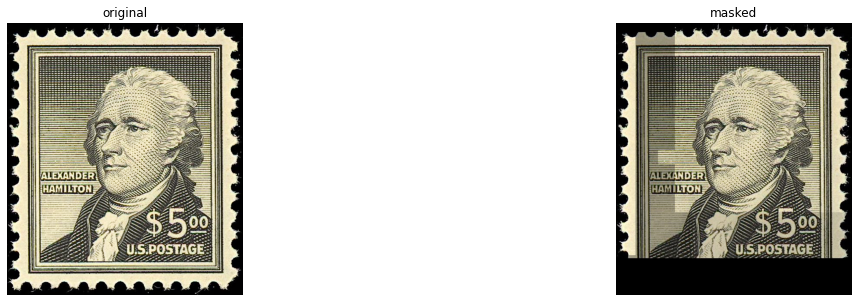

In [293]:
KVQA_VAL_PATH = '/data/diego/adv_comp_viz21/KVQAimgs/'
def get_image_path(img_id):
    image_file_path = KVQA_VAL_PATH + img_id + '.jpg'
    if not os.path.exists(image_file_path):
        exts = ['.JPG', '.JPEG', '.png', '.PNG', '.jpeg']
        for e in exts:
            image_file_path = KVQA_VAL_PATH + img_id + e
            if os.path.exists(image_file_path):
                break
    return image_file_path

def get_image_expl_vis(image_file_path, bbox_scores, bboxes, orig_img_dims):    
    orig_w = orig_img_dims.img_w.values[0]
    orig_h = orig_img_dims.img_h.values[0]
    bbox_scores = torch.tensor(bbox_scores)
    
    _, top_bboxes_indices = bbox_scores.topk(k=1, dim=-1)
    img = cv2.imread(image_file_path)
    mask = torch.zeros(img.shape[0], img.shape[1])
    #print(img.shape[0], img.shape[1])
    for index in range(len(bbox_scores)):
        [x, y, w, h] = bboxes[index]   
        x *= orig_w
        y *= orig_h
        w *= orig_w
        h *= orig_h
        
        #needed to save out bboxes as well! 
        #and rescale since they were normalized before being saved
        #print("Box",index,x,y,w,h)
        curr_score_tensor = mask[int(y):int(h), int(x):int(w)]     
        new_score_tensor = torch.ones_like(curr_score_tensor)*bbox_scores[index].item()
        mask[int(y):int(h), int(x):int(w)] = torch.max(new_score_tensor,mask[int(y):int(h), int(x):int(w)])
        
    mask = (mask - mask.min()) / (mask.max() - mask.min())
    mask = mask.unsqueeze_(-1)
    mask = mask.expand(img.shape)
    img = img * mask.cpu().data.numpy()
    cv2.imwrite('lxmert/lxmert/experiments/paper/new.jpg', img)
    masked_image = Image.open('lxmert/lxmert/experiments/paper/new.jpg')
    return masked_image

def show_bimodal_expl(qid, expl_res):
    img_id = qid.split("_")[0]
    image_file_path = get_image_path(img_id)

    orig_image = Image.open(image_file_path)
    fig, axs = plt.subplots(ncols=2, figsize=(20, 5))
    axs[0].imshow(orig_image);
    axs[0].axis('off');
    axs[0].set_title('original');
    
    orig_img_dims = imgid2dims[imgid2dims.img_id == int(img_id)]    
    #print("looking up ", img_id, "image_file_path", image_file_path, "orig_img_dims", orig_img_dims)
    
    masked_image = get_image_expl_vis(image_file_path, expl_res['image_expl'], expl_res['bboxes'], orig_img_dims)
    axs[1].imshow(masked_image);
    axs[1].axis('off');
    axs[1].set_title('masked');

    question_tokens = lxmert_tokenizer.tokenize(expl_res['sent'])
    text_scores = expl_res['text_expl']
    vis_data_records = [visualization.VisualizationDataRecord(text_scores,0,0,0,0,0, question_tokens,1)]
    visualization.visualize_text(vis_data_records)
    print("Question",qid,expl_res['sent'])
    print("TRUE ANSWER:", expl_res['true_ans'],  "PREDICTED: ", expl_res['top5'][0], "Top 1 / 5 Correct?", expl_res['top1acc'], expl_res['top5acc'])
    print("Top 5 answers:", expl_res['top5'] )
    print("Top 5 probs:", [round(v,4) for v in expl_res['top5probs']] )

#to show single question/model expl
sample_qid = list(ebert_records.keys())[38]
show_bimodal_expl(sample_qid, ebert_records[sample_qid])

Looking at Index: 6070
QID:  31300_4 : TRUE ANSWER: Yes

Question Is the person in the image an association football player?
Plain predicted: Yes
In Top 1: Correct! , In Top 5: Yes
Plain Top 5 answers: ['Yes', 'No', 'NA', 'South America', 'Australia']
Plain Top 5 probs: [3.3865, -3.1404, -9.9478, -10.814, -10.9675] ---> High Confidence


True Label,Predicted Label,Attribution Label,Attribution Score,Word Importance
0,0 (0.00),0,0.00,is the person in the image an association football player ?



Question Is the person in the image an association football player? Matić playing for Benfica in 2012
Caption predicted: Yes
In Top 1: Correct! , In Top 5: Yes
Caption Top 5 answers: ['Yes', 'No', 'Both', 'Europe', 'Person in the right']
Caption Top 5 probs: [2.8993, -2.8511, -11.5758, -11.7656, -12.21] ---> High Confidence


True Label,Predicted Label,Attribution Label,Attribution Score,Word Importance
0,0 (0.00),0,0.00,is the person in the image an association football player ? mat ##ic playing for benfica in 2012



Question Is the person in the image an association football player? Nemanja Matić playing for Benfica in 2012
EBert predicted: Yes
In Top 1: Correct! , In Top 5: Yes
EBert Top 5 answers: ['Yes', 'No', '2', 'Oceania', 'Both']
EBert Top 5 probs: [3.2251, -3.0644, -12.1469, -12.2303, -12.313] ---> High Confidence


True Label,Predicted Label,Attribution Label,Attribution Score,Word Importance
0,0 (0.00),0,0.00,is the person in the image an association football player ? ne ##man ##ja mat ##ic playing for benfica in 2012


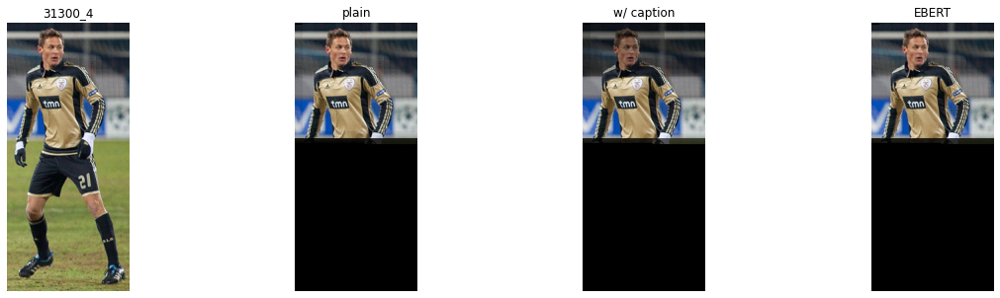

In [321]:
def show_kvqa_bimodal_expls(qid, plain_expl, capt_expl, ebert_expl):
    img_id = qid.split("_")[0]
    image_file_path = get_image_path(img_id)

    orig_image = Image.open(image_file_path)
    fig, axs = plt.subplots(ncols=4, figsize=(20, 5))
    axs[0].imshow(orig_image);
    axs[0].axis('off');
    axs[0].set_title(''+qid);
    
    orig_img_dims = imgid2dims[imgid2dims.img_id == int(img_id)]    
    #print("looking up ", img_id, "image_file_path", image_file_path, "orig_img_dims", orig_img_dims)
    
    masked_image = get_image_expl_vis(image_file_path, plain_expl['image_expl'], plain_expl['bboxes'], orig_img_dims)
    axs[1].imshow(masked_image);
    axs[1].axis('off');
    axs[1].set_title('plain');
    
    masked_image = get_image_expl_vis(image_file_path, capt_expl['image_expl'], capt_expl['bboxes'], orig_img_dims)
    axs[2].imshow(masked_image);
    axs[2].axis('off');
    axs[2].set_title('w/ caption');

    masked_image = get_image_expl_vis(image_file_path, ebert_expl['image_expl'], ebert_expl['bboxes'], orig_img_dims)
    axs[3].imshow(masked_image);
    axs[3].axis('off');
    axs[3].set_title('EBERT');
    
    
    print("QID: ",qid,": TRUE ANSWER:", plain_expl['true_ans'])
    
    i = 0
    title = ["Plain", "Caption", "EBert"]
    for expl in [plain_expl, capt_expl, ebert_expl]:
        print("\nQuestion",expl['sent'])
        print(title[i]+" predicted:", expl['top5'][0])
        print("In Top 1:", "Correct!" if expl['top1acc'] == 1 else "NopeXX", ", In Top 5:", "Yes" if expl['top5acc'] == 1 else "NoXX")
        print(title[i]+" Top 5 answers:", expl['top5'] )
        if expl['top5probs'][0] < -1:
            conf = "Low Confidence so skip"
        elif expl['top5probs'][0] > -1 and expl['top5probs'][0] < 0:
            conf = "Borderline"
        else:
            conf = "High Confidence"
        print(title[i]+" Top 5 probs:", [round(v,4) for v in expl['top5probs']], "--->", conf )

        question_tokens = lxmert_tokenizer.tokenize(expl['sent'])
        text_scores = expl['text_expl']
        vis_data_records = [visualization.VisualizationDataRecord(text_scores,0,0,0,0,0, question_tokens,1)]
        visualization.visualize_text(vis_data_records)
        i += 1
    
#possible ids: 13979, 9729, 10774
#7896, 
import random
random_index = random.randint(0,len(ebert_records))
sample_qid = list(ebert_records.keys())[random_index]
print("Looking at Index:", random_index)
show_kvqa_bimodal_expls(sample_qid, plain_records[sample_qid], capt_records[sample_qid], ebert_records[sample_qid])

In [344]:
abs_path = "/home/diego/adv_comp_viz21/lxmert/orig_code/lxmert/"
entity_spans_dict = json.load(open(abs_path + "data/kvqa/new_kvqa_q_caps_ents0502.json"))
ks = list(entity_spans_dict.keys())
random_index = random.randint(0,len(ks))
print(random_index, ks[random_index], entity_spans_dict[ks[random_index]])  #wikiCapnew
capt_ent = kvqa_qs[str(ks[random_index])]
print("\n",{'wikiCap':capt_ent['wikiCap'], 'ents':capt_ent['NamedEntities']}) #'wikiCap': 'Allison Cratchley played Melissa Gregg.',
#list(kvqa_qs.keys())[0]

"""
#1. Cases where entity doesn't appear exactly as is in wikiCap and wikiCap_new has full name "incorrectly"
15365 {'wikiCap_new': "Leonard Cohen at King's Garden, Odense, Denmark, August 17, 2013", 'ents_found': [['Leonard Cohen', 0, 13]]}
        wikiCap: Cohen at King's Garden, Odense, Denmark, August 17, 2013

13588 {'wikiCap_new': 'Garth Brooks at the We Are One concert in 2009', 'ents_found': [['Garth Brooks', 0, 12]]}
       {'wikiCap': 'Brooks at the We Are One concert in 2009', 'ents': ['Garth Brooks']}

27830 {'wikiCap_new': 'Engraving of Henry Pottinger', 'ents_found': [['Henry Pottinger', 13, 28]]}
      {'wikiCap': 'Engraving of Pottinger', 'ents': ['Henry Pottinger']}

#2 Cases where wikiCap_new == wikiCap and entity appears as is in wikiCap
35940 {'wikiCap_new': 'Statue of Lefter Küçükandonyadis at Yoğurtçu Park, close to Şükrü Saracoğlu Stadium, in Kadıköy, Istanbul.', 
        'ents_found': [['Lefter Küçükandonyadis', 10, 32]]}
      {'wikiCap': 'Statue of Lefter Küçükandonyadis at Yoğurtçu Park, close to Şükrü Saracoğlu Stadium, in Kadıköy, Istanbul.', 
        'ents': ['Lefter Küçükandonyadis']}
        
18610 {'wikiCap_new': 'Vidya Balan at a promotional event for Shaadi Ke Side Effects in 2014', 
        'ents_found': [['Vidya Balan', 0, 11]]}
       {'wikiCap': 'Vidya at a promotional event for Shaadi Ke Side Effects in 2014', 'ents': ['Vidya Balan']}
       
#3. Cases where entity doesn't appear in wikiCap and is prepended to wikiCap_new
   
46393 {'wikiCap_new': 'Charlton Heston Janet Leigh In Touch of Evil (1958)', 
       'ents_found': [['Janet Leigh', -20, -9], ['Charlton Heston', -20, -5]]}
        wikiCap: In Touch of Evil (1958)
       
46785 {'wikiCap_new': "Gaoming District Gao Zhisheng's wife Geng He speaking publicly to help her husband in 2011", 
       'ents_found': [['Gaoming District', -20, -4], ['Gao Zhisheng', 0, 12]]}
      {'wikiCap': "Gao Zhisheng's wife Geng He speaking publicly to help her husband in 2011", 'ents': ['Gaoming District', 'Gao Zhisheng']}
 
"""
print()

22962 46785 {'wikiCap_new': "Gaoming District Gao Zhisheng's wife Geng He speaking publicly to help her husband in 2011", 'ents_found': [['Gaoming District', -20, -4], ['Gao Zhisheng', 0, 12]]}

 {'wikiCap': "Gao Zhisheng's wife Geng He speaking publicly to help her husband in 2011", 'ents': ['Gaoming District', 'Gao Zhisheng']}



True Label,Predicted Label,Attribution Label,Attribution Score,Word Importance
0,0 (0.00),0,0.00,in which continent was the person in the image born ?


Question 22113_4 In which continent was the person in the image born?
TRUE ANSWER: North America PREDICTED:  North America Top 1 / 5 Correct? 1 1
Top 5 answers: ['North America', 'Europe', 'South America', 'Africa', 'Asia']
Top 5 probs: [0.5348, -0.8199, -4.8877, -5.3137, -5.6669]


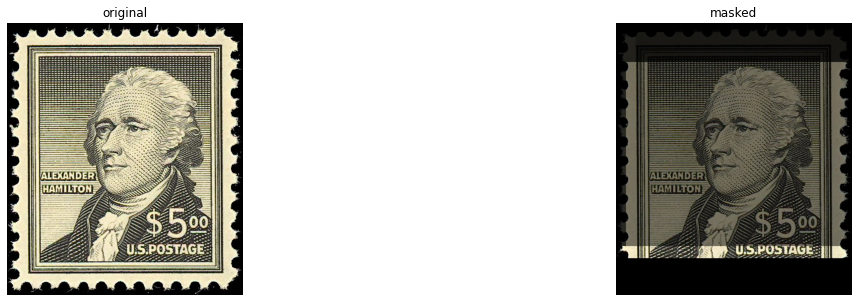

In [ ]:
correct_examples = { r:records[r] for r in records if records[r]['top1acc'] == 1 }
incorrect1_butintop5_examples = { r:records[r] for r in records if records[r]['top1acc'] == 0 and records[r]['top5acc'] == 1 }
incorrect_examples = { r:records[r] for r in records if records[r]['top1acc'] == 0 and records[r]['top5acc'] == 0 }

print("Correct: ",len(correct_examples), "out of", len(records), "= ", round(len(correct_examples)/len(records),4))
print("Incorrect but in Top 5: ",len(incorrect1_butintop5_examples), "out of", len(records), "= ", round(len(incorrect1_butintop5_examples)/len(records),4))
print("Incorrect: ",len(incorrect_examples), "out of", len(records), "= ", round(len(incorrect_examples)/len(records),5))

# now control only looking at those where they are the same vs differenct 
#img_id = 29704
#print("\nNew: ",img_id, entity_spans_dict[img_id]['wikiCap_new'])
#print("Orig: ",kvqa_qs[str(img_id)]['wikiCap'])

tot_ex, tot_diff = 0, 0
correct_ex, correct_ex_diff = {}, {}
incorrect1_butintop5_ex, incorrect1_butintop5_ex_diff = {},{}
incorrect_ex, incorrect_ex_diff = {},{}
for r in records:
    img_id = r.split("_")[0]
    if kvqa_qs[str(img_id)]['wikiCap'] == entity_spans_dict[img_id]['wikiCap_new']:
        tot_ex +=1 
        if records[r]['top1acc'] == 1:
            correct_ex[r] = records[r]
        if records[r]['top1acc'] == 0 and records[r]['top5acc'] == 1:
            incorrect1_butintop5_ex[r] = records[r]
        if records[r]['top1acc'] == 0 and records[r]['top5acc'] == 0:
            incorrect_ex[r] = records[r]
    else:
        tot_diff +=1 
        if records[r]['top1acc'] == 1:
            correct_ex_diff[r] = records[r]
        if records[r]['top1acc'] == 0 and records[r]['top5acc'] == 1:
            incorrect1_butintop5_ex_diff[r] = records[r]
        if records[r]['top1acc'] == 0 and records[r]['top5acc'] == 0:
            incorrect_ex_diff[r] = records[r]

print("\nFor ",tot_ex,"Questions where wikiCap == wikiCap_new", round(tot_ex/len(records),5))
print("Correct: ",len(correct_ex), "out of", tot_ex, "= ", round(len(correct_ex)/tot_ex,4))
print("Incorrect but in Top 5: ",len(incorrect1_butintop5_ex), "out of", tot_ex, "= ", round(len(incorrect1_butintop5_ex)/tot_ex,4))
print("Incorrect: ",len(incorrect_ex), "out of", tot_ex, "= ", round(len(incorrect_ex)/tot_ex,4))

print("\nFor ",tot_diff,"Questions where wikiCap Not equal wikiCap_new", round(tot_diff/len(records),5))
print("Correct: ",len(correct_ex_diff), "out of", tot_diff, "= ", round(len(correct_ex_diff)/tot_diff,4))
print("Incorrect but in Top 5: ",len(incorrect1_butintop5_ex_diff), "out of", tot_diff, "= ", round(len(incorrect1_butintop5_ex_diff)/tot_diff,4))
print("Incorrect: ",len(incorrect_ex_diff), "out of", tot_diff, "= ", round(len(incorrect_ex_diff)/tot_diff,4))

    
""" KVQA ebert split 3
Correct:  10236 out of 19248 =  0.5317955112219451
Incorrect but in Top 5:  3125 out of 19248 =  0.16235453034081462
Incorrect:  5887 out of 19248 =  0.3058499584372402

#Controlling for wikiCap == wikiCap_new, we get a little bump but not much (.15) from 

For  6741 Questions where wikiCap == wikiCap_new 0.35022
Correct:  3578 out of 6741 =  0.5308
Incorrect but in Top 5:  1012 out of 6741 =  0.1501
Incorrect:  2151 out of 6741 =  0.3191

For  12507 Questions where wikiCap Not equal wikiCap_new 0.64978
Correct:  6658 out of 12507 =  0.5323
Incorrect but in Top 5:  2113 out of 12507 =  0.1689
Incorrect:  3736 out of 12507 =  0.2987
"""

#  if we want we can take data/kvqa/new_kvqa_q_caps_ents0502.json
#   and add new nps_ents found 
#    by removing -20 ents from wikiCap new and ents_founds, 
#    and then finding ents in ents_found and find out what correct indexes for original ents should be
#    ( ie wikiCap and wikiCap new should be identical.  all i want is to have the correct spans where I should add slash dot )

print()

In [250]:
#LOOK AT ACCURACY BY IMG
acc_by_img_id = {}
for r in records:
    i = r.split("_")[0]
    if i not in acc_by_img_id:
        acc_by_img_id[i] = { "top1":0, "top5":0, "neither":0, "keys":[] }
    if records[r]['top1acc'] == 1:
        acc_by_img_id[i]["top1"] += 1
    elif records[r]['top5acc'] == 1:
        acc_by_img_id[i]["top5"] += 1
    else:
        acc_by_img_id[i]["neither"] += 1
    acc_by_img_id[i]['keys'].append(r)
        
all_right = [ r for r in acc_by_img_id if acc_by_img_id[r]['top5'] == 0 and acc_by_img_id[r]['neither'] == 0 ]
all_top5 =  [ r for r in acc_by_img_id if acc_by_img_id[r]['neither'] == 0 ]
all_top5nwrong = [ r for r in acc_by_img_id if acc_by_img_id[r]['top1'] == 0 ]
all_wrong = [ r for r in acc_by_img_id if acc_by_img_id[r]['top1'] == 0 and acc_by_img_id[r]['top5'] == 0 ]
all_mixed_num = len(acc_by_img_id) - (len(all_right) + len(all_top5) + len(all_top5nwrong) + len(all_wrong))

print("Unique imgs:", len(acc_by_img_id))
print("Num all right: ", len(all_right), len(all_right)/len(acc_by_img_id))
print("Num all top1 and top5: ", len(all_top5), len(all_top5)/len(acc_by_img_id))
print("Num all top5 and wrong: ", len(all_top5nwrong), len(all_top5nwrong)/len(acc_by_img_id))
print("Num all wrong: ", len(all_wrong), len(all_wrong)/len(acc_by_img_id))
print("Num mixed: ", all_mixed_num, all_mixed_num / len(acc_by_img_id))

print(list(acc_by_img_id.keys())[0])
#print(acc_by_img_id['14251'], records['14251_0']['ents'])
for r in acc_by_img_id['43793']['keys']:
    print(r,"\n\t",records[r]['sent'], "\n\t",records[r]['true_ans'],"--->",records[r]['top5'])
    print("\t", records[r]['top1acc'], records[r]['top5acc'])


""" EBERT split 3
Unique imgs: 2604
Num all right:  2 0.0007680491551459293
Num all top1 and top5:  18 0.0069124423963133645
Num all top5 and wrong:  20 0.007680491551459293
Num all wrong:  0 0.0
Num mixed:  2564 0.9846390168970814   <-- like Tiny most things are mixed 
"""
print()

Unique imgs: 2604
Num all right:  2 0.0007680491551459293
Num all top1 and top5:  18 0.0069124423963133645
Num all top5 and wrong:  20 0.007680491551459293
Num all wrong:  0 0.0
Num mixed:  2564 0.9846390168970814
43793
43793_0 
	 Who is in the left? Feodor Chaliapin and Paolo Tornaghi 
	 Feodor Chaliapin ---> ['Suraiya', 'Indira Gandhi', 'Alla Nazimova', 'Zhou Enlai', 'Rudolph Valentino']
	 0 0
43793_1 
	 Who is in the right? Feodor Chaliapin and Paolo Tornaghi 
	 Paolo Tornaghi ---> ['Suraiya', 'Indira Gandhi', 'Alla Nazimova', 'Zhou Enlai', 'El Brendel']
	 0 0
43793_2 
	 Who is to the left of Feodor Chaliapin? Feodor Chaliapin and Paolo Tornaghi 
	 Paolo Tornaghi ---> ['Indira Gandhi', 'Suraiya', 'Zhou Enlai', 'Alla Nazimova', 'Jawaharlal Nehru']
	 0 0
43793_3 
	 Who is to the right of Paolo Tornaghi? Feodor Chaliapin and Paolo Tornaghi 
	 Feodor Chaliapin ---> ['Suraiya', 'Indira Gandhi', 'Alla Nazimova', 'Zhou Enlai', 'Rudolph Valentino']
	 0 0
43793_4 
	 Who among the people in t

In [252]:
# DO ACC BY NUM ENTS
acc_by_numents = {}
for r in records:
    i = records[r]['ents']
    if i not in acc_by_numents:
        acc_by_numents[i] = { "top1":0, "top5":0, "neither":0, "keys":[] }
    if records[r]['top1acc'] == 1:
        acc_by_numents[i]["top1"] += 1
    elif records[r]['top5acc'] == 1:
        acc_by_numents[i]["top5"] += 1
    else:
        acc_by_numents[i]["neither"] += 1
    acc_by_numents[i]['keys'].append(r)
        
for i in acc_by_numents:
    r = acc_by_numents[i]
    rt1, rt5, rn = r['top1'], r['top5'], r['neither']
    ra = len(r['keys'])
    print(i, ra, rt1, round(rt1/ra,4), rt5, round(rt5/ra,4), rn, round(rn/ra,4))

qid = acc_by_numents[5]['keys'][0]
img_id = qid.split("_")[0]
print(acc_by_img_id[img_id])
tot_right = 0
tot = 0
new_skipped = 0
new_right = 0

for r in acc_by_img_id[img_id]['keys']:
    print(r,"\n\t",records[r]['sent'], "\n\t",records[r]['true_ans'],"--->",records[r]['top5'])
    print("\t", records[r]['top1acc'], records[r]['top5acc'], records[r]['top5probs'])
    tot += 1
    if records[r]['top1acc']:
        tot_right += 1
        
    if records[r]['top5probs'][0] < -1:
        conf = "Low Confidence so skip"
        new_skipped += 1
    else:
        if records[r]['top1acc']:
            new_right += 1

        if records[r]['top5probs'][0] > -1 and records[r]['top5probs'][0] < 0:
            conf = "Borderline"
        else:
            conf = "High Confidence"

    print("\t", conf)
    #sample_qid = r
    #show_bimodal_expl(sample_qid, records[sample_qid])
print("Normal ACC:", tot_right, "/", tot, "=", round(tot_right/tot,4))
print("Counter ACC:", new_right, "/", (tot - new_skipped), "=", round(new_right/(tot - new_skipped),4))


## USING EBERT split 3 full
"""
i, num, top1, pct , top5,  pct, wrong, pct
1 13778 7826 0.568  1766 0.1282 4186 0.3038     #so with 1 ents its best chance and goes down from there
2  4507 2098 0.4655 1074 0.2383 1335 0.2962
3   679  224 0.3299  199 0.2931  256 0.377
4   211   65 0.3081   60 0.2844   86 0.4076
5    73   23 0.3151   26 0.3562   24 0.3288

{'top1': 5, 'top5': 7, 'neither': 5, 'keys': ['1223_0', '1223_1', ... ]}

# Normal ACC: 5 / 17 = 0.2941
# Counter ACC: 4 / 8 = 0.5     <--- using calibration this is top1 ... TODO: add top 5
"""

print()

2 4507 2098 0.4655 1074 0.2383 1335 0.2962
1 13778 7826 0.568 1766 0.1282 4186 0.3038
3 679 224 0.3299 199 0.2931 256 0.377
4 211 65 0.3081 60 0.2844 86 0.4076
5 73 23 0.3151 26 0.3562 24 0.3288
{'top1': 5, 'top5': 7, 'neither': 5, 'keys': ['1223_0', '1223_1', '1223_2', '1223_3', '1223_4', '1223_5', '1223_6', '1223_7', '1223_8', '1223_9', '1223_10', '1223_11', '1223_12', '1223_13', '1223_14', '1223_15', '1223_16']}
1223_0 
	 Who is in the left? Sergey Lavrov Ban Ki-moon Hillary Clinton Tony Blair Ashton (far right) with the rest of the Quartet on the Middle East (2010) 
	 Tony Blair ---> ['Barack Obama', 'Michelle Obama', 'Hillary Clinton', 'Dmitry Medvedev', 'Vladimir Putin']
	 0 0 [-2.34442, -2.71344, -2.92764, -3.11269, -3.28154]
	 Low Confidence so skip
1223_1 
	 Who is in the right? Sergey Lavrov Ban Ki-moon Hillary Clinton Tony Blair Ashton (far right) with the rest of the Quartet on the Middle East (2010) 
	 Catherine Ashton ---> ['Barack Obama', 'Michelle Obama', 'Hillary Clint

In [253]:
# DO ACC BY Q TYPE ( TODO: pull in question data here )
#!wget http://www.diegoolano.com/files/kvqa_dataset_with_entity_info_and_ref_imgs_v6cum.json   

import json
with open("kvqa_dataset_with_entity_info_and_ref_imgs_v6cum.json","r") as f:
    kvqa_qs = json.load(f)

In [254]:
sample_id = list(kvqa_qs.keys())[0]
#print(sample_id, kvqa_qs[sample_id])
# ['NamedEntities', 'imgPath', 'ParaQuestions', 
# 'Qids', 'Questions', 'split', 'wikiCap', 'Answers', 
# 'Type of Question', 'Entities', 'ref_imgs', 'img_equals_ref', 'contains_no_ref', 'contains_img_eq_ref', 
# 'mtcnn_res', 'img_width', 'img_height']


qid2qtype = {}
qs, qerrs = 0, []
for imgid in list(kvqa_qs.keys()):
    imgdata = kvqa_qs[imgid]
    for i,q in enumerate(imgdata['Questions']):
        qs += 1
        qid = imgid + "_" +str(i)
        try:
            qid2qtype[qid] = imgdata['Type of Question'][i]
        except Exception as e:
            #print("Error on ",qid,len(imgdata['Questions']), len(imgdata['Type of Question']))#, imgdata['Type of Question'])
            qid2qtype[qid] = []
            qerrs.append(qid)
print("no question type for ", len(qerrs), "out of ", qs)  #68 out of  183007

qtype_res = {'1-hop': {'correct':0,'total':0}, 'multi-hop':{'correct':0,'total':0}}
c = 0
for r in records:
    #print(r, qid2qtype[r])
    qtypes = qid2qtype[r]
    level = '1-hop'
    if '1-hop' not in qtypes:
        level = 'multi-hop'
        
    qtype_res[level]['total'] +=1
    if records[r]['top1acc'] == 1:
        qtype_res[level]['correct'] +=1
    for qt in qtypes:
        if qt != level:
            if qt not in qtype_res[level]:
                qtype_res[level][qt] = {'correct':0,'total':0}
            qtype_res[level][qt]['total'] +=1
            if records[r]['top1acc'] == 1:
                qtype_res[level][qt]['correct'] +=1

for level in ['1-hop', 'multi-hop']:
    qtype_res[level]['pct'] = round(qtype_res[level]['correct']/ qtype_res[level]['total'],4)
    print("\n"+level)
    for k in list(qtype_res[level].keys()):
        #print(str(type(qtype_res[level][k])))
        if type(qtype_res[level][k]) == dict:
            qtype_res[level][k]['pct'] = round(qtype_res[level][k]['correct']/ qtype_res[level][k]['total'],4)
        print(k, qtype_res[level][k])
   

""" EBERT split 3 full
no question type for  68 out of  183007

1-hop:
correct 7135
total 14437
pct 0.4942
Multi-Relation {'correct': 3271, 'total': 6794, 'pct': 0.4815}
       boolean {'correct': 4333, 'total': 4906, 'pct': 0.8832}
  Multi-Entity {'correct': 2968, 'total': 3673, 'pct': 0.8081}
    comparison {'correct': 2379, 'total': 2745, 'pct': 0.8667}
       spatial {'correct':   40, 'total': 1488, 'pct': 0.0269}   <--- super bad
   subtraction {'correct':   39, 'total': 1334, 'pct': 0.0292}   <--- super bad
      counting {'correct': 1019, 'total': 1163, 'pct': 0.8762}
  intersection {'correct':  343, 'total':  437, 'pct': 0.7849}


Italy {'correct': 0, 'total': 1, 'pct': 0.0}  <<-- ERROR in data


multi-hop:
correct 3101
total 4811
pct 0.6446
Multi-Relation {'correct': 2835, 'total': 4050, 'pct': 0.7}
       boolean {'correct':  473, 'total':  645, 'pct': 0.7333}
  Multi-Entity {'correct': 1232, 'total': 2106, 'pct': 0.585}
    comparison {'correct':  159, 'total':  327, 'pct': 0.4862}
      counting {'correct':  497, 'total':  704, 'pct': 0.706}
1-hop subtract {'correct':  185, 'total':  648, 'pct': 0.2855} <-- bad
  intersection {'correct':  234, 'total':  323, 'pct': 0.7245}
1-hop counting {'correct':   77, 'total':  109, 'pct': 0.7064}

"""

print()

no question type for  68 out of  183007

1-hop
correct 7135
total 14437
spatial {'correct': 40, 'total': 1488, 'pct': 0.0269}
comparison {'correct': 2379, 'total': 2745, 'pct': 0.8667}
Multi-Entity {'correct': 2968, 'total': 3673, 'pct': 0.8081}
Multi-Relation {'correct': 3271, 'total': 6794, 'pct': 0.4815}
counting {'correct': 1019, 'total': 1163, 'pct': 0.8762}
intersection {'correct': 343, 'total': 437, 'pct': 0.7849}
boolean {'correct': 4333, 'total': 4906, 'pct': 0.8832}
subtraction {'correct': 39, 'total': 1334, 'pct': 0.0292}
Italy {'correct': 0, 'total': 1, 'pct': 0.0}
pct 0.4942

multi-hop
correct 3101
total 4811
1-hop subtraction {'correct': 185, 'total': 648, 'pct': 0.2855}
comparison {'correct': 159, 'total': 327, 'pct': 0.4862}
Multi-Entity {'correct': 1232, 'total': 2106, 'pct': 0.585}
counting {'correct': 497, 'total': 704, 'pct': 0.706}
Multi-Relation {'correct': 2835, 'total': 4050, 'pct': 0.7}
intersection {'correct': 234, 'total': 323, 'pct': 0.7245}
boolean {'correc

In [ ]:
# SHOW SELECTION OF CORRECT VS INCORRECT 
# IS explainability for EBERT examples correct?  <-- very important
# SHould I be using method = ours_nolrp?

# Run full experiments for plain, caption, and ebert( when you've figured out accuracy issue ( and ebert works )

# How to calculate difference between experiments

In [ ]:
# THE BELOW WAS JUST TO DEBUG THE DIFFERENCE BETWEEN THE CODE BASES THAT WAS CAUSING THE DIFFERENCE IN ACC
# IT TURNS OUT IT WASN'T THE CODE, but rather that the new code install torch 1.7.0  and the other expected 1.8.0
# see lxmert_gen_integ_notes for more details

In [193]:
!pwd  #/home/diego/adv_comp_viz21/lxmert/orig_code/lxmert_gen/Transformer-MM-Explainability-main

/home/diego/adv_comp_viz21/lxmert/orig_code/lxmert_gen/Transformer-MM-Explainability-main


In [236]:
# LOOKING AT DIFF BETWEEN OLD AND NEW SYSTEMS
"""

"""
import json
#/home/diego/adv_comp_viz21/lxmert/orig_code/lxmert_gen/Transformer-MM-Explainability-main
prior_ebert0_res = "../../lxmert/snap/kvqa/kvqa_ebert_sp0_results_0/test_predict0.json"
new_ebert0_res = "../../lxmert_gen/Transformer-MM-Explainability-main/experiments/kvqa_ebert_0_830.json"

prior_ebert0_res = "../../lxmert/snap/kvqa/kvqa_ebert_sp4_results_4/test_predict4.json"
new_ebert0_res = "../../lxmert_gen/Transformer-MM-Explainability-main/experiments/kvqa_ebert_4_0901.json"

#prior_ebert0_res = "../../lxmert/snap/kvqa/kvqa_ebert_sp3_results_3/test_predict3.json"  #prior initial with 53
#new_ebert0_res = "../../lxmert_gen/Transformer-MM-Explainability-main/experiments/kvqa_ebert_3_0901.json"  #gives bad 50%

#using lxmo in lxmert ( prior code )
prior_ebert0_res = "../../lxmert/snap/kvqa/kvqa_ebert_sp3_test_lxmo_env_3/test_predict3.json"  
#gives same good 53 results as prior initial

#using lxmert_expl in lxmert_gen
#prior_ebert0_res = "../../lxmert_gen/snap/kvqa/kvqa_ebert_sp3_test_env_3/test_predict3.json"   
#gives new bad 50 results

#using lxmert_expl in lxmert
#prior_ebert0_res = "../../lxmert/snap/kvqa/kvqa_ebert_sp3_test_expl_env_3/test_predict3.json"  
#gives same bad 50 results

#using newlxmo in lxmert_gen ( new code )
new_ebert0_res = "../../lxmert_gen/Transformer-MM-Explainability-main/experiments/kvqa_ebert_3_newlxmo_0901.json"



#prior_ebert0_res = "../../lxmert/snap/kvqa/kvqa_ebert_sp2_results_2/test_predict2.json"
#new_ebert0_res = "../../lxmert_gen/Transformer-MM-Explainability-main/experiments/kvqa_ebert_2_0901.json"



with open(prior_ebert0_res, "r") as fp:
    prior_eb0 = json.load(fp)
    
with open(new_ebert0_res, "r") as fp:
    new_eb0 = json.load(fp)
    
# SPLIT 0: both have 18697
# SPLIT 2: both have 18696
# SPLIT 3: both have 19248
# SPLIT 4: both have 18120
print(len(prior_eb0), len(new_eb0), type(prior_eb0), type(new_eb0))  

19248 19248 <class 'list'> <class 'dict'>


In [237]:
print(prior_eb0[0])  #{'answer': 'Yes', 'question_id': '22511_0'}   #TODO, improve these prior dumped out results!!
#prior_ks = list(prior_eb0.keys())
#new_ks = list(new_eb0.keys())

prior_dict = { p['question_id']: p['answer'] for p in prior_eb0 }
comb_res = {}
for qid in prior_dict:
    comb_res[qid] = {'prior_ans': prior_dict[qid], 'new_ans': new_eb0[qid]}
    
#print("\n",comb_res['22511_0'])

{'answer': 'Suraiya', 'question_id': '43793_0'}


In [238]:
acc_prior, acc_new = 0, 0
same_preds_right, same_preds_wrong, diff_preds_bothwrong, diff_preds_newright, diff_preds_oldright = [],[],[],[],[]
for qid in comb_res:
    ans = comb_res[qid]['new_ans']['true_ans']
    pred_new = comb_res[qid]['new_ans']['top5'][0]
    pred_prior = comb_res[qid]['prior_ans']
    acc_new += comb_res[qid]['new_ans']['top1acc']
    acc_prior += 1 if pred_prior == ans else 0
    if pred_new == pred_prior:
        if pred_prior == ans:
            same_preds_right.append([qid,pred_new,pred_prior])
        else:
            same_preds_wrong.append([qid,pred_new,pred_prior])
    elif comb_res[qid]['new_ans']['top1acc'] == 1 and pred_prior != ans:
        diff_preds_newright.append([qid,pred_new,pred_prior])
    elif comb_res[qid]['new_ans']['top1acc'] == 0 and pred_prior == ans:
        diff_preds_oldright.append([qid,pred_new,pred_prior])        
    else:
        diff_preds_bothwrong.append([qid,pred_new,pred_prior])
        
n = len(comb_res)
print("Prior/New",acc_prior, acc_new, n, round(acc_prior/n,4), round(acc_new/n,4))  #they differ by 11
print("\nSame Preds right:",len(same_preds_right), round(len(same_preds_right)/n,4))
print("Same Preds wrong:",len(same_preds_wrong), round(len(same_preds_wrong)/n,4))
print("Diff Preds both wrong:",len(diff_preds_bothwrong), round(len(diff_preds_bothwrong)/n,4))
print("Diff Preds prior right:", len(diff_preds_oldright), round(len(diff_preds_oldright)/n,4))
print("Diff Preds new right:", len(diff_preds_newright), round(len(diff_preds_newright)/n,4))

print("Total", len(same_preds_right) + len(same_preds_wrong) + len(diff_preds_oldright) + len(diff_preds_newright) + len(diff_preds_bothwrong) )

""" 

"""
print()

Prior/New 10236 10236 19248 0.5318 0.5318

Same Preds right: 10236 0.5318
Same Preds wrong: 9011 0.4682
Diff Preds both wrong: 1 0.0001
Diff Preds prior right: 0 0.0
Diff Preds new right: 0 0.0
Total 19248



In [255]:
# TINY SCRATCH BELOW !!

def prep_val_ques_dict(val_ans):
    q2eval = {}
    for ans_set in val_ans['annotations']:        
        dlabel = {}
        for ans_dict in ans_set['answers']:
            ans = ans_dict['answer']
            if ans not in dlabel:
                dlabel[ans] = 0
            dlabel[ans] += 1              
        sum_labs = sum([dlabel[a] for a in dlabel])
        for a in dlabel:
            dlabel[a] = min(dlabel[a]/3,1)
        q2eval[str(ans_set['question_id'])] = dlabel
    return q2eval
q2eval = prep_val_ques_dict(val_ans)

In [721]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def show_ok_image(img, img_set="val", img_dir = "/data/diego/adv_comp_viz21/okvqa/img_data/"):
  t = "COCO_train2014_" if img_set == "train" else "COCO_val2014_"  
  fullpath = img_dir + t + img
  print("SHOWING:",fullpath)

  fig, axs = plt.subplots(ncols=1, figsize=(20, 20))
  img = mpimg.imread(fullpath)
  axs.imshow(img)


val_qs = json.load(open(OKVQA_DATA_ROOT + "OpenEnded_mscoco_val2014_questions.json"))   
val_ans = json.load(open(OKVQA_DATA_ROOT + "mscoco_val2014_annotations.json"))

valqid2imgid = { q['question_id']: ("0" * (12 - len(str(q['image_id'])))) + str(q['image_id']) + ".jpg" for q in val_qs['questions'] }

SHOWING: /data/diego/adv_comp_viz21/okvqa/img_data/COCO_val2014_000000166979.jpg


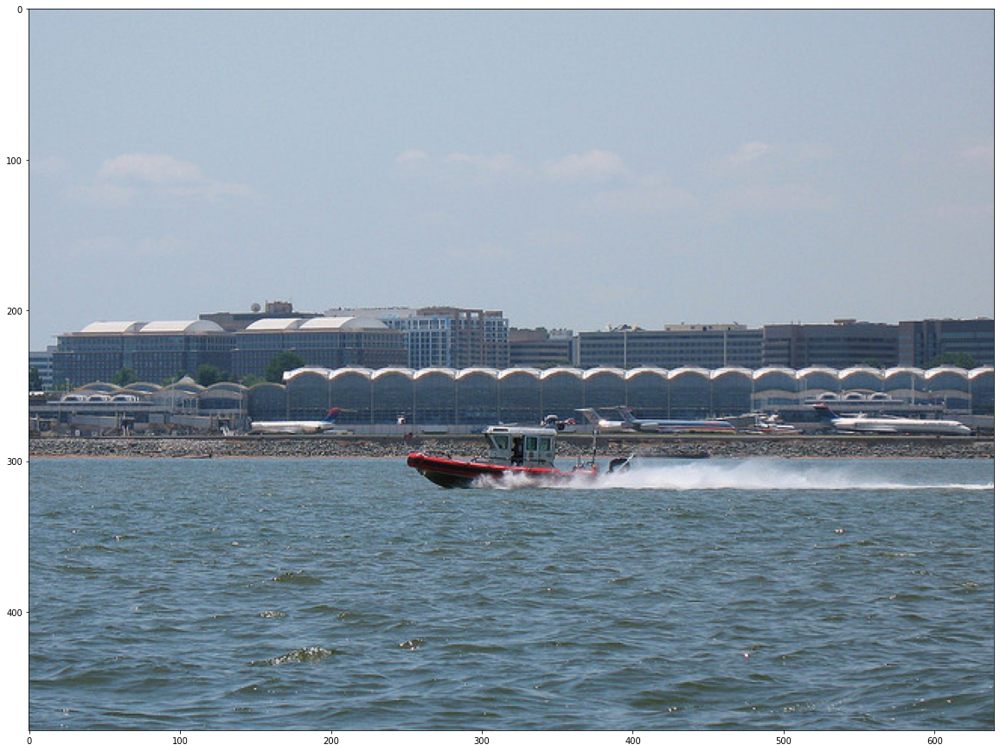

In [723]:
qid = 1669795 #4800005
show_ok_image(valqid2imgid[qid])


# THOUGHT: Can we use TOP 5 answer sets "sameness" between models as a notion of difficulty?  
# ie, if all the models agree in the top5 ( just different orders ) that is probably easier than a question
# where the models give all varied answers.

In [725]:
a = ['1669795', '4566385',  '4626875',  '4181095', '1635895', '2368665', '30015', '1643055', '2854975', '584726']
len(a)

10

In [727]:
a = [  101,  2040,  2003,  1996,  2711,  1999,  1996,  3746,  1029,   100, 4300,  8945,  3126,  5428,  2121,   100,  2004, 25182,  1010,  4976, 102]
b = ['[CLS]', 'who', 'is', 'the', 'person', 'in', 'the', 'image', '?', '[UNK]', 'arthur', 'bo', '##ur', '##chi', '##er', '[UNK]', 'as', 'macbeth', ',', '1910', '[SEP]']
len(a), len(b)

(21, 21)

In [742]:
import torch
n = np.zeros(shape=(1, 21,768), dtype=np.float32) 
a = torch.tensor(n, dtype=torch.float32)

In [743]:
a.size()

torch.Size([1, 21, 768])

In [749]:
a[:,:,0].size()

torch.Size([1, 21])

In [751]:
a.dtype


torch.float32

In [752]:
n = np.zeros(shape=(1, 21,768)) 
a = torch.tensor(n)
a.dtype

torch.float64

In [758]:
n = np.zeros(shape=(1, 21,768), dtype=np.int64) 
a = torch.tensor(n, dtype=torch.int64)
a.dtype

torch.int64

In [759]:
n = np.zeros(shape=(1, 21,768), dtype=np.float32) 
a = torch.tensor(n, dtype=torch.float32)
word_emb_2d = a[:,:,0]
token_type_ids = torch.zeros_like(word_emb_2d, dtype=torch.int64)
token_type_ids.dtype, token_type_ids.size()

(torch.int64, torch.Size([1, 21]))

In [761]:
a.size()

torch.Size([1, 21, 768])

In [786]:
n = np.ones(shape=(32, 21)) 
a = torch.tensor(n)
v = np.zeros_like(a[-1,:])
#v6 = np.repeat(v,6,axis=0) wrong
v6 = np.tile(v,(6,1))
b = torch.tensor(v)
b6 = torch.tensor(v6)
print(a.size(), v.shape, v6.shape)
print(b.size(),b.unsqueeze(0).size())
z = torch.cat([a,b.unsqueeze(0)], axis=0)
z6 = torch.cat([a,b6], axis=0)
a = torch.cat([a,b6], axis=0)
z.size(), z6.size(), a.size()

torch.Size([32, 21]) (21,) (6, 21)
torch.Size([21]) torch.Size([1, 21])


(torch.Size([33, 21]), torch.Size([38, 21]), torch.Size([38, 21]))

In [790]:
#REMOVE 100 "UNK" from ids
b = torch.tensor([ 1998,  2413,   100,  2343,  9473, 18906,  3683,  9096,   100,   102])
b[b!=100]

tensor([ 1998,  2413,  2343,  9473, 18906,  3683,  9096,   102])

In [796]:
a = json.load(open(abs_path + "data/okvqa/okvqa_ent_spans_sept08_cleaned.json"))             #4 span
b = json.load(open(abs_path + "data/okvqa/okvqa_ent_spans_sept08_cleaned_filtered.json"))  

In [797]:
b[0:10]

[[['hairstyle', 12, 21, 'Hairstyle']],
 [['canada', 29, 35, 'Canada']],
 [],
 [['rail company', 6, 18, 'List of railway companies'],
  ['new mexico', 44, 54, 'New Mexico']],
 [['water activity', 37, 51, 'Water activity'],
  ['swimming', 11, 19, 'Swimming']],
 [],
 [['sporting equipment', 23, 41, 'Sports equipment']],
 [],
 [],
 [['american president', 6, 24, 'President of the United States'],
  ['stuffed animal', 53, 67, 'Stuffed toy']]]